In [1]:
%matplotlib notebook

In [2]:
import sys
sys.path.append("../../")

import qgrid

import dmp.data.logging as log
import pandas as pd
import gc
import time
import asyncpg
import asyncio
import os
import json
import datetime
import sqlalchemy


from os import listdir
from os.path import isfile, join
import json
import tensorflow
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import re
from matplotlib.lines import Line2D
from pprint import pprint
# import seaborn
# sns.set_theme()
np.set_printoptions(threshold=10000)
plt.rcParams['figure.figsize'] = 10, 8

# import seaborn
# sns.set_theme()


2021-09-28 12:35:20.494225: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


In [3]:
_database = "dmp"
try:
    filename = os.path.join(os.environ['HOME'], ".jobqueue.json")
    _data = json.loads(open(filename).read())
    _credentials = _data[_database]
    user = _credentials["user"]
except KeyError as e:
    raise Exception("No credetials for {} found in {}".format(_database, filename))
connection_string = 'postgresql://{user}:{password}@{host}:5432/{database}'.format(**_credentials)
# connection_string = 'postgresql+asyncpg://{user}:{password}@{host}:5432/{database}'.format(**_credentials)
del _credentials['table_name']


In [4]:
db = sqlalchemy.create_engine(connection_string)

def query_scalar(query_string):
    with db.connect() as engine:
        return db.engine.execute(q).scalar()
    

def query_dataframe(query_string):
    with db.connect() as engine:
        return pd.read_sql(
            query_string,
            engine.execution_options(stream_results=False), coerce_float=False)

def query_materialized_dataframe(query_clause, additional_columns = []):
    exp_table = 'materialized_experiments_0'
    columns = '''"id", "name", "timestamp", "job", "groupname", "jobid",
           "iterations", "loss", "num_classes", "num_features", "num_inputs",
           "num_observations", "num_outputs", "num_weights", "run_name", "task",
           "test_loss", "val_loss", "config.activation", "config.budget",
           "config.dataset", "config.depth", "config.early_stopping.baseline",
           "config.early_stopping.min_delta", "config.early_stopping.mode",
           "config.early_stopping.monitor", "config.early_stopping.patience",
           "config.log", "config.mode", "config.name", "config.num_hidden",
           "config.residual_mode", "config.run_name", "config.test_split",
           "config.topology"'''
    for column in additional_columns:
        columns += f', "{column}"'
#     if fetch_doc:
#         columns += ', "doc"'
#     if fetch_history:
#         columns += ', "history_loss",  "history_hinge",  "history_accuracy",  "history_val_loss",  "history_val_hinge",  "history_val_accuracy",  "history_squared_hinge",  "history_cosine_similarity",  "history_val_squared_hinge",  "history_mean_squared_error",  "history_mean_absolute_error",  "history_val_cosine_similarity",  "history_val_mean_squared_error",  "history_root_mean_squared_error",  "history_val_mean_absolute_error",  "history_kullback_leibler_divergence",  "history_val_root_mean_squared_error", "history_mean_squared_logarithmic_error",  "history_val_kullback_leibler_divergence",  "history_val_mean_squared_logarithmic_error"'
        
    query_string = (('SELECT ' + columns + ' FROM "%s" ') % (exp_table, )) + query_clause
    datasets = query_dataframe(query_string)
    datasets['loss'] = pd.to_numeric(datasets['loss'])
    datasets['test_loss'] = pd.to_numeric(datasets['test_loss'])
    datasets['val_loss'] = pd.to_numeric(datasets['val_loss'])
    datasets['iterations'] = pd.to_numeric(datasets['iterations'])
    datasets['config.budget'] = pd.to_numeric(datasets['config.budget'])
    datasets['config.depth'] = pd.to_numeric(datasets['config.depth'])
    datasets['topology'] = datasets['config.topology'] + ('' if datasets['config.residual_mode'] is None else ' ' + datasets['config.residual_mode'])
    if 'doc' in datasets.columns:
        datasets = datasets.join(pd.json_normalize(datasets["doc"]), rsuffix='doc')
    return datasets
    
    

def postprocess_dataframe(data_log):
    datasets = pd.json_normalize(data_log["doc"])
    data_log.drop(['doc'], axis=1)
    datasets = datasets.join(data_log)
    datasets['id'] = datasets.astype({'id': 'str'}).dtypes
    datasets['job'] = datasets.astype({'job': 'str'}).dtypes
    return datasets

def query_log_result(query_string):
    return postprocess_dataframe(query_dataframe(query_string))


In [5]:
from matplotlib.ticker import FormatStrFormatter

def generate_colors(numColors, colormapName='rainbow'):#'nipy_spectral plasma'): #gist_rainbow
    cm = plt.get_cmap(colormapName)
    cNorm  = mpl.colors.Normalize(vmin=0, vmax=numColors-1)
    scalarMap = mpl.cm.ScalarMappable(norm=cNorm, cmap=cm)
    return [scalarMap.to_rgba(i) for i in range(numColors)]
    
def split_dataframe_into_groups(df, cols):
    grouped = df.groupby(cols) #, as_index=False)
    return [grouped.get_group(group) for group in grouped.groups], list(grouped.groups.keys())
    
def distStats(vals):
    return vals.mean(), vals.median(), vals.quantile(.25), vals.quantile(.75)

def getSeriesStack(aggregationGroups, extractor):
    stats = []
    for aggregationGroup in aggregationGroups:
            stats.append(distStats(extractor(aggregationGroup)))
    return np.vstack(stats)

def plot_each(
    datasets,
    groups,
    xlabel,
    ylabel,
#     seriesColumns = ['config.budget'],
    aggregationColumns = ['config.depth'],
    xFunction=lambda dataset : dataset['config.depth'], 
    yFunction=lambda dataset : dataset['config.depth'],
    legendFunction= lambda groupName : '{}'.format(groupName),
#     plotFunction=lambda x, y, code, color : plt.semilogy(x,y,code, color=color),
    legend=None,
    show=True,
    yScale = 'linear',
    xScale = 'linear',
    alpha = .05,
    plot_median = True,
    ):
    
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    ax.set_yscale(yScale)
    ax.set_xscale(xScale)
    
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    

    series, groupNames = split_dataframe_into_groups(datasets, groups)
    legend = list(map(legendFunction, groupNames))
    colors = generate_colors(len(series))
#     colors = [plt.cm.tab20(i) for i in range(0,20,2)]
    for i, series in enumerate(series):
        aggregationGroups, _ = split_dataframe_into_groups(series, aggregationColumns)
        
        x = getSeriesStack(aggregationGroups, xFunction)
        y = getSeriesStack(aggregationGroups, yFunction)
        
        color = colors[i]
#         pyplot.plot(x[:,0], y[:,0], 'x--', color=colors[i])
        if plot_median:
            plt.plot(x[:,1], y[:,1], 'x--', color=color)
            plt.plot(x[:,0], y[:,0], '+', color=color)
        else:
            plt.plot(x[:,1], y[:,1], '+', color=color)
            plt.plot(x[:,0], y[:,0], 'x--', color=color)
            
#         plt.fill_between(x[:,1], y[:,2], y[:,3], color=color, alpha=alpha)
#         plotFunction(xValues, yValues, 'x--', color=colors[i])
    
    if legend is not None:
        # Shrink current axis by 20%
        box = ax.get_position()
        ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

        # Put a legend to the right of the current axis
        lines = [Line2D([0], [0], color=color, lw=2) for color in colors]
        ax.legend(lines, legend, loc='center left', bbox_to_anchor=(1, 0.5))
#         ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

        
    
    plt.tick_params(axis='y', which='minor')
    
    if yScale == 'log':
        minorLocator = mpl.ticker.LogLocator(subs=list(range(2,10)))
        minorFormatter = mpl.ticker.FormatStrFormatter('%5.4f')
        ax.xaxis.set_minor_locator(minorLocator)
        ax.xaxis.set_minor_formatter(minorFormatter)
        
    if show:
        plt.show()
    
    return fig, ax

def plot_each_by_depth(
    *args, show = True, **kwargs
    ):
    
    fig, ax = plot_each(*args, show = False, **kwargs)
    
    ax.set_xticks(range(2, 21))
        
    if show:
        plt.show()
        
    return fig, ax

In [7]:
def plot_datasets(datasets, groups):
#     plot_each_by_depth(datasets, groups,
#         'depth',
#         'median validation loss',
#         yFunction=lambda dataset: dataset['val_loss'], 
#         yScale='log'
#         )
    plot_each_by_depth(datasets, groups,
        'depth',
        'mean validation loss',
        yFunction=lambda dataset: dataset['val_loss'], 
        yScale='log',
        plot_median = False,
        )
#     plot_each_by_depth(datasets, groups,
#         'depth',
#         'median iterations',
#         yScale='log',
#         yFunction=lambda dataset: dataset['iterations'],
#         )
#     plot_each_by_depth(datasets, groups,
#         'depth',
#         'mean iterations',
#         yFunction=lambda dataset: dataset['iterations'],
#         yScale='log',
#         plot_median = False,
#         )
#      plotEach(datasets, groups,
#          '# parameters',
#          'validation loss',
#          xFunction=lambda dataset: dataset['num_weights'], 
#          yFunction=lambda dataset: dataset['val_loss'], 
#          yScale='log',
#          xScale='log'
#          )
#     plotEach(datasets, 
#          'depth',
#          '# weights',
#          xFunction=lambda dataset: dataset['config.depth'],
#          yFunction=lambda dataset: dataset['num_weights'], 
#          )
#     plotEach(datasets, 
#          'width',
#          '# weights',
#          xFunction=lambda dataset: dataset['config.width'],
#          yFunction=lambda dataset: dataset['num_weights'], 
#          )
#     plotEach(datasets, groups,
#         'depth',
#         'training loss',
#         yFunction=lambda dataset: dataset['loss'], 
#         yScale='log'
#         )
#     plotEach(datasets, 
#              'width',
#              'validation loss',
#              xFunction=lambda dataset: dataset['width'], 
#              yFunction=lambda dataset: dataset['val_loss'], 
#              yScale='log',
#              xScale='log'
#              )
#     plotEach(datasets, 
#              'width',
#              'training loss',
#              xFunction=lambda dataset: dataset['width'], 
#              yFunction=lambda dataset: dataset['loss'], 
#              yScale='log',
#              xScale='log'
#              )
#     plotEach(datasets, 
#              '# parameters',
#              'training loss',
#              xFunction=lambda dataset: dataset['num_weights'], 
#              yFunction=lambda dataset: dataset['loss'], 
#              yScale='log'
#              )

def plot_for_each(datasets, columns, groups, values):
    if len(columns) == 0:
        print(values)
        plot_datasets(datasets, groups)
    else:
        column = columns[0]
        for value in pd.unique(datasets[column]):
            values[column] = value
            plot_for_each(datasets[datasets[column] == value], columns[1:], groups, values)

def plot_dataset(dataset):
    datasets = query_materialized_dataframe('''WHERE "groupname" IN ('fixed_01') AND "config.dataset" = '%s' ''' % (dataset, ))
    plot_for_each(datasets, ['config.topology', 'config.residual_mode'], ['config.budget'], {})

{'config.topology': 'wide_first', 'config.residual_mode': 'full'}


<IPython.core.display.Javascript object>


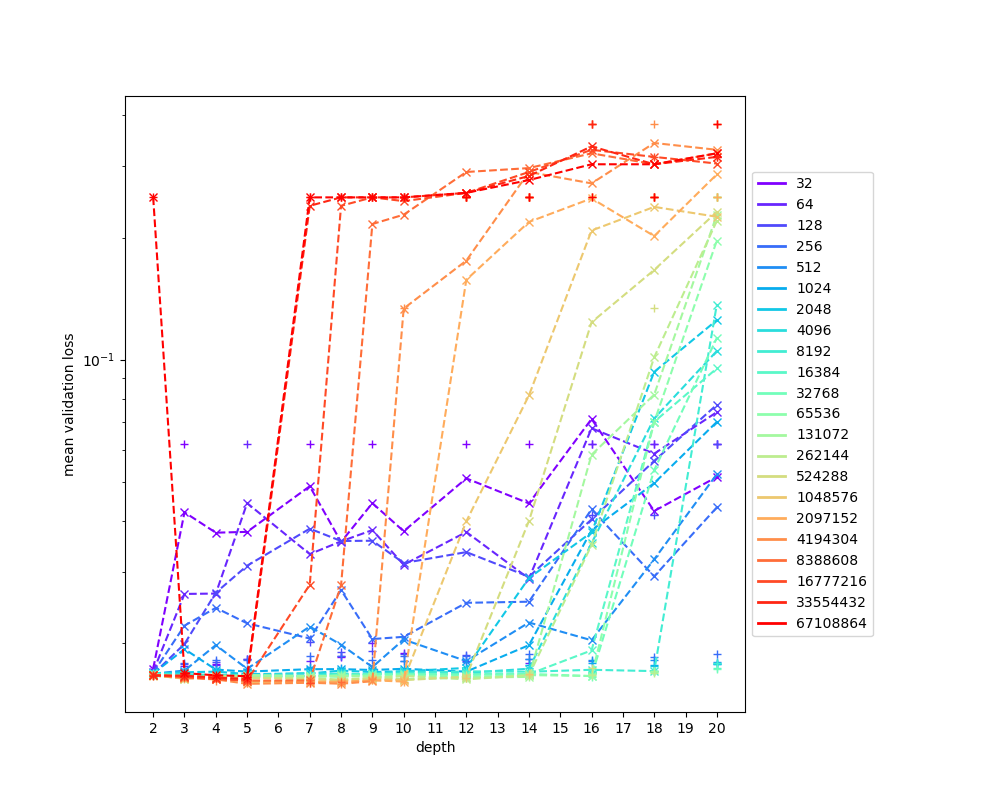

{'config.topology': 'wide_first', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


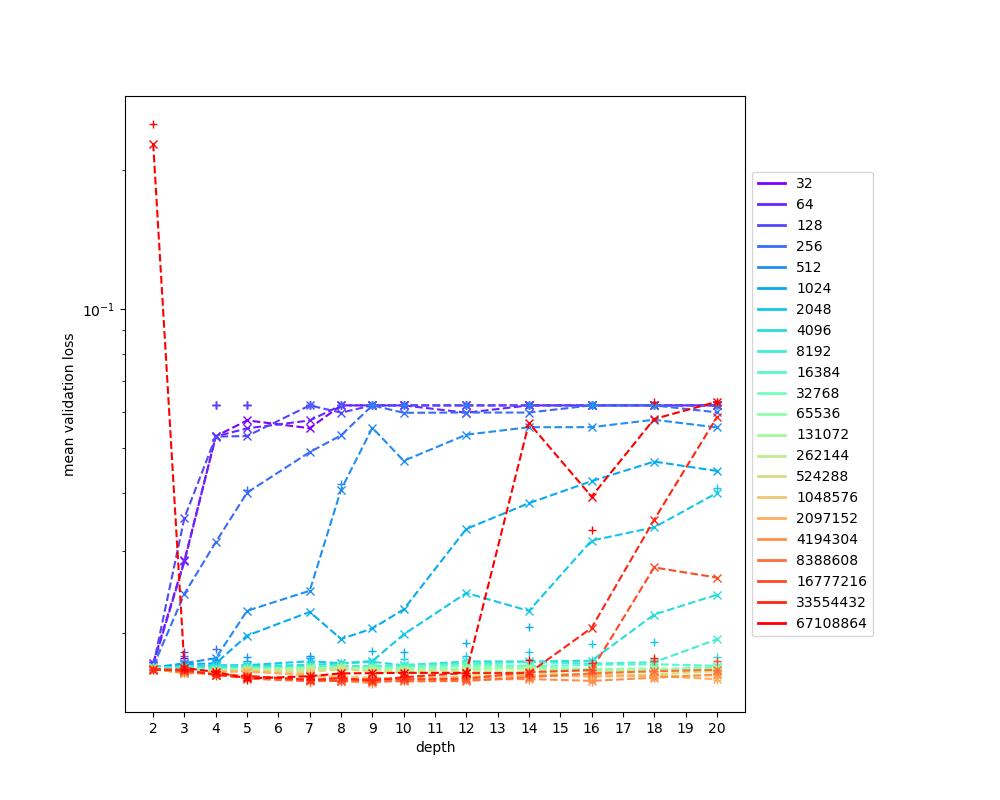

{'config.topology': 'rectangle', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


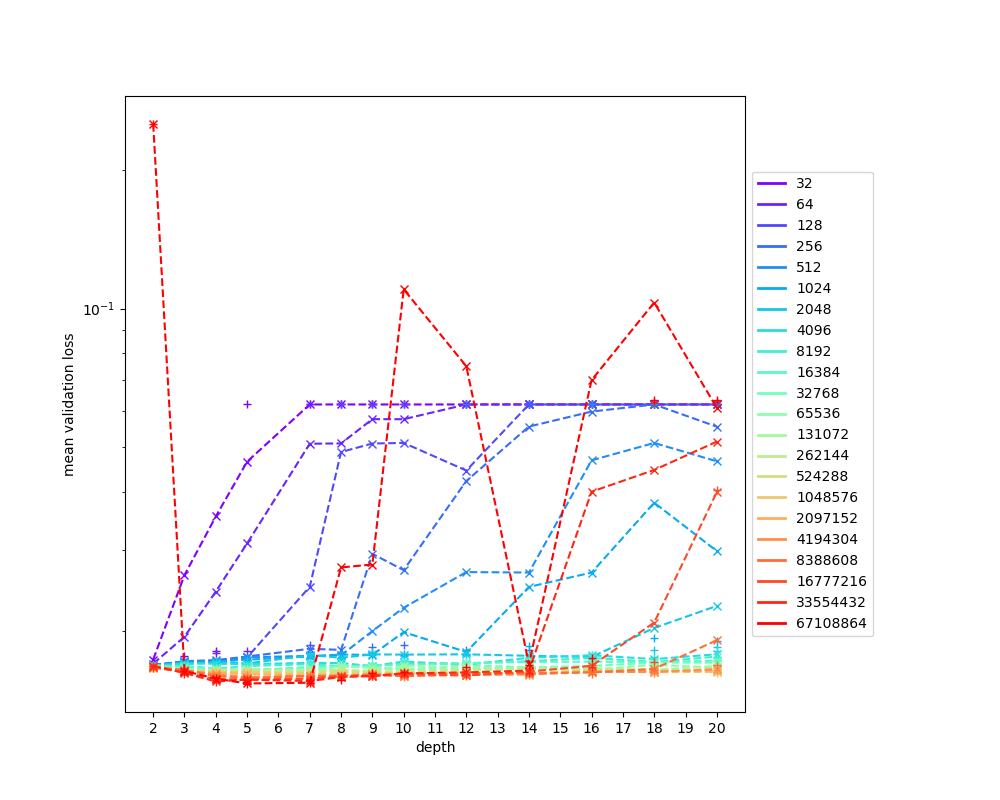

{'config.topology': 'rectangle', 'config.residual_mode': 'full'}


<IPython.core.display.Javascript object>


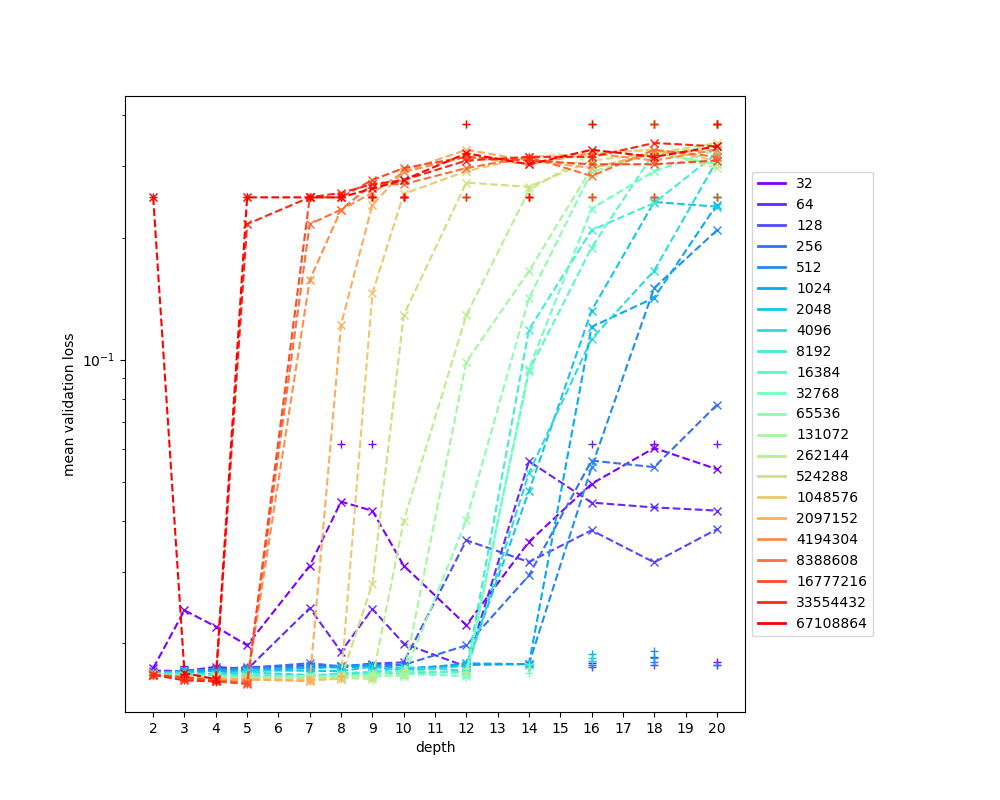

{'config.topology': 'exponential', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


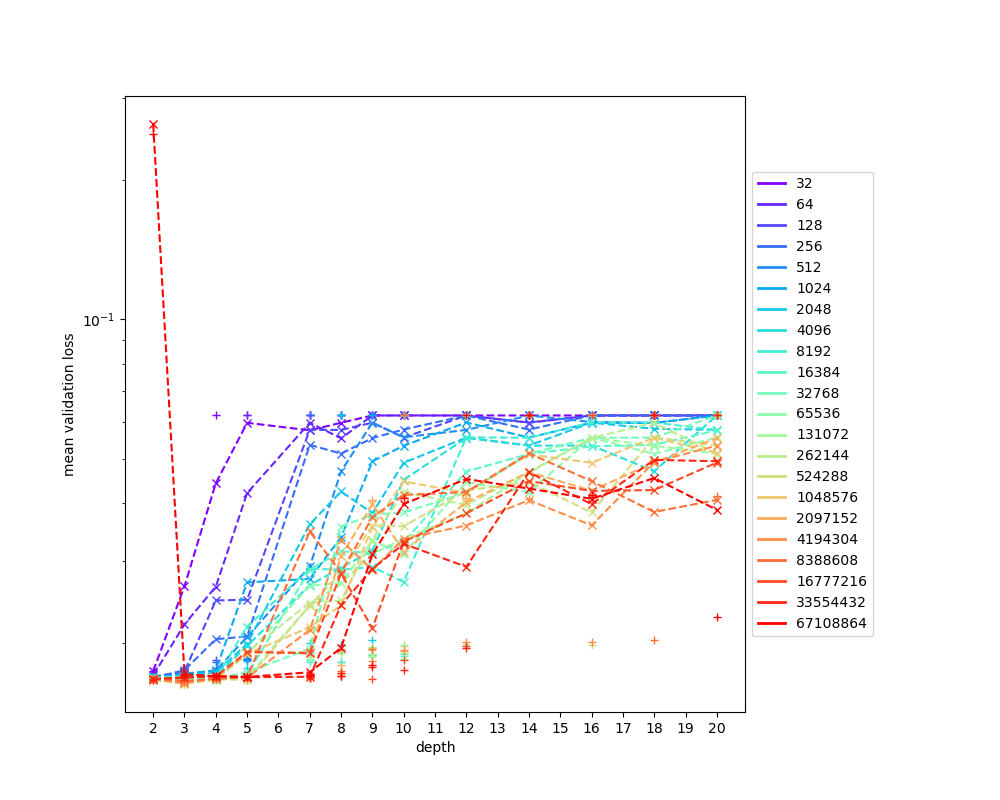

{'config.topology': 'trapezoid', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


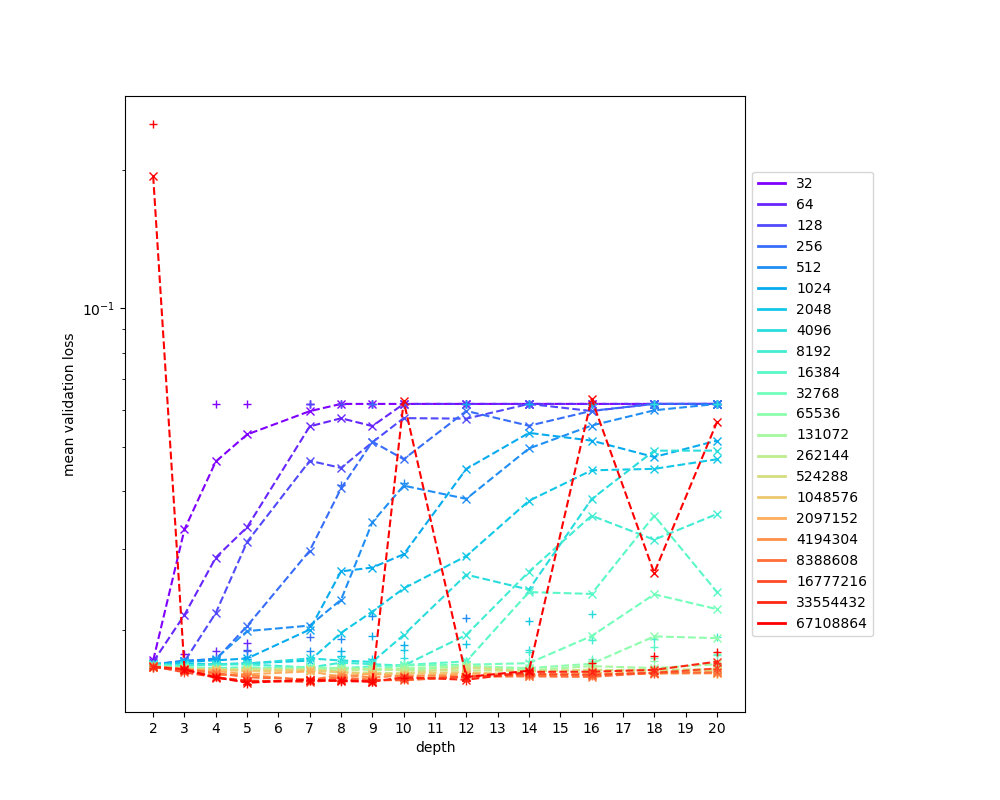

In [8]:
plot_dataset('537_houses')

{'config.topology': 'rectangle', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


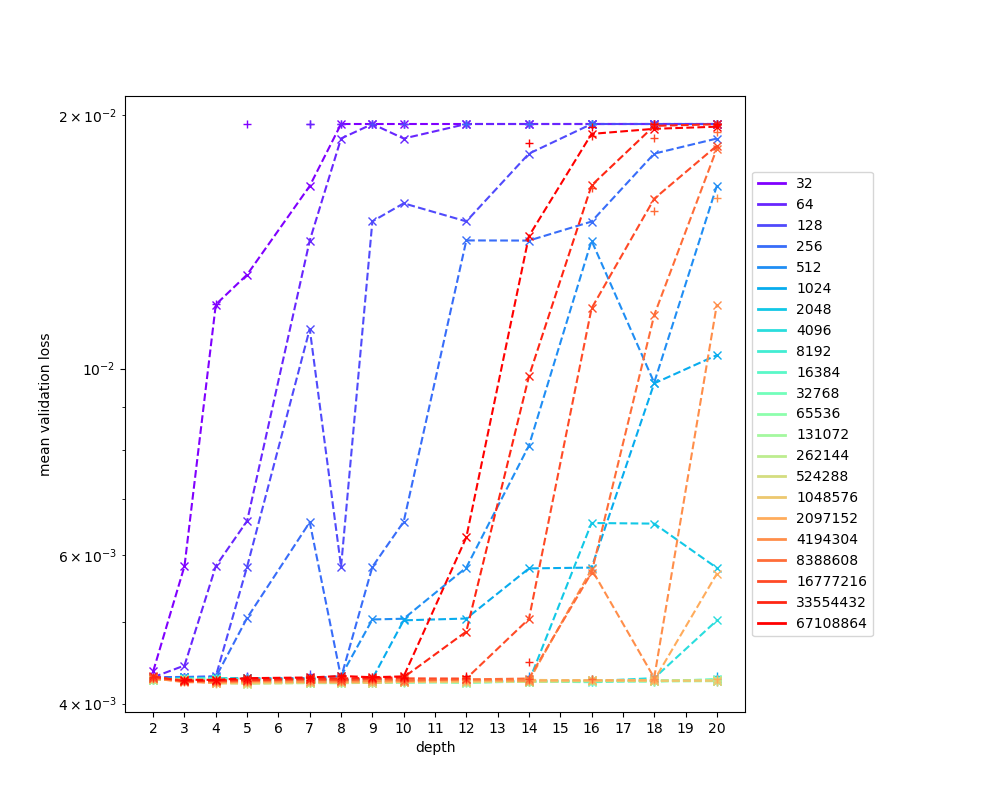

{'config.topology': 'rectangle', 'config.residual_mode': 'full'}


<IPython.core.display.Javascript object>


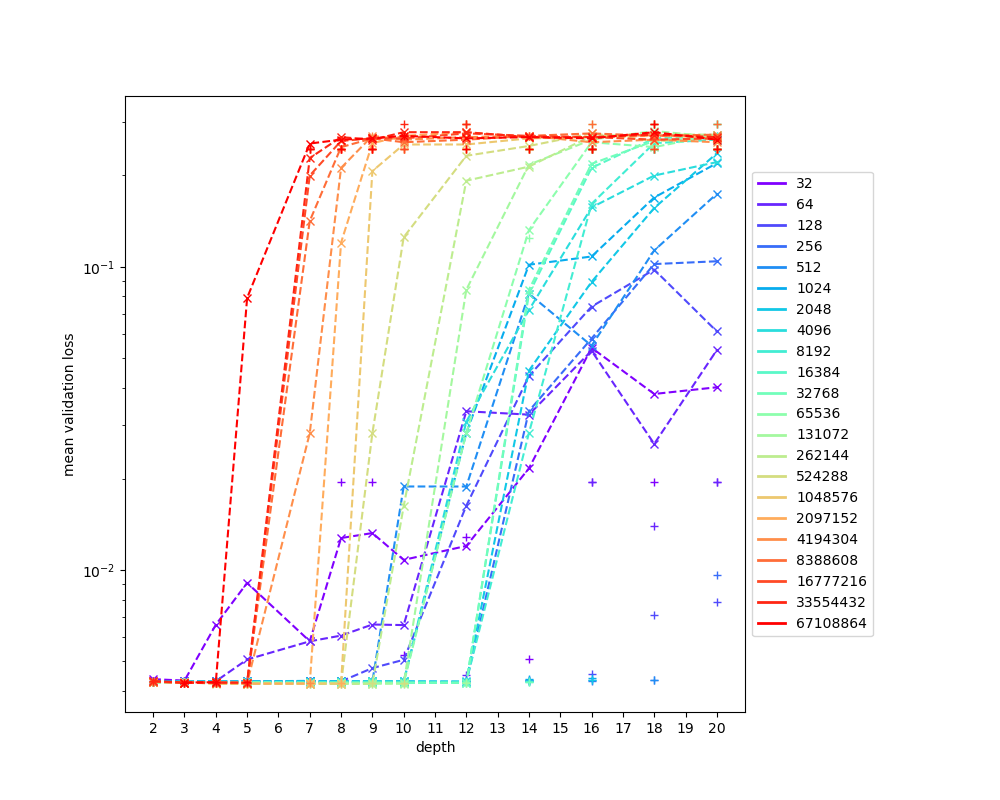

{'config.topology': 'wide_first', 'config.residual_mode': 'full'}


<IPython.core.display.Javascript object>


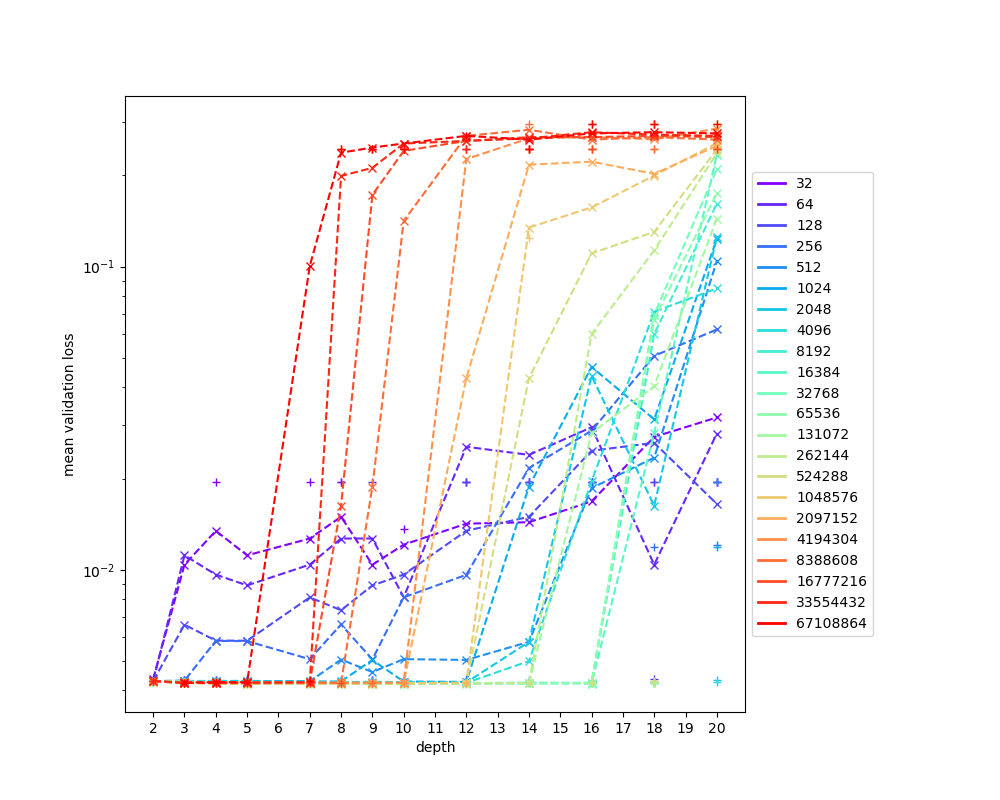

{'config.topology': 'wide_first', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


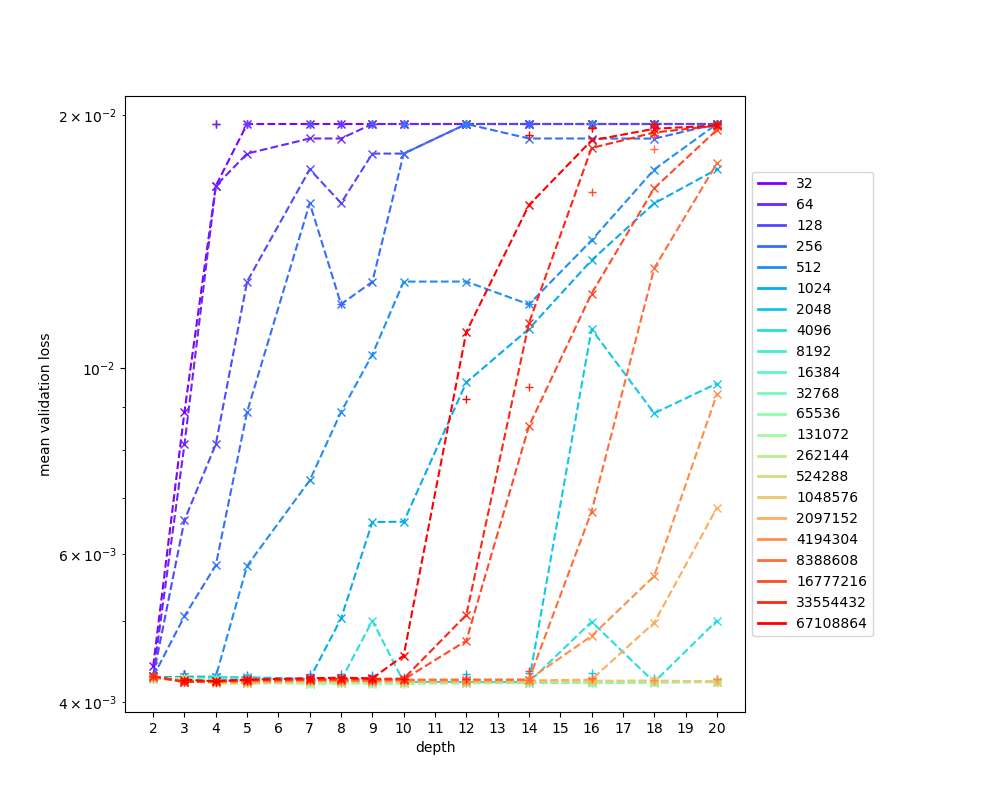

{'config.topology': 'trapezoid', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


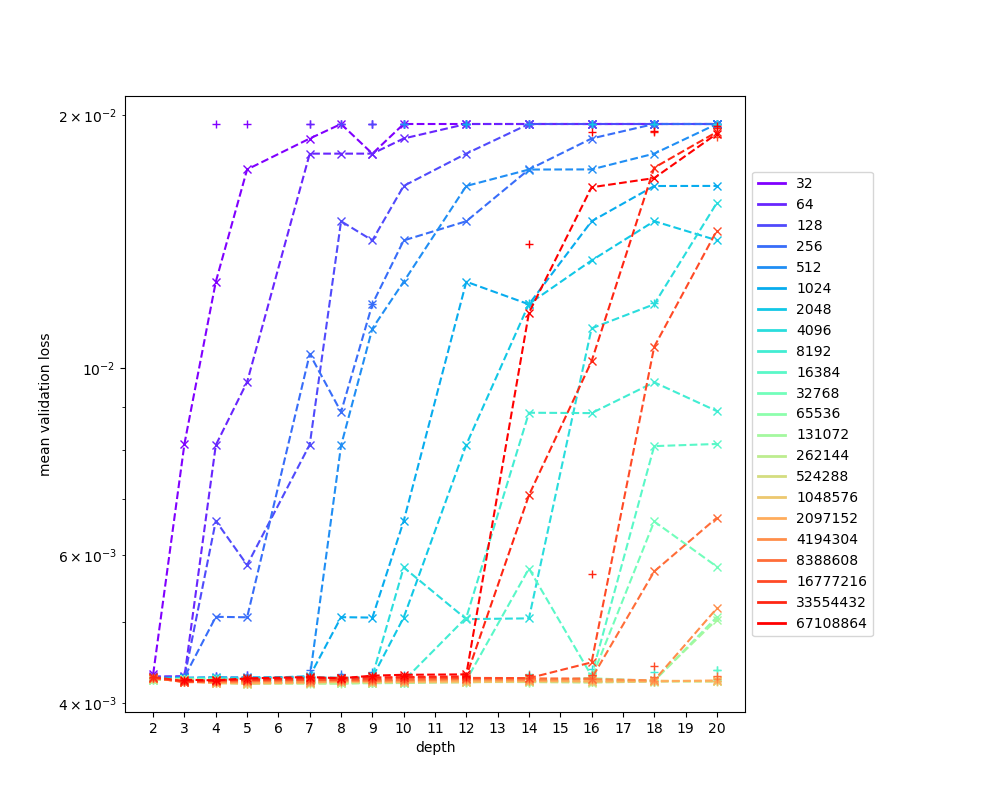

{'config.topology': 'exponential', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


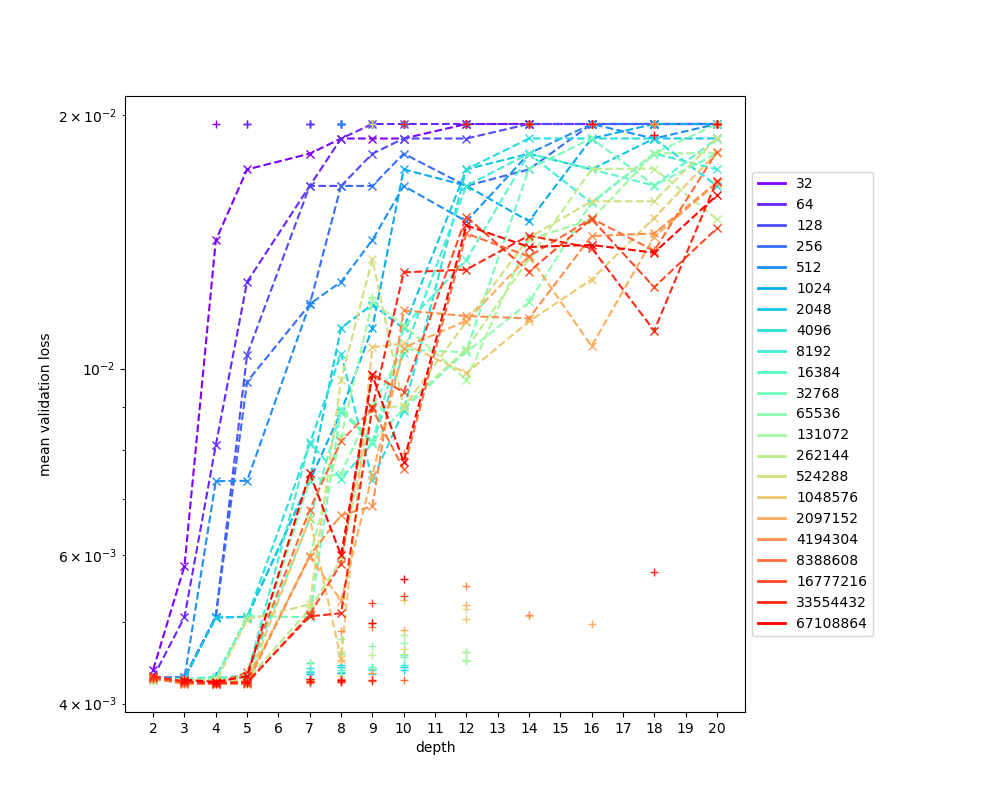

In [9]:
plot_dataset('529_pollen')

{'config.topology': 'rectangle', 'config.residual_mode': 'full'}


<IPython.core.display.Javascript object>


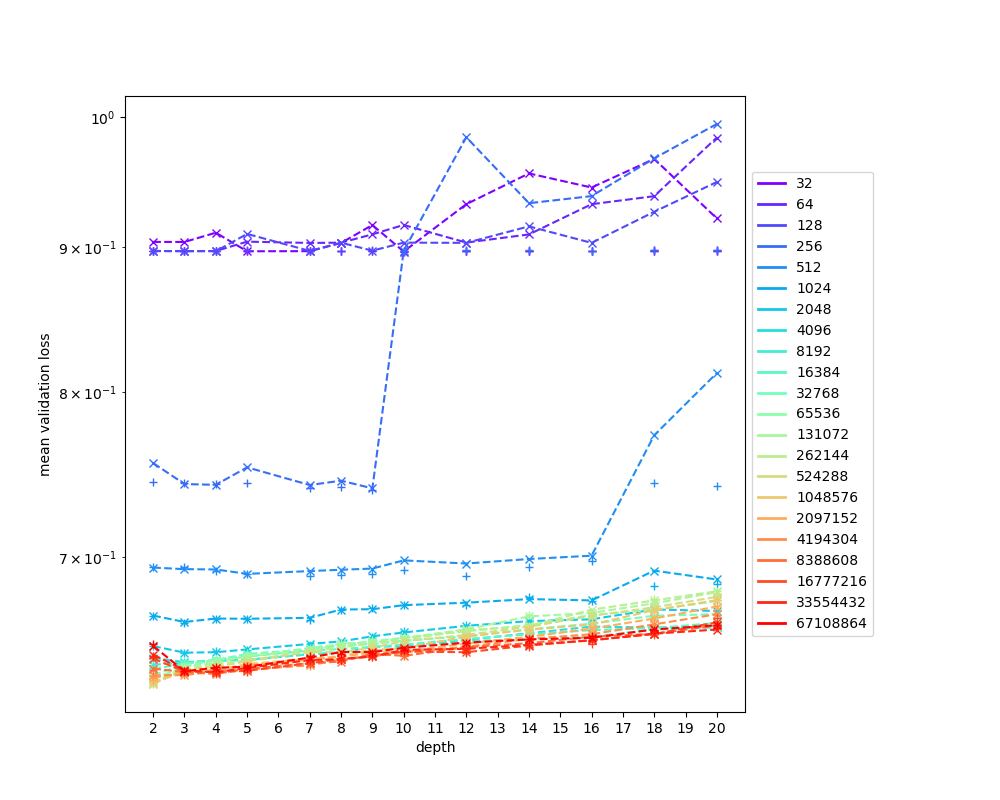

{'config.topology': 'rectangle', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


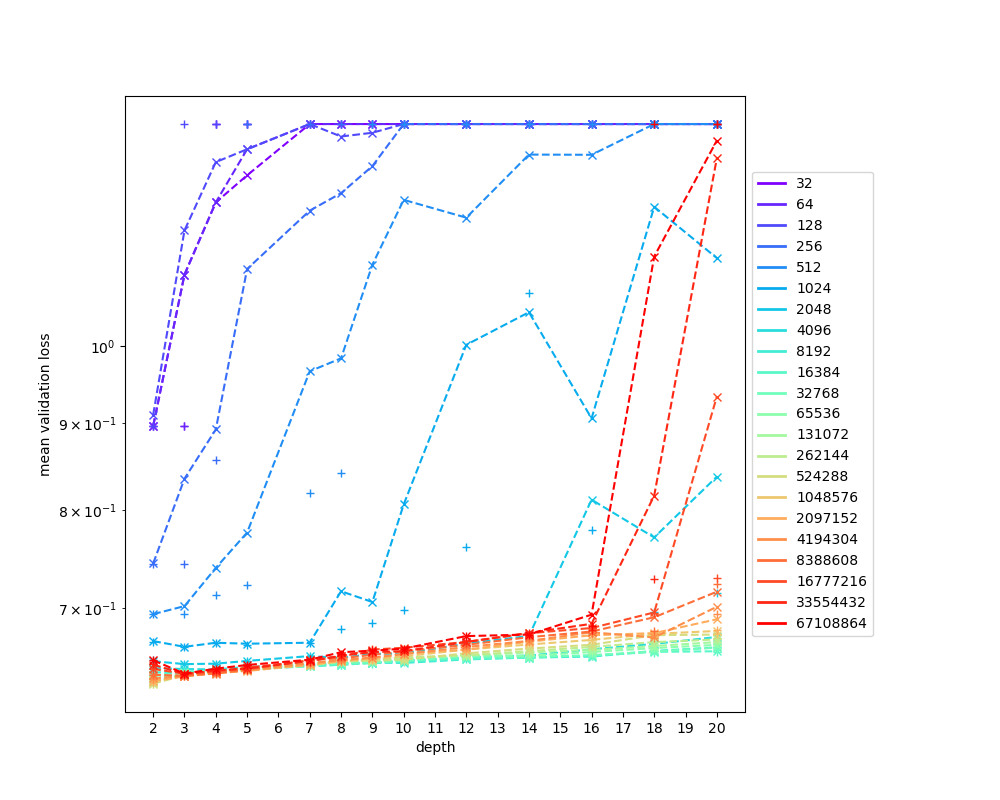

{'config.topology': 'exponential', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


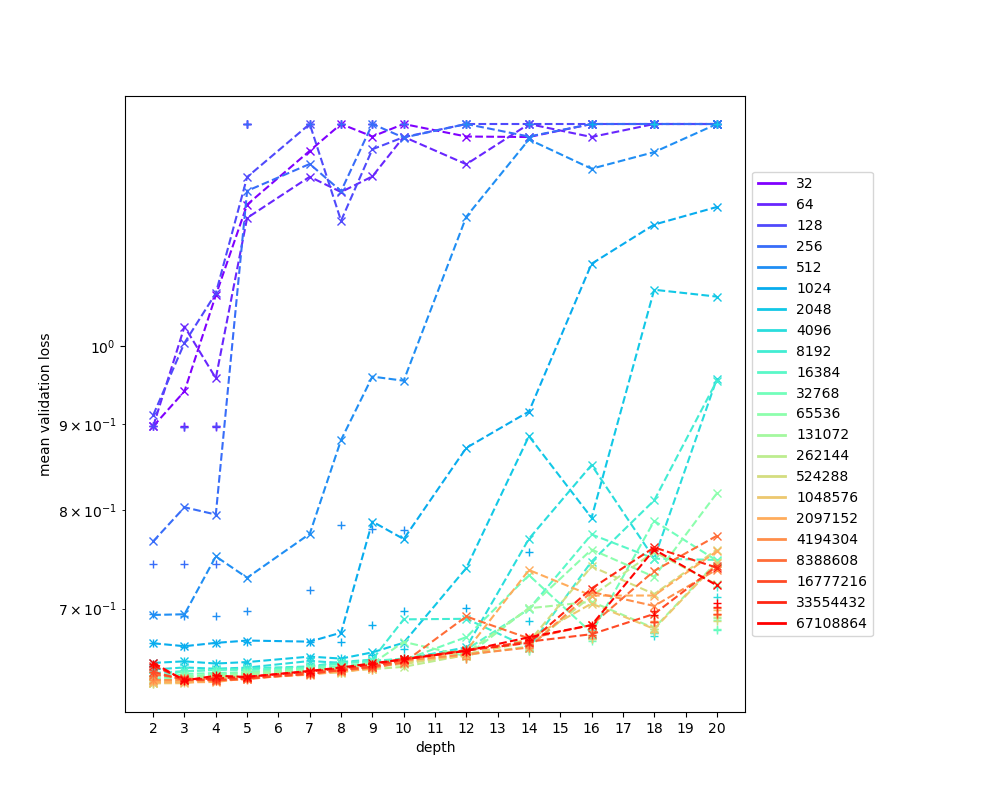

{'config.topology': 'wide_first', 'config.residual_mode': 'full'}


<IPython.core.display.Javascript object>


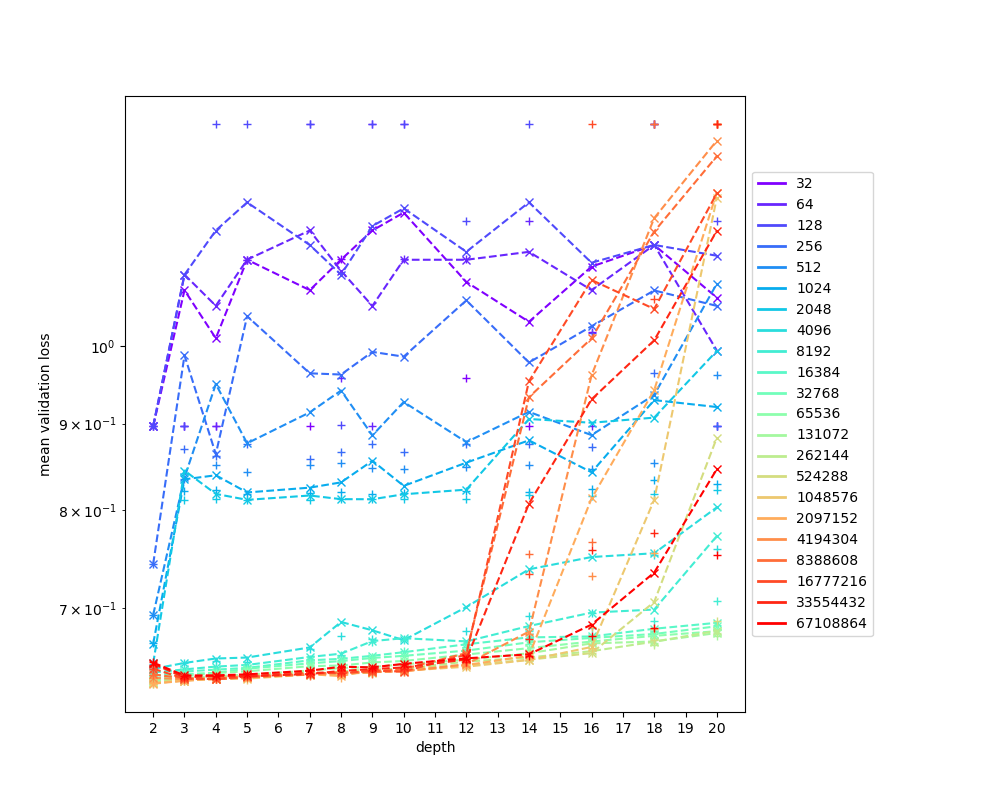

{'config.topology': 'wide_first', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


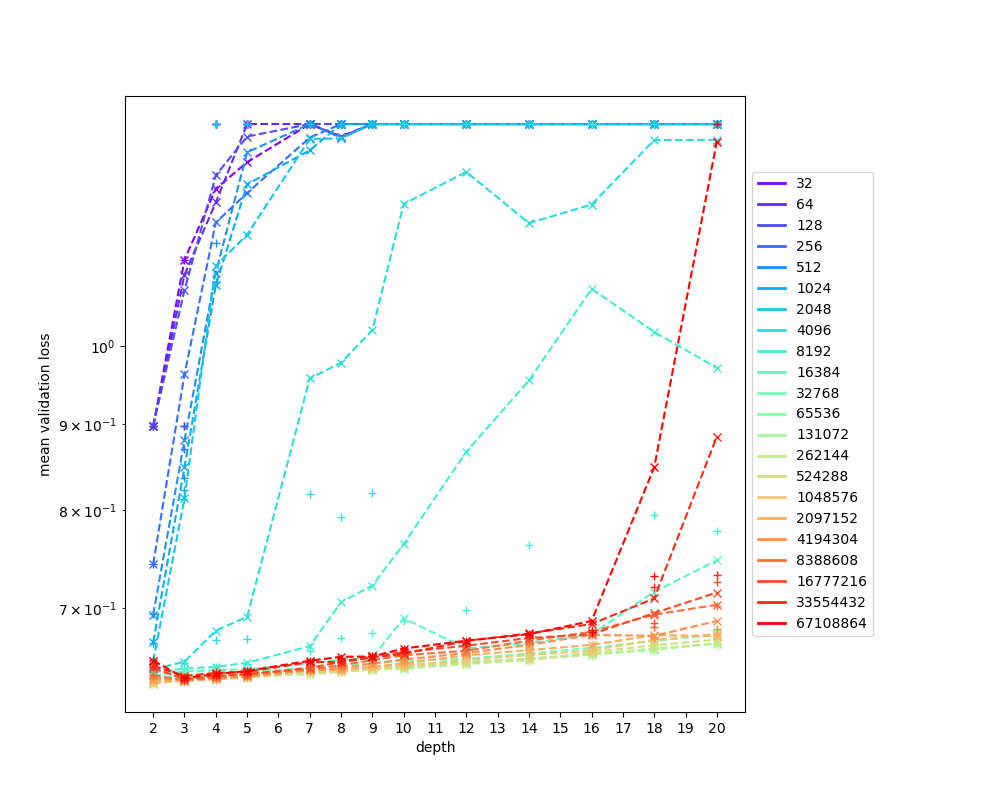

{'config.topology': 'trapezoid', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


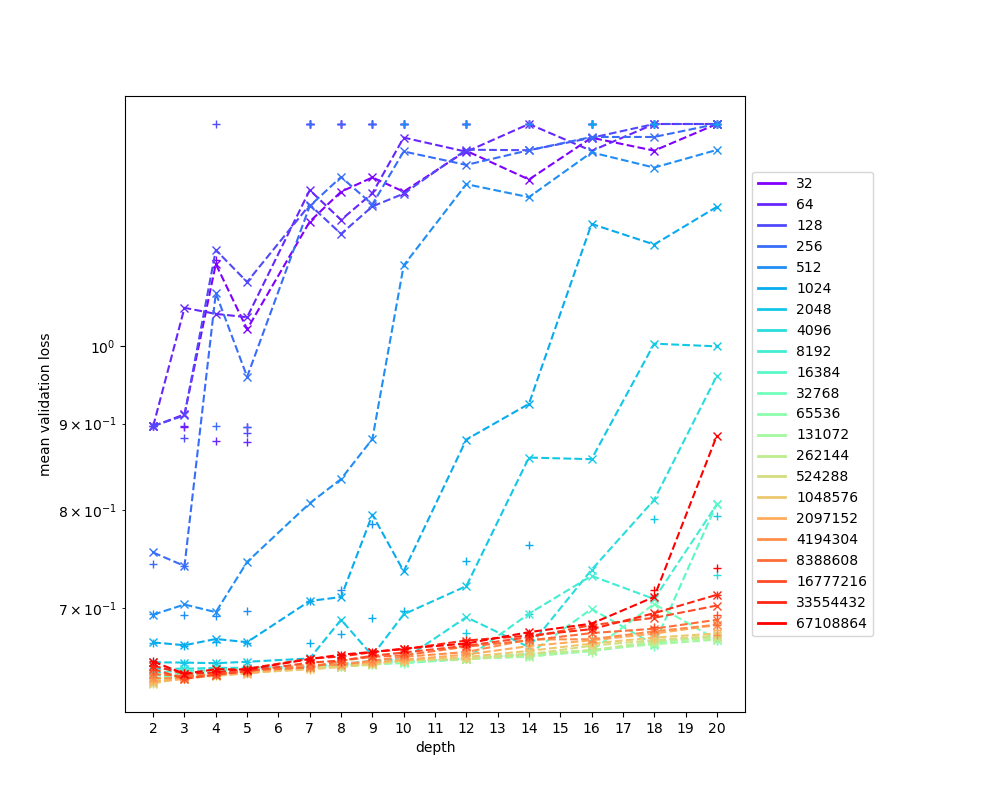

In [10]:
plot_dataset('sleep')

In [11]:
plot_dataset('adult')

In [12]:
plot_dataset('nursery')

{'config.topology': 'wide_first', 'config.residual_mode': 'full'}


<IPython.core.display.Javascript object>


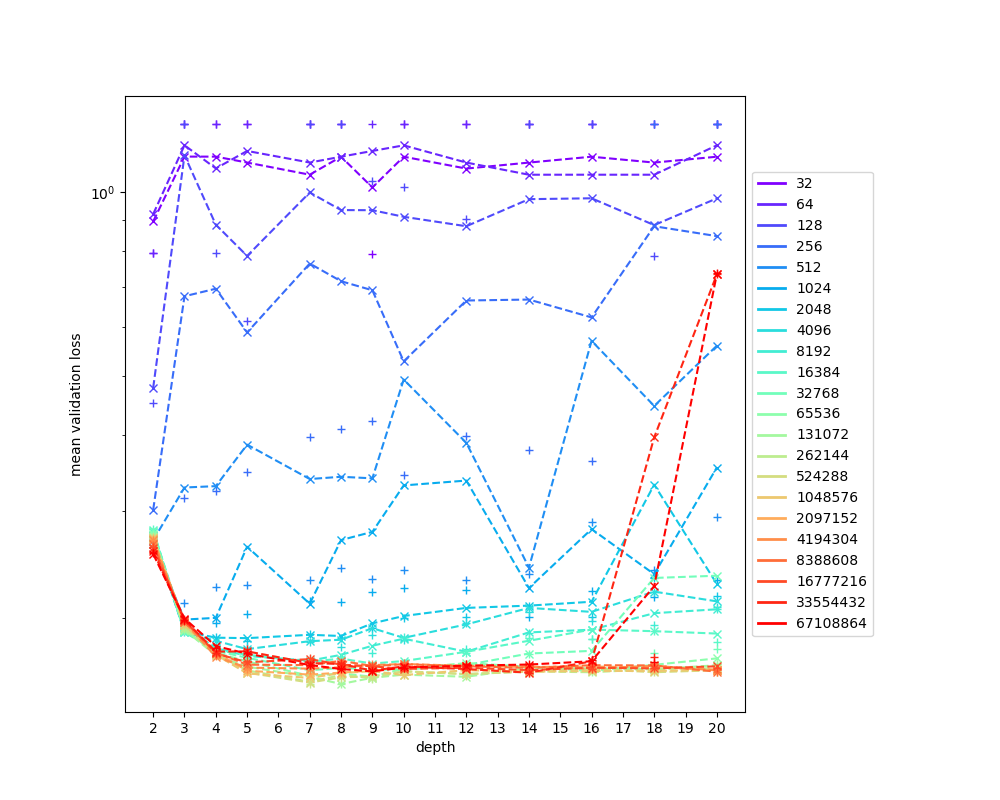

{'config.topology': 'wide_first', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


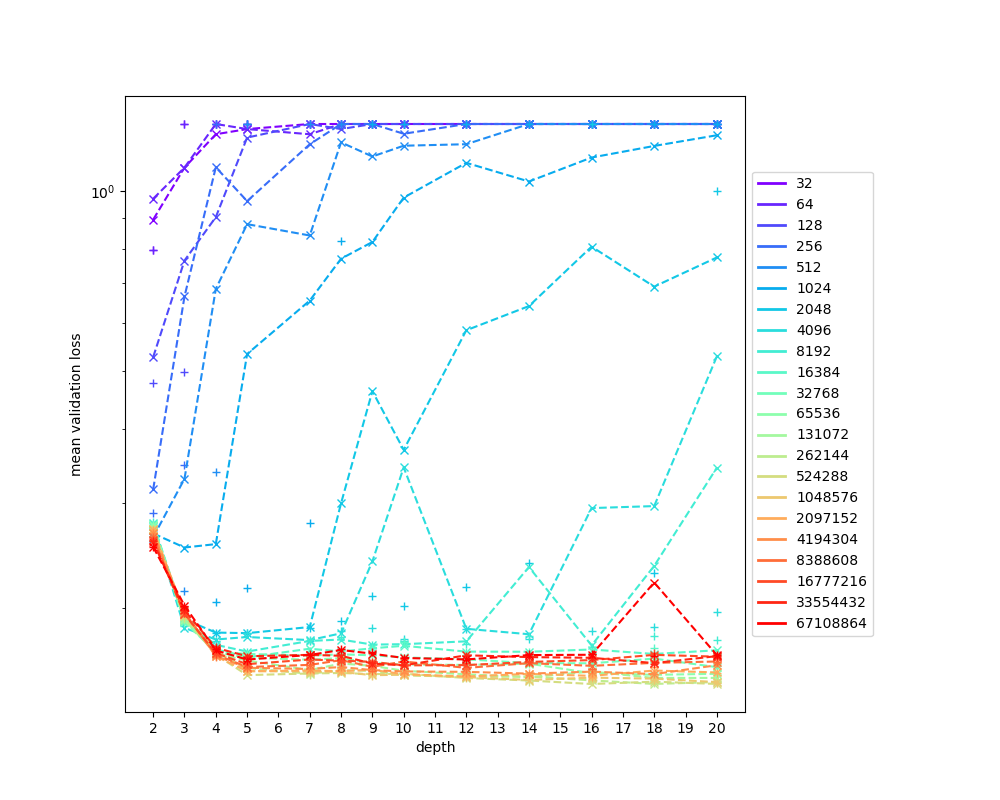

{'config.topology': 'exponential', 'config.residual_mode': 'none'}


/tmp/ipykernel_5071/824555214.py:41: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


<IPython.core.display.Javascript object>


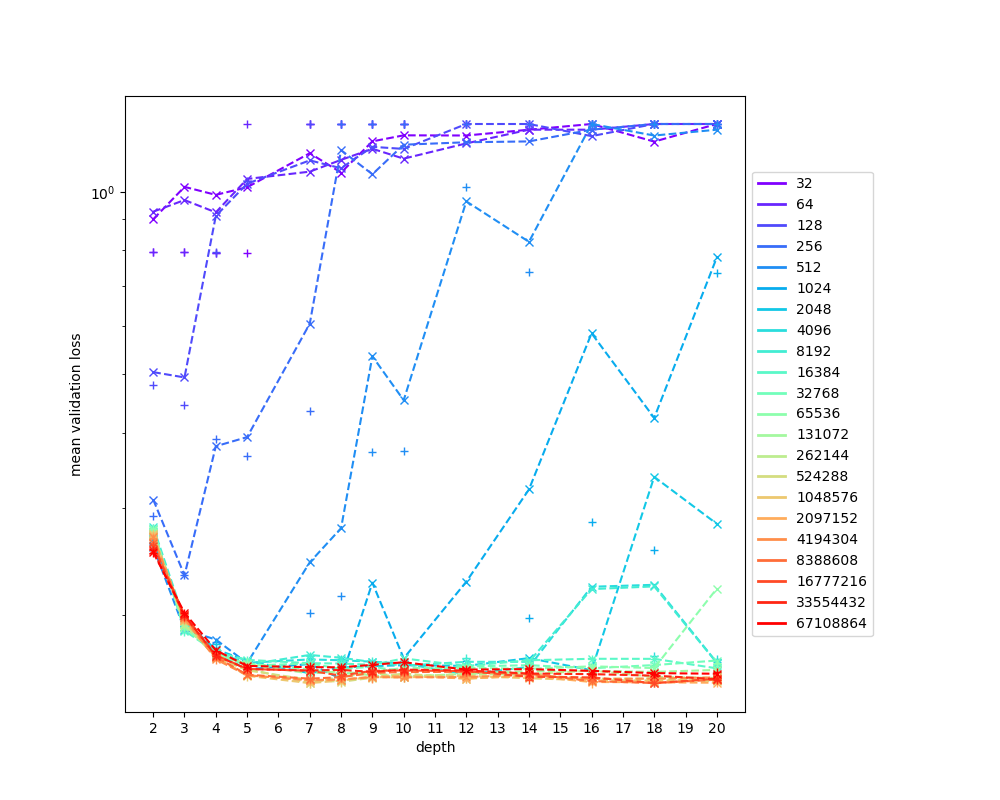

{'config.topology': 'trapezoid', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


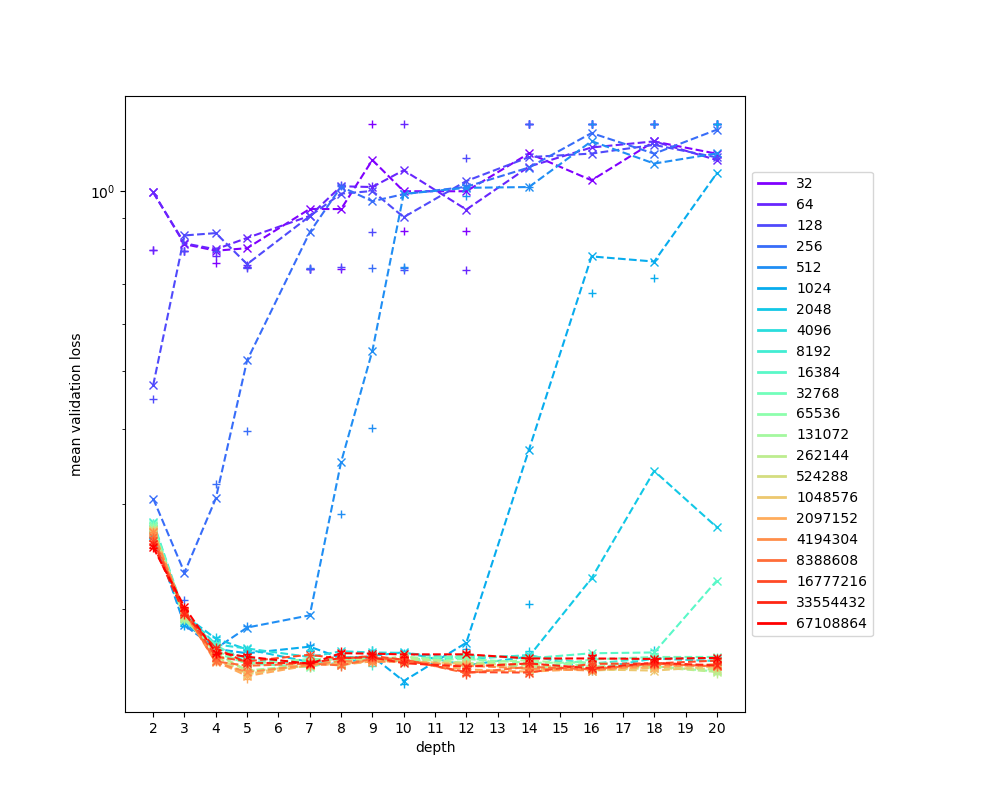

{'config.topology': 'rectangle', 'config.residual_mode': 'full'}


<IPython.core.display.Javascript object>


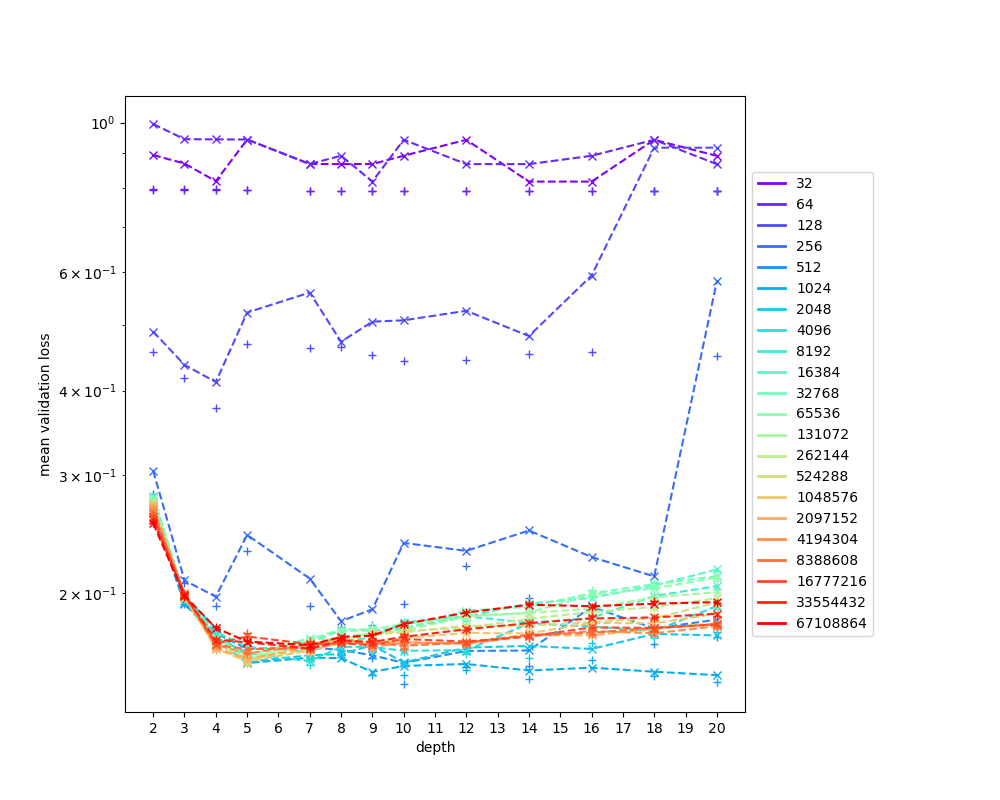

{'config.topology': 'rectangle', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


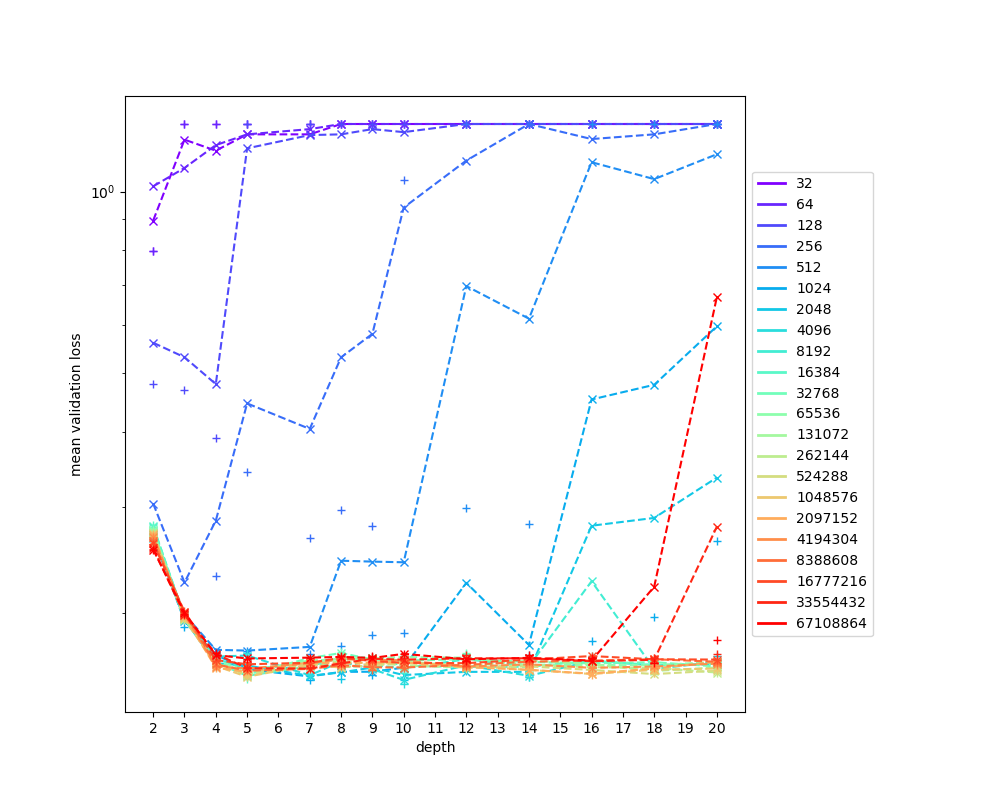

In [13]:
plot_dataset('201_pol')

{'config.topology': 'wide_first', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


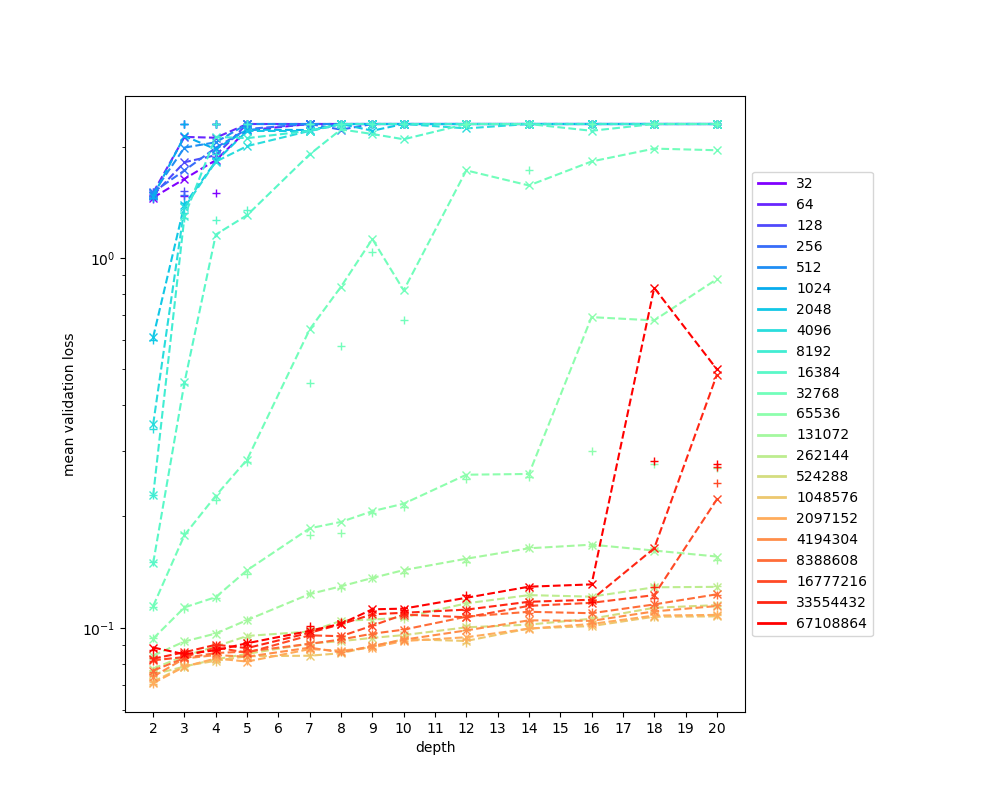

{'config.topology': 'wide_first', 'config.residual_mode': 'full'}


<IPython.core.display.Javascript object>


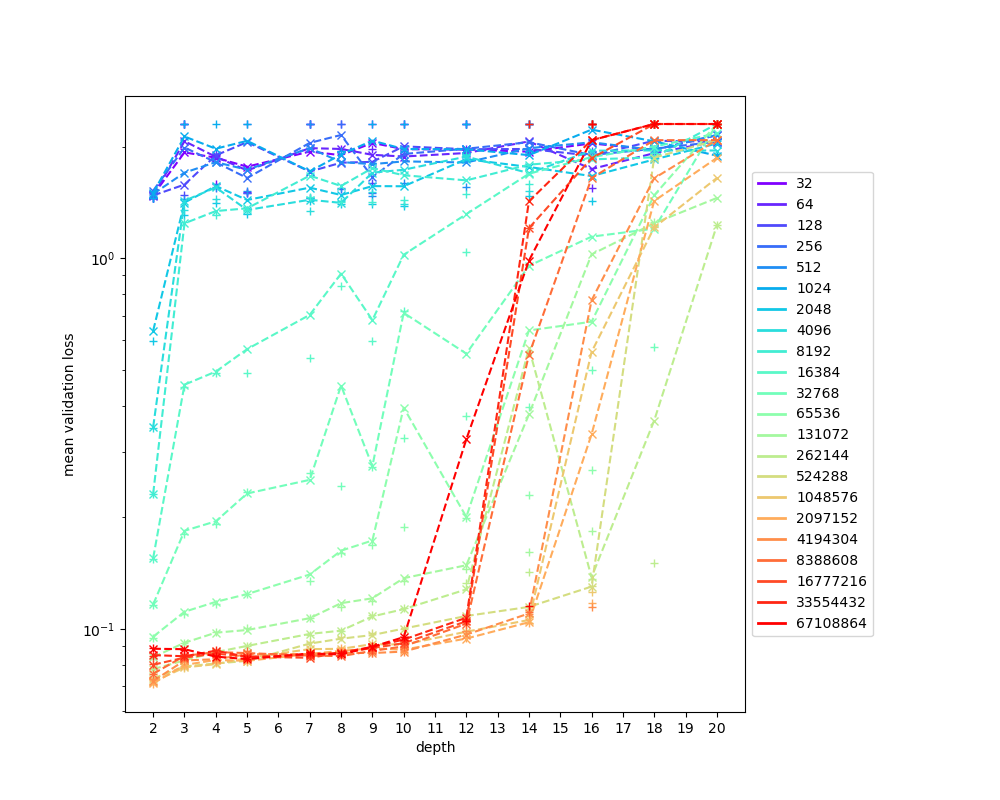

{'config.topology': 'rectangle', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


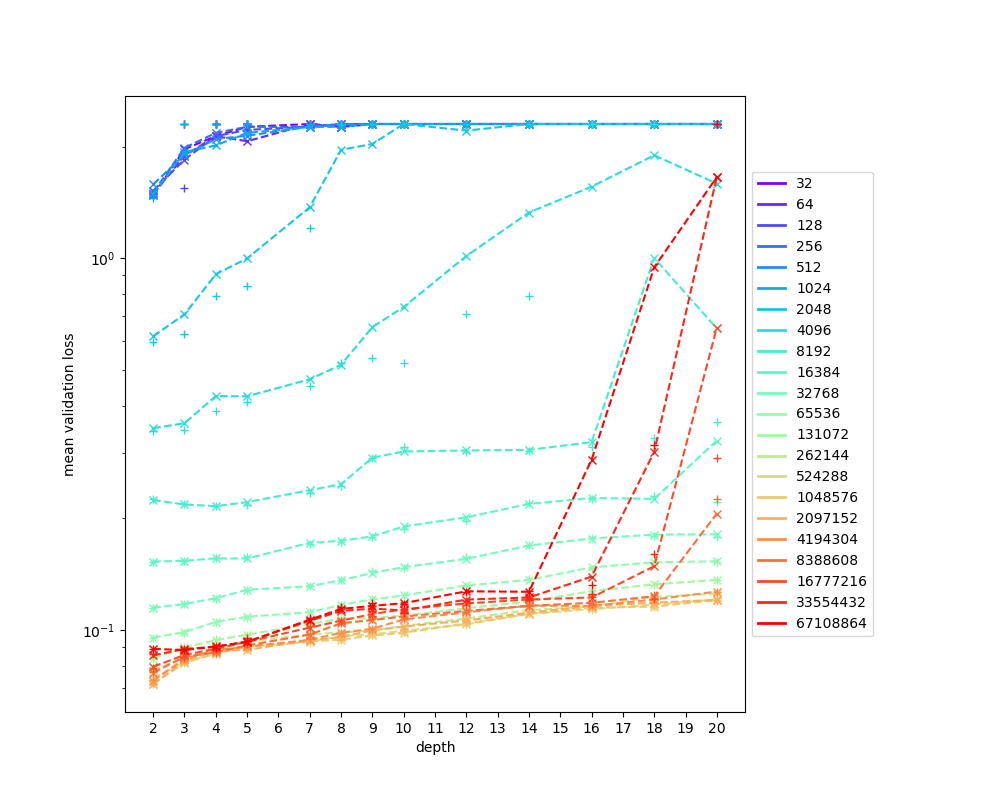

{'config.topology': 'rectangle', 'config.residual_mode': 'full'}


<IPython.core.display.Javascript object>


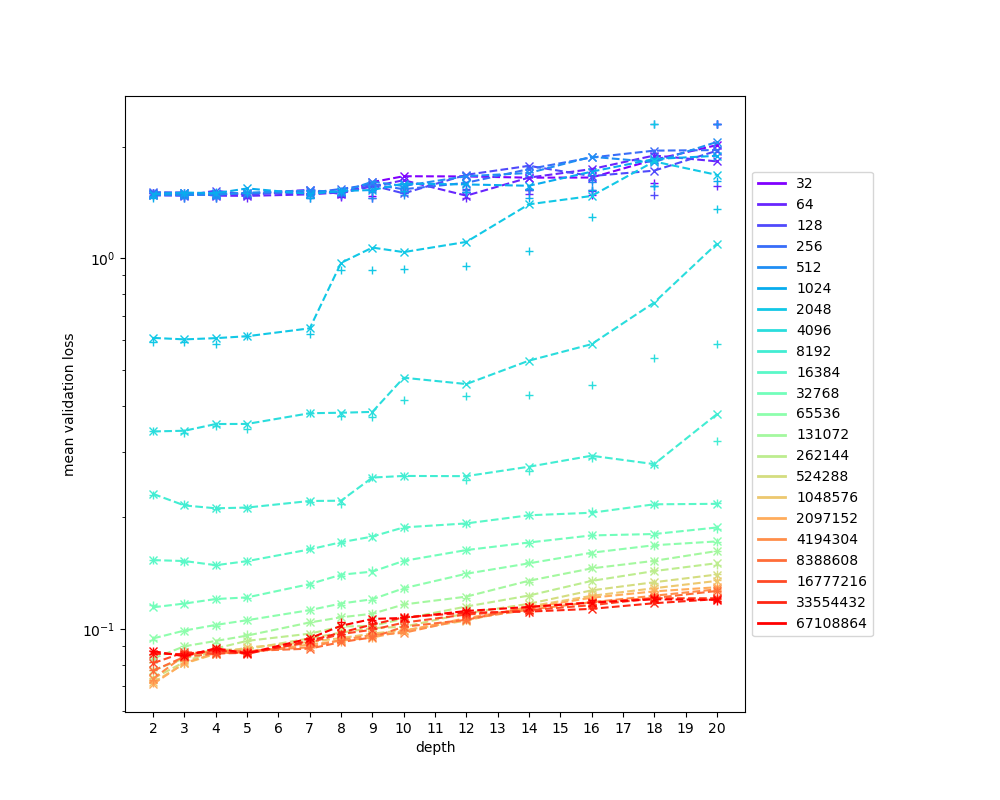

{'config.topology': 'exponential', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


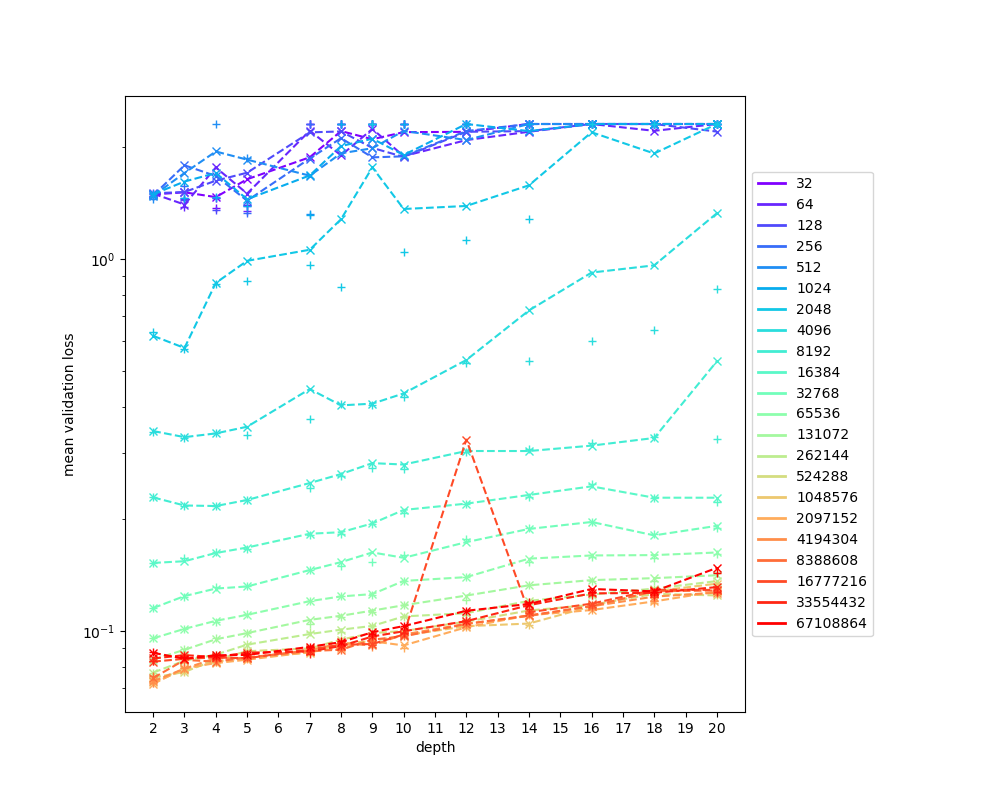

{'config.topology': 'trapezoid', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


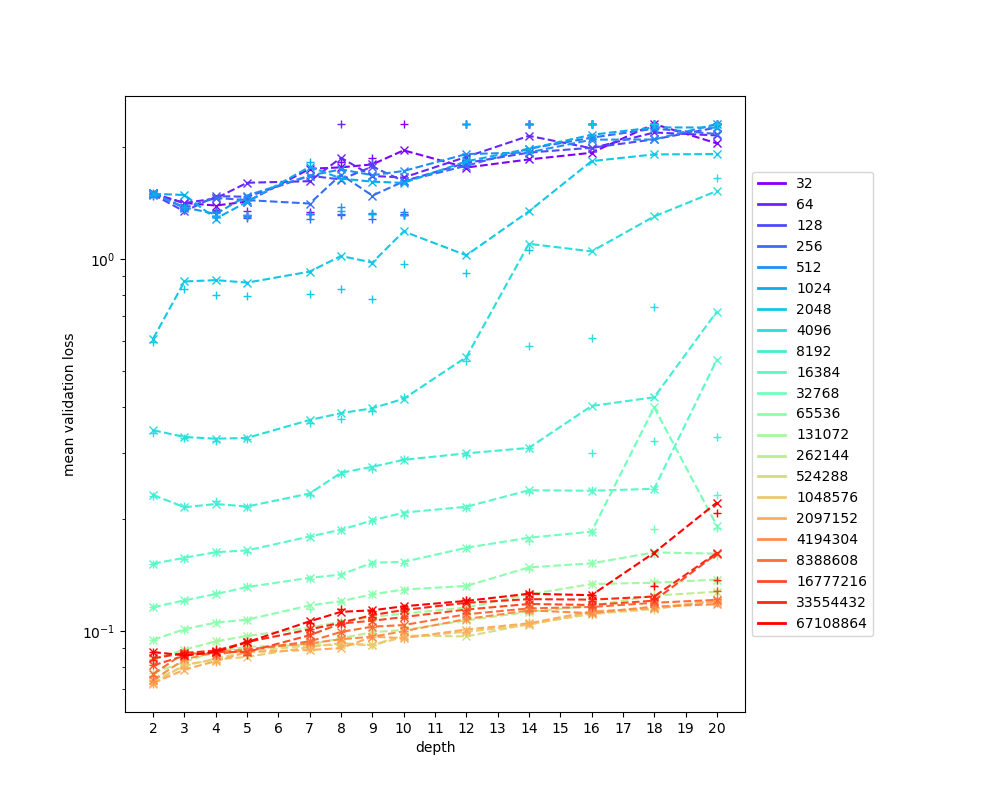

In [14]:
plot_dataset('mnist')

{'config.topology': 'rectangle', 'config.residual_mode': 'full'}


<IPython.core.display.Javascript object>


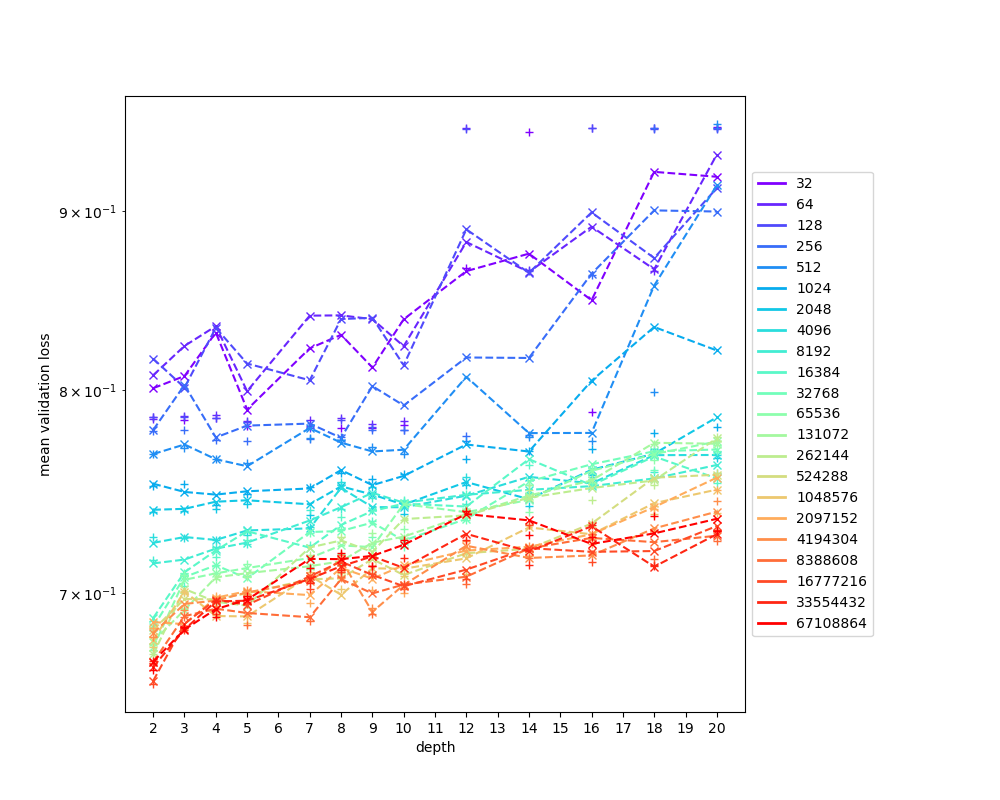

{'config.topology': 'rectangle', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


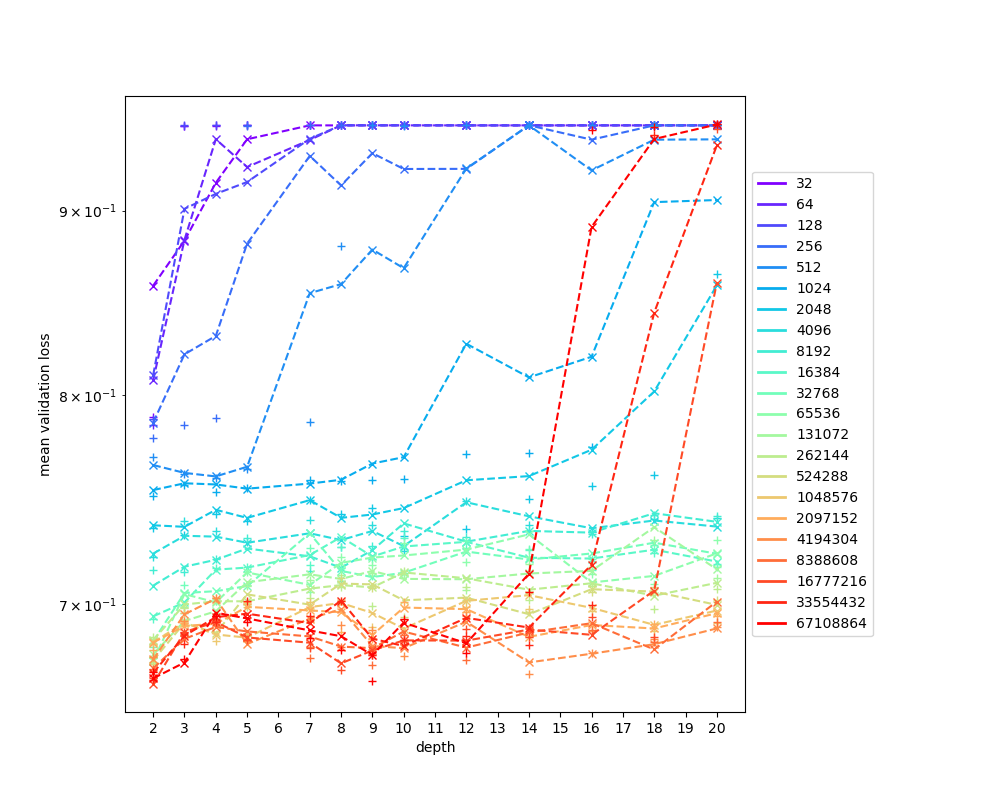

{'config.topology': 'exponential', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


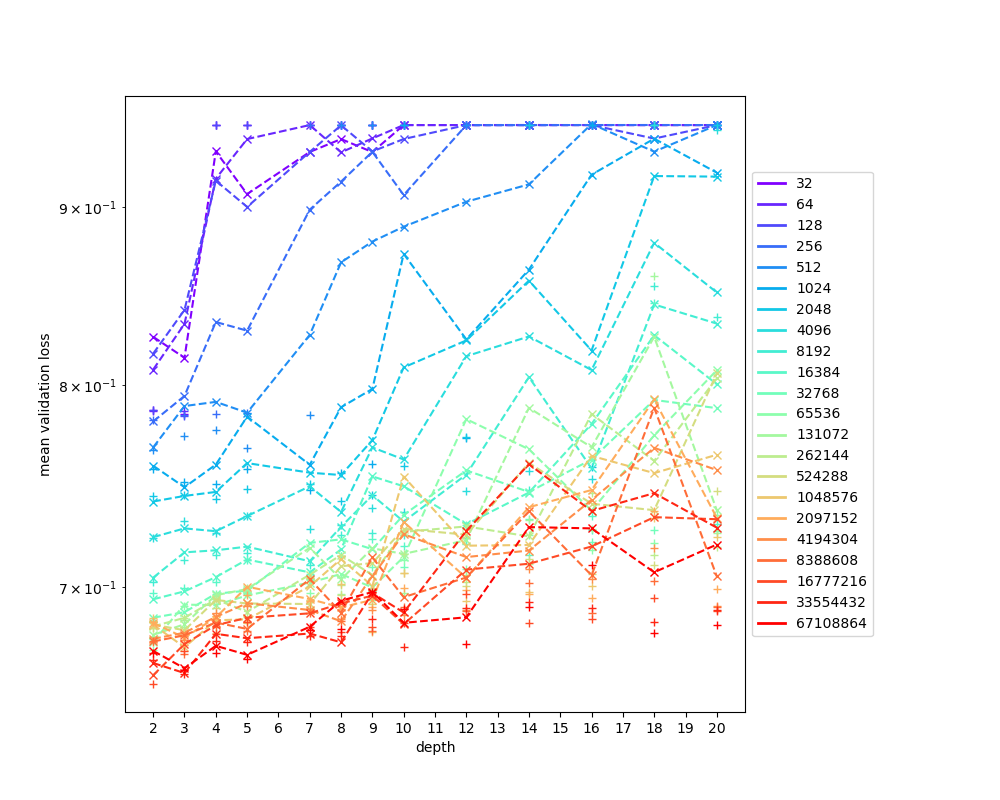

{'config.topology': 'wide_first', 'config.residual_mode': 'full'}


<IPython.core.display.Javascript object>


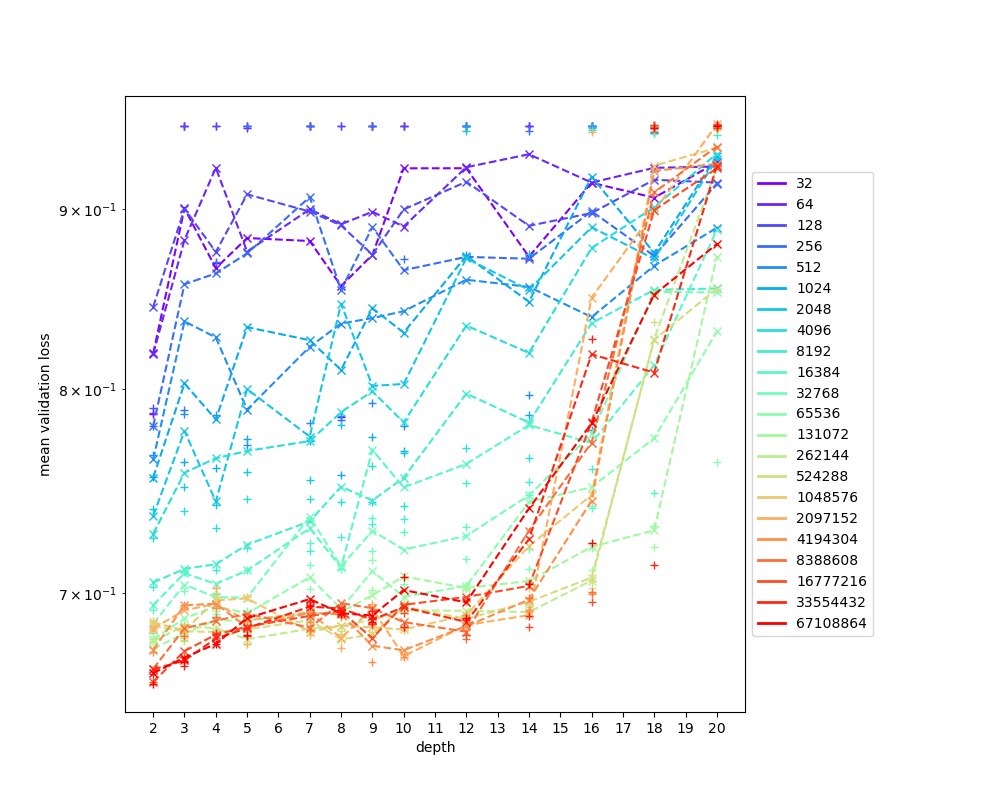

{'config.topology': 'wide_first', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


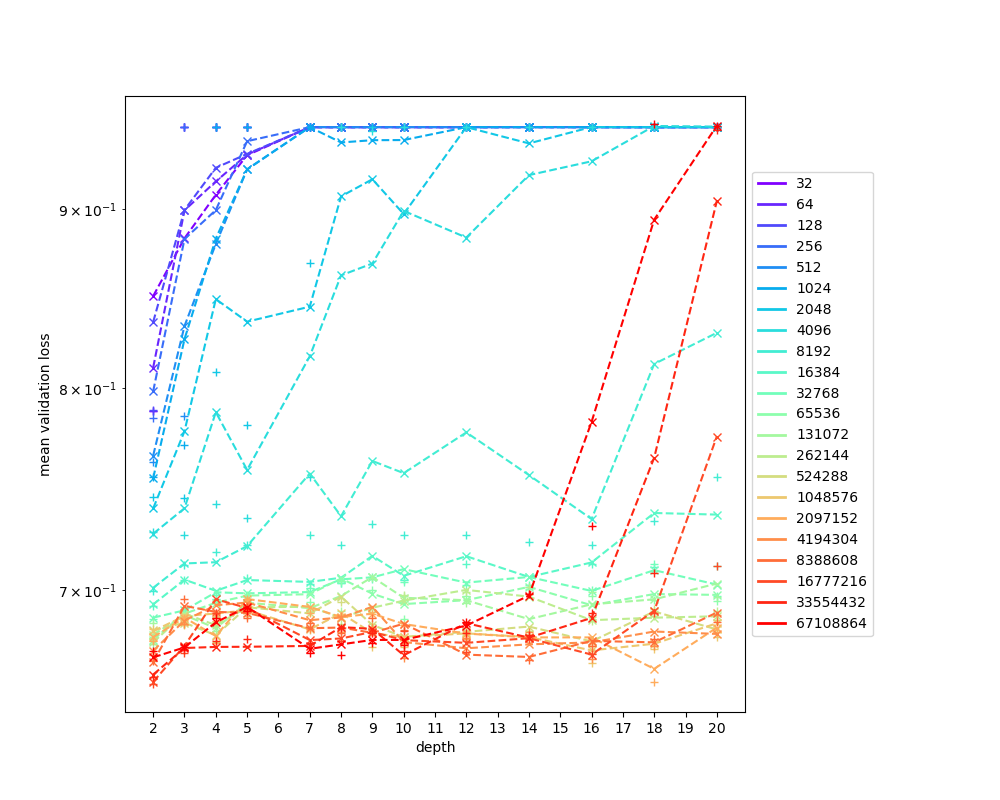

{'config.topology': 'trapezoid', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


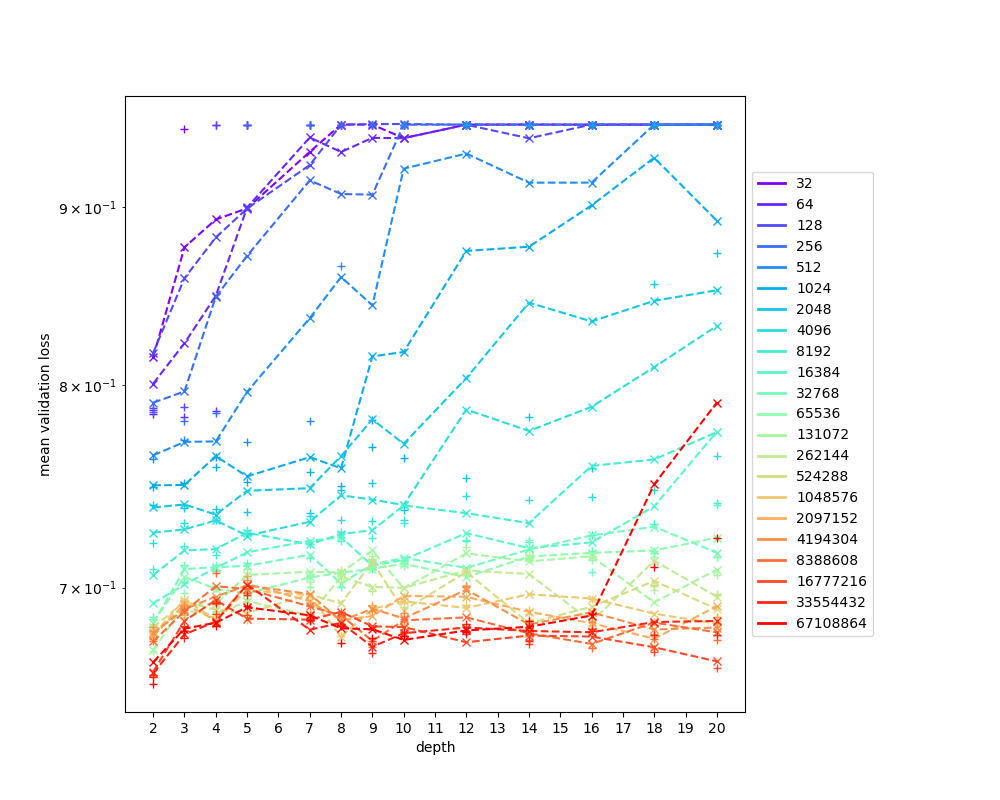

In [15]:
plot_dataset('connect_4')

{'config.topology': 'exponential', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


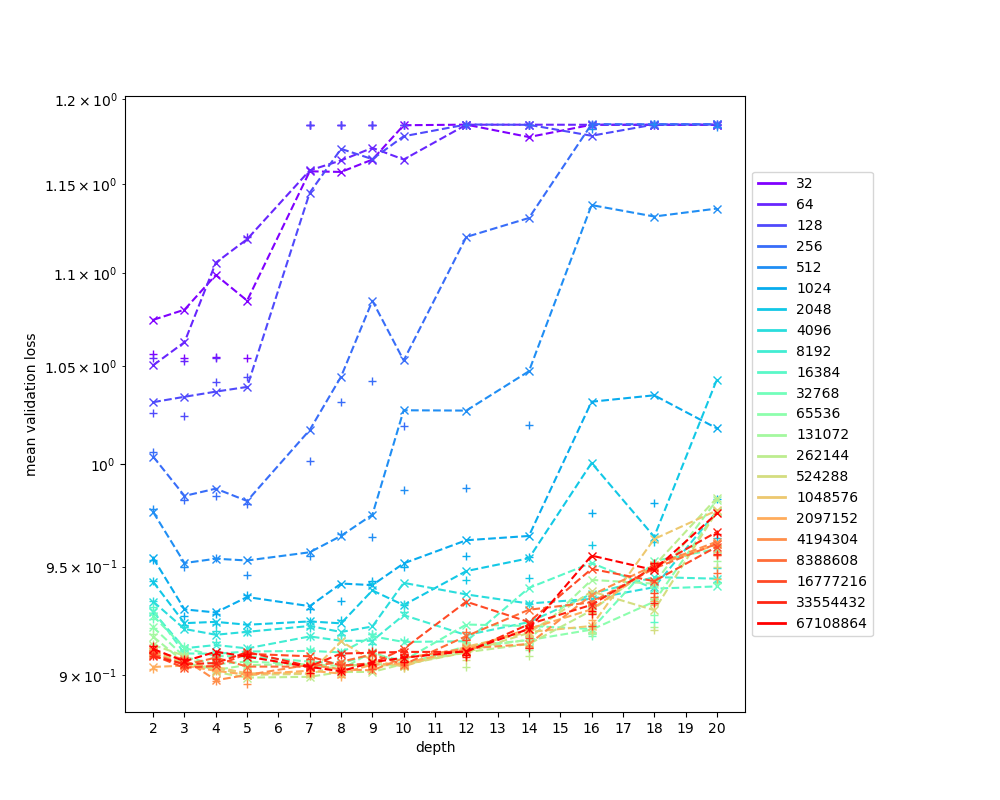

{'config.topology': 'rectangle', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


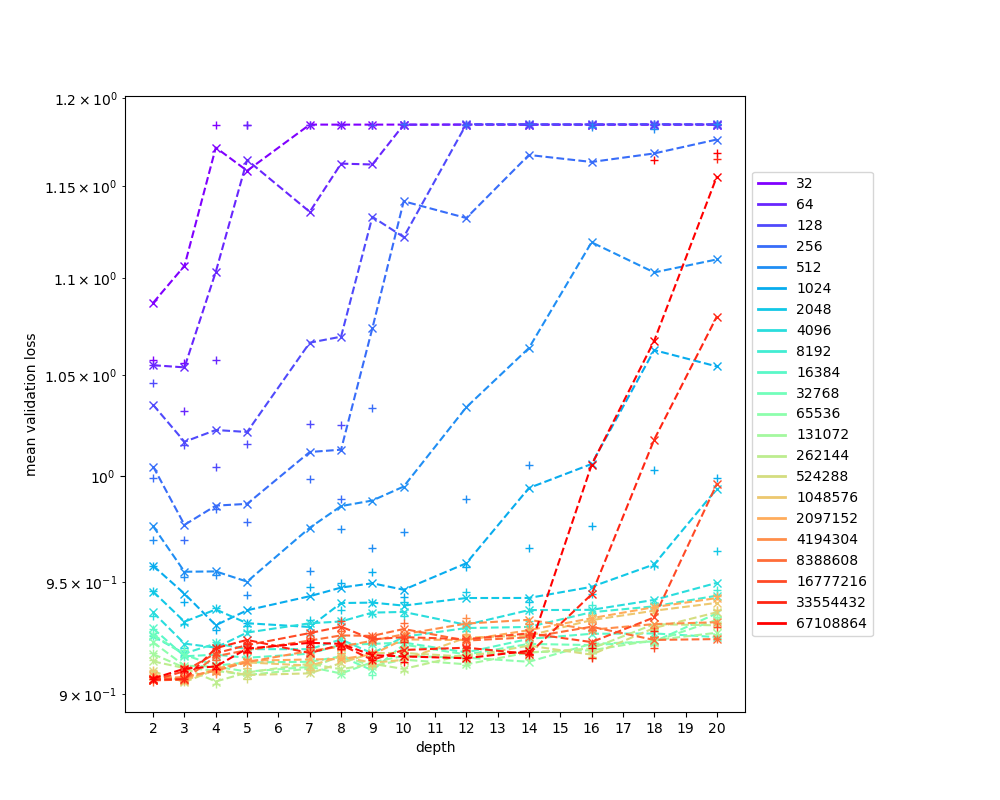

{'config.topology': 'rectangle', 'config.residual_mode': 'full'}


<IPython.core.display.Javascript object>


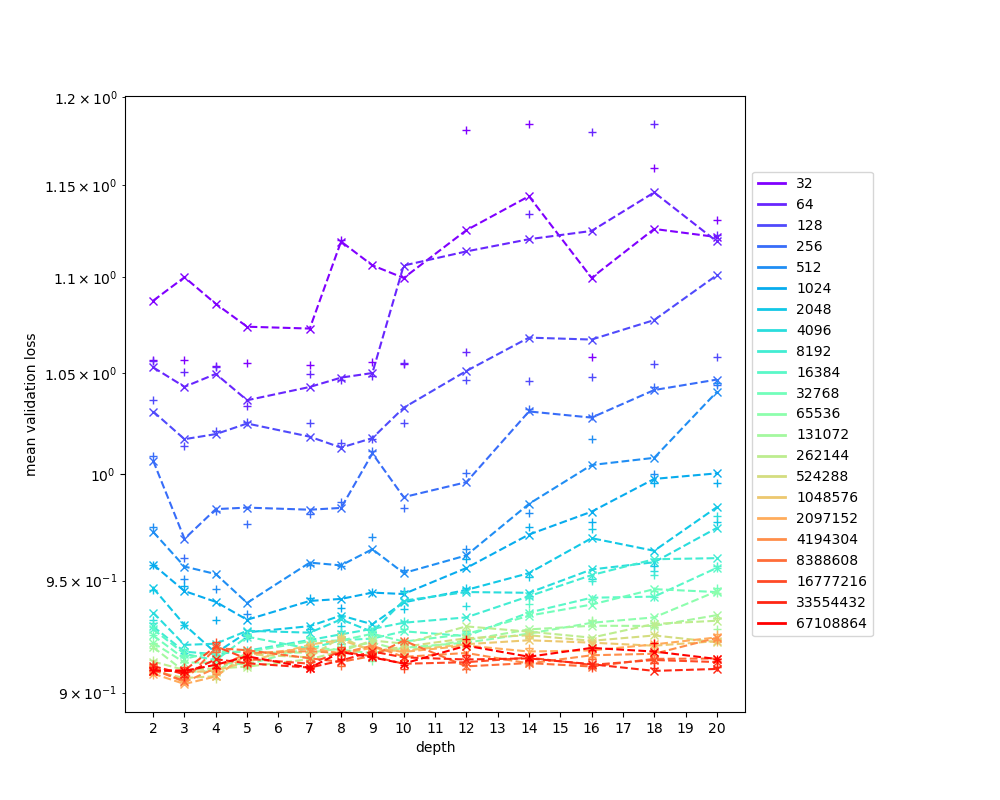

{'config.topology': 'trapezoid', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


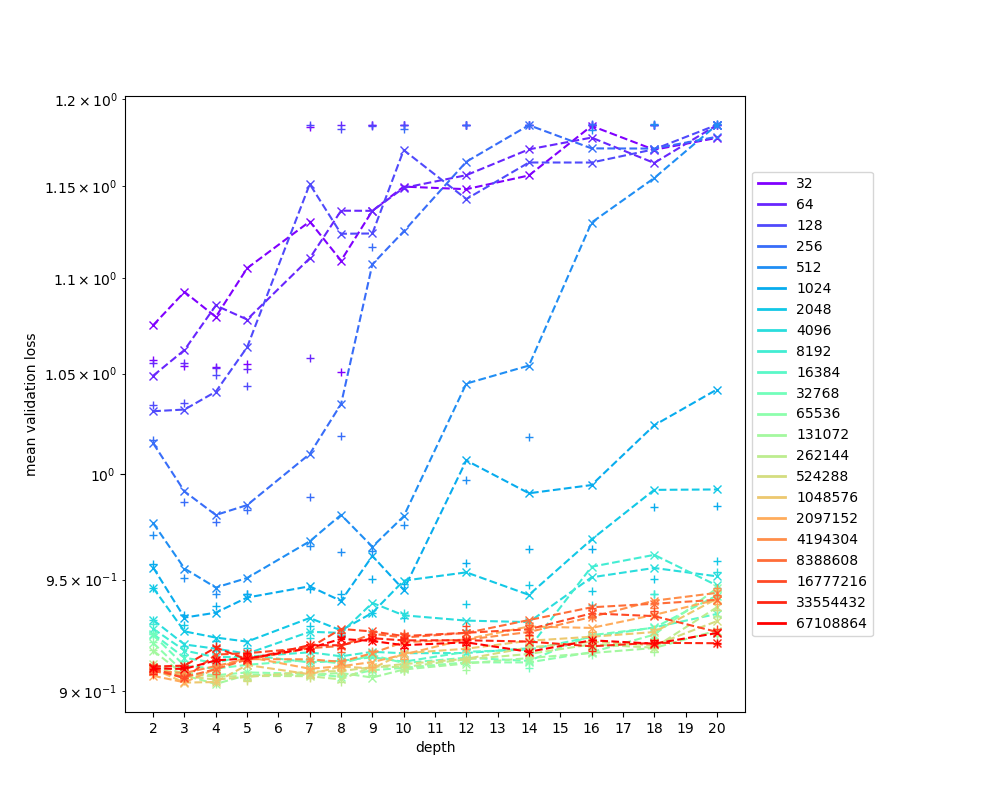

{'config.topology': 'wide_first', 'config.residual_mode': 'full'}


<IPython.core.display.Javascript object>


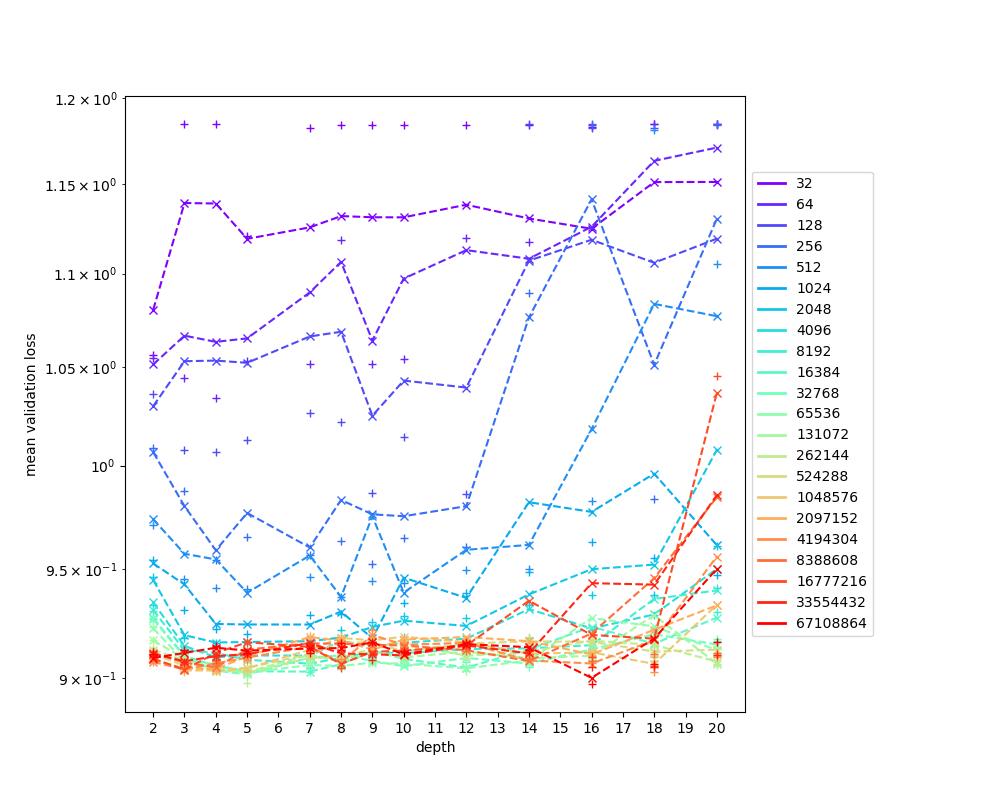

{'config.topology': 'wide_first', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


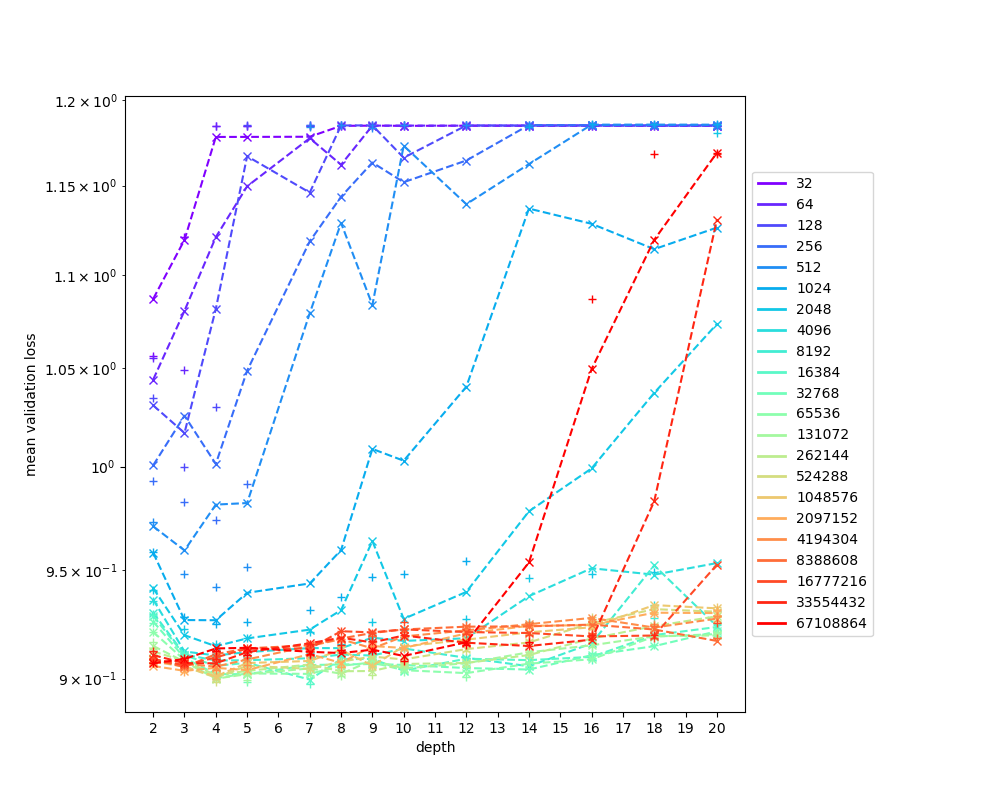

In [16]:
plot_dataset('wine_quality_white')

In [17]:

def plot_colored_grid(data, xlabel, ylabel, xlabels = None, ylabels = None, color_bounds = None):
#     ax.imshow(gradient, aspect='auto', cmap=plt.get_cmap(name))
    cmap = plt.get_cmap('plasma')
#     norm = colors.Normalize(np.min(data), np.max(data), cmap.N)
    if color_bounds is None:
        color_bounds = lambda data : (np.min(data), np.max(data))
    min_color_bounds, max_color_bounds = color_bounds(data)
    norm = mpl.colors.Normalize(min_color_bounds, max_color_bounds, cmap.N)
    print(f'{np.min(data)} {np.max(data)}')
    
    fig, ax = plt.subplots()
    ax.imshow(data, cmap=cmap, norm=norm)

    # draw gridlines
    ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=2)
    ax.set_xticks(np.arange(-.5, data.shape[1], 1));
    ax.set_yticks(np.arange(-.5, data.shape[0], 1));
    
    if xlabels is not None:
        ax.set_yticklabels([''] + xlabels)
    if ylabels is not None:
        ax.set_xticklabels(ylabels + [''])
        plt.xticks(rotation=45)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    plt.show()
    return ax


def plot_grid_from_dataset(datasets, val_function, title, x_category, y_category, color_bounds = None):

    # grouped = datasets.groupby([x_category, y_category]) #, as_index=False)
    #     return [grouped.get_group(group) for group in grouped.groups], list(grouped.groups.keys())

    # pd.groupby
    x_values = sorted(pd.unique(datasets[x_category]))
    y_values = sorted(pd.unique(datasets[y_category]))
    print(x_values)
    print(y_values)
    result = np.zeros((len(x_values), len(y_values)))
    for x, x_value in enumerate(sorted(pd.unique(datasets[x_category]))):
        x_subset = datasets[datasets[x_category] == x_value]
        for y, y_value in enumerate(sorted(pd.unique(datasets[y_category]))):
            subset = x_subset[x_subset[y_category] == y_value]
            result[x, y] = val_function(subset)

    ax = plot_colored_grid(result, y_category, x_category, x_values, y_values, color_bounds = color_bounds)
    ax.set_title(title)
    print(result)


dataset: 529_pollen
['exponential none', 'rectangle full', 'rectangle none', 'trapezoid none', 'wide_first full', 'wide_first none']
[32, 64, 128, 256, 512, 1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
-5.453700258514948 -5.2345682772574875


<IPython.core.display.Javascript object>


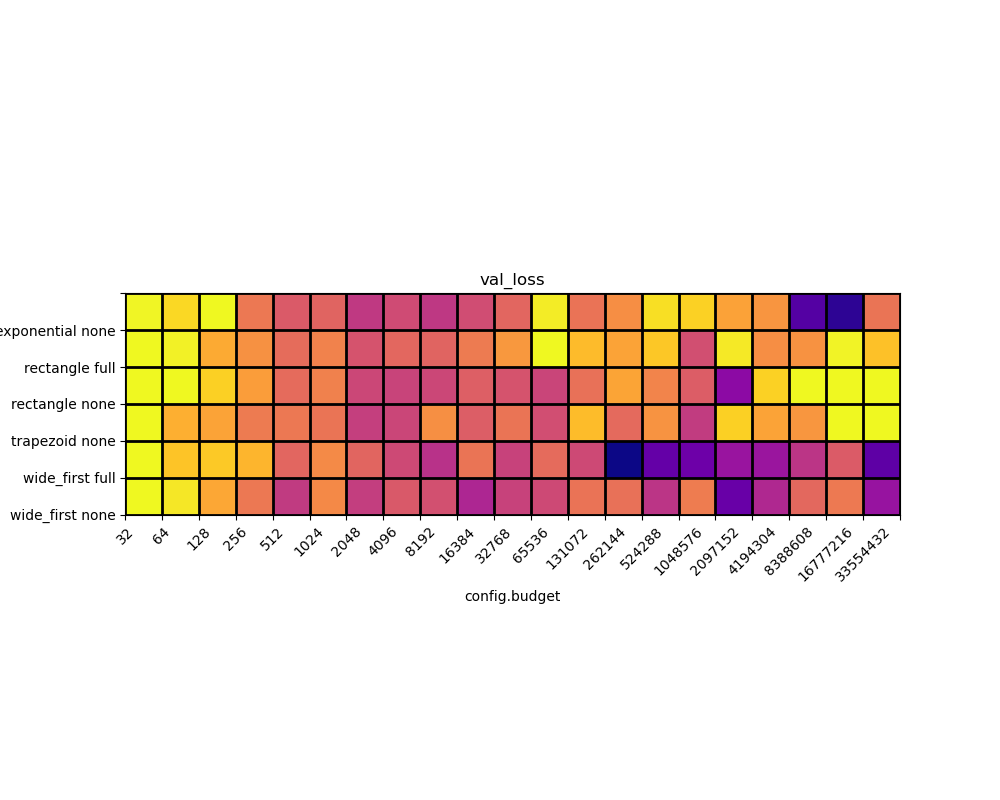

[[-5.4453164  -5.44587234 -5.4451368  -5.44806179 -5.44889288 -5.4486246
  -5.44986542 -5.44933432 -5.44988807 -5.4492973  -5.44855863 -5.44549241
  -5.44818402 -5.44751404 -5.44575682 -5.4460201  -5.44705175 -5.44734413
  -5.45244837 -5.45323122 -5.44816329]
 [-5.44384847 -5.44538179 -5.44685676 -5.44745367 -5.44839127 -5.44780711
  -5.44907602 -5.44852327 -5.44863373 -5.44800737 -5.44727786 -5.44469736
  -5.44648067 -5.447002   -5.446207   -5.44920776 -5.44557219 -5.44750675
  -5.44742327 -5.4453514  -5.44634603]
 [-5.44414707 -5.44427367 -5.44604512 -5.44712997 -5.44842579 -5.44784544
  -5.44946547 -5.44956027 -5.44947044 -5.44877191 -5.4490859  -5.44951425
  -5.4482708  -5.44696996 -5.447778   -5.44881827 -5.45125356 -5.44601616
  -5.44481359 -5.44508692 -5.44344268]
 [-5.33346604 -5.44676116 -5.4470027  -5.44799214 -5.44808046 -5.44815506
  -5.44967264 -5.44950279 -5.44746378 -5.44879175 -5.44816598 -5.44925334
  -5.4464577  -5.44847317 -5.44737625 -5.44978455 -5.44606136 -5.44701

<IPython.core.display.Javascript object>


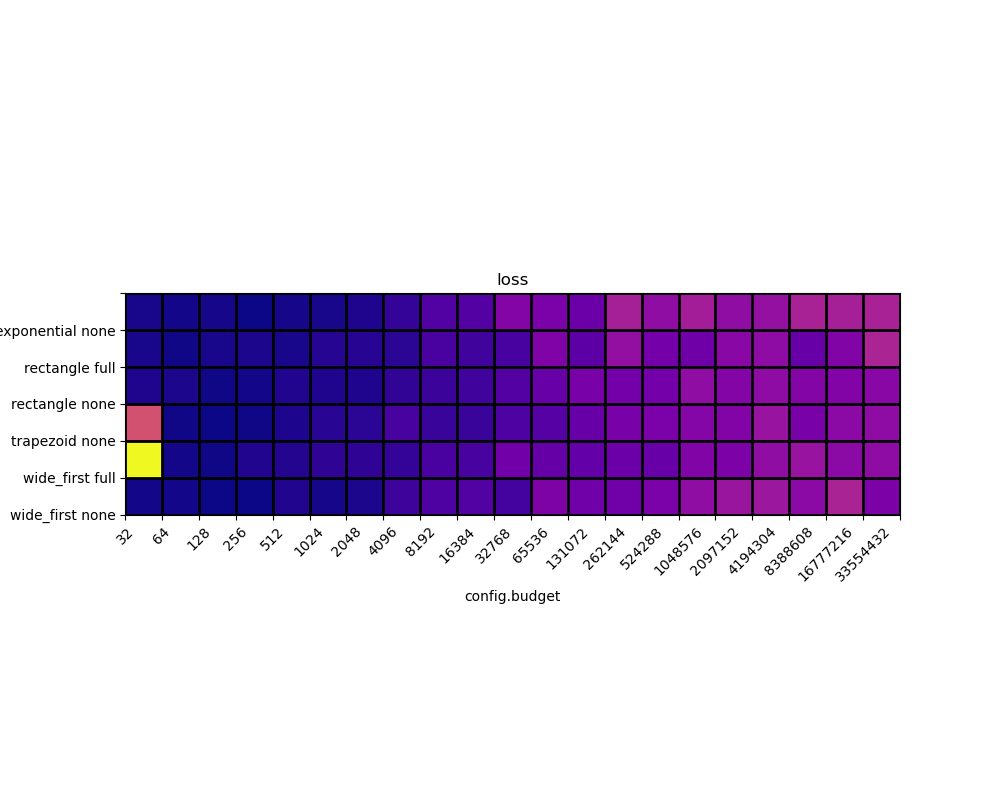

[[-5.54058511 -5.54254082 -5.54092977 -5.54361894 -5.54100287 -5.54013647
  -5.53776699 -5.52816739 -5.51168768 -5.51150694 -5.48407488 -5.48900649
  -5.49747067 -5.46172777 -5.4763113  -5.46329265 -5.47633298 -5.47365481
  -5.4595795  -5.46167105 -5.4595037 ]
 [-5.54020395 -5.54297747 -5.54054271 -5.53968311 -5.53992545 -5.53534742
  -5.53389224 -5.53258293 -5.51697113 -5.52149324 -5.51781694 -5.48652964
  -5.50654371 -5.47451712 -5.49310183 -5.49574506 -5.48024938 -5.47747285
  -5.49929728 -5.48508812 -5.45809746]
 [-5.53788705 -5.53954684 -5.54302755 -5.54200568 -5.53682573 -5.53798453
  -5.53746639 -5.53004398 -5.52472122 -5.52182296 -5.51142455 -5.50044343
  -5.49019626 -5.49385054 -5.49335585 -5.47684007 -5.48372877 -5.47727245
  -5.48386821 -5.4842517  -5.48051695]
 [-5.42317059 -5.54317702 -5.54379494 -5.54340598 -5.53824118 -5.53321527
  -5.53222204 -5.5186535  -5.52652062 -5.52641828 -5.51391081 -5.51058529
  -5.49933172 -5.49073868 -5.48931848 -5.48251773 -5.484238   -5.4709

<IPython.core.display.Javascript object>


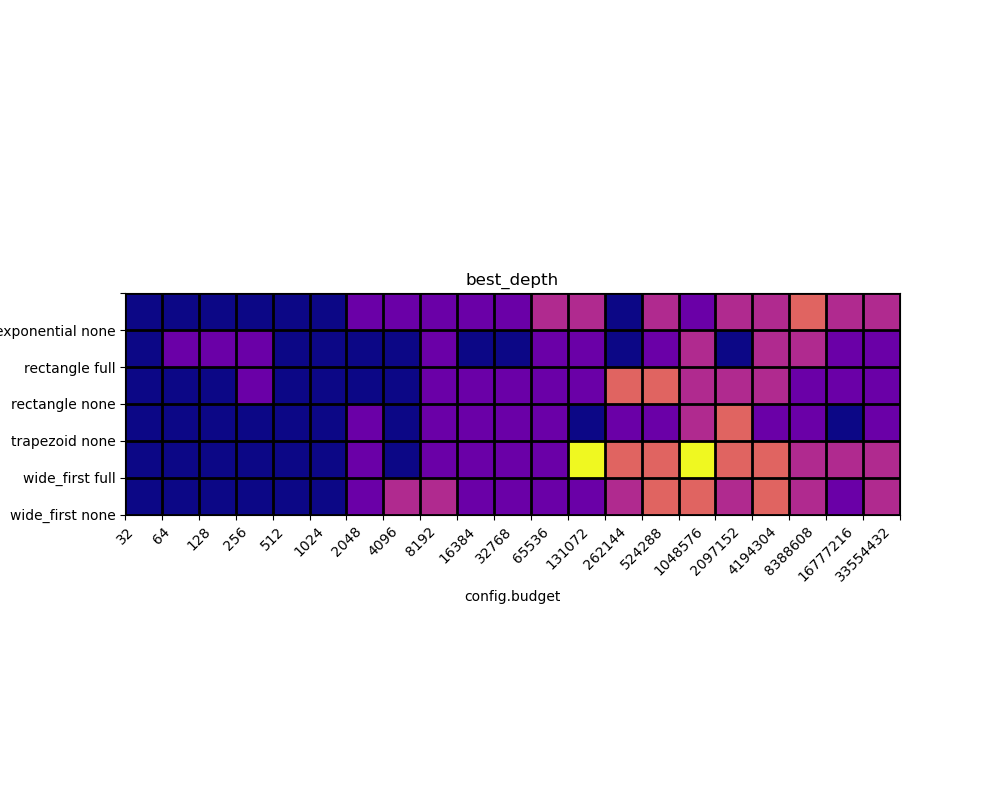

[[2. 2. 2. 2. 2. 2. 3. 3. 3. 3. 3. 4. 4. 2. 4. 3. 4. 4. 5. 4. 4.]
 [2. 3. 3. 3. 2. 2. 2. 2. 3. 2. 2. 3. 3. 2. 3. 4. 2. 4. 4. 3. 3.]
 [2. 2. 2. 3. 2. 2. 2. 2. 3. 3. 3. 3. 3. 5. 5. 4. 4. 4. 3. 3. 3.]
 [2. 2. 2. 2. 2. 2. 3. 2. 3. 3. 3. 3. 2. 3. 3. 4. 5. 3. 3. 2. 3.]
 [2. 2. 2. 2. 2. 2. 3. 2. 3. 3. 3. 3. 7. 5. 5. 7. 5. 5. 4. 4. 4.]
 [2. 2. 2. 2. 2. 2. 3. 4. 4. 3. 3. 3. 3. 4. 5. 5. 4. 5. 4. 3. 4.]]
['exponential none', 'rectangle full', 'rectangle none', 'trapezoid none', 'wide_first full', 'wide_first none']
[32, 64, 128, 256, 512, 1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
20.9 607.4333333333333


<IPython.core.display.Javascript object>


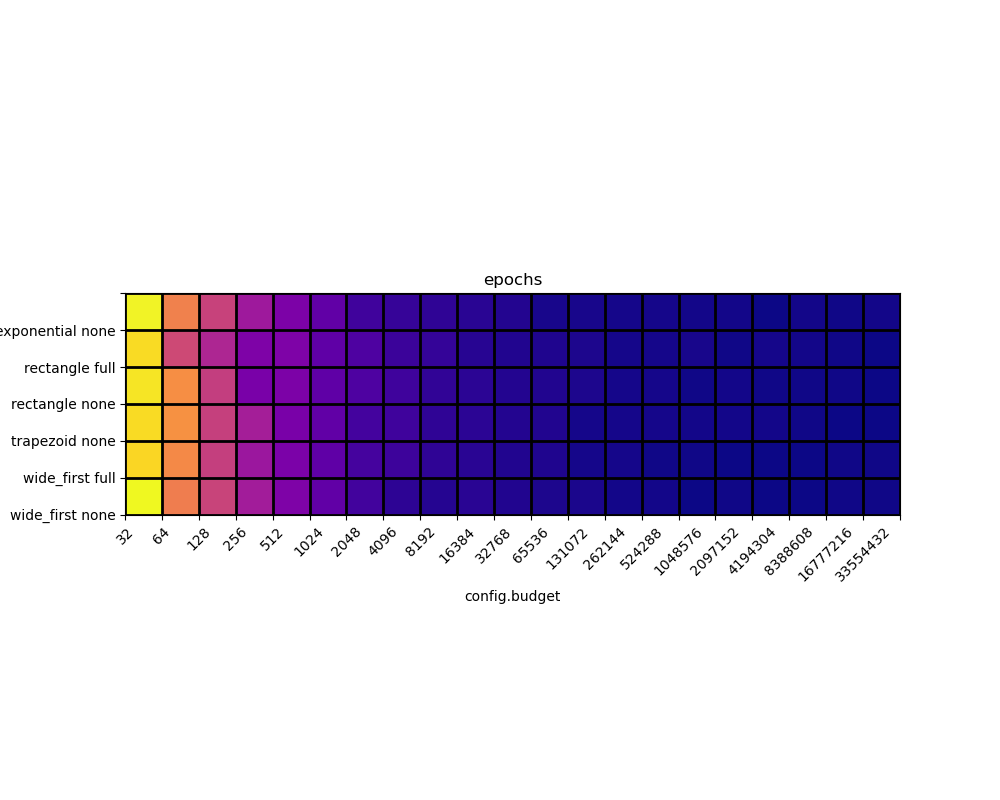

[[599.56666667 426.63333333 305.13333333 222.1        166.5
  124.83333333  80.43333333  64.83333333  56.8         49.53333333
   43.1         31.43333333  30.93333333  29.73333333  29.4
   25.53333333  26.7         23.16666667  27.16666667  24.8
   25.96666667]
 [567.56666667 319.83333333 247.83333333 168.73333333 167.8
  123.03333333  97.26666667  73.46666667  62.7         47.65625
   40.02857143  38.02857143  36.89473684  28.10526316  29.31428571
   30.16129032  25.47368421  27.84375     27.06666667  23.7
   23.1       ]
 [580.06666667 451.36666667 296.53333333 160.9        167.4
  122.66666667  97.4         77.83333333  58.03333333  52.1
   43.4         39.73333333  34.8         28.43333333  27.83333333
   24.9         25.96666667  23.2         23.9         25.23333333
   20.9       ]
 [568.23333333 455.66666667 301.66666667 233.16666667 162.06666667
  125.          84.2         76.16666667  57.16666667  51.16666667
   43.1         40.13333333  29.63333333  29.8         28.46666667

<IPython.core.display.Javascript object>


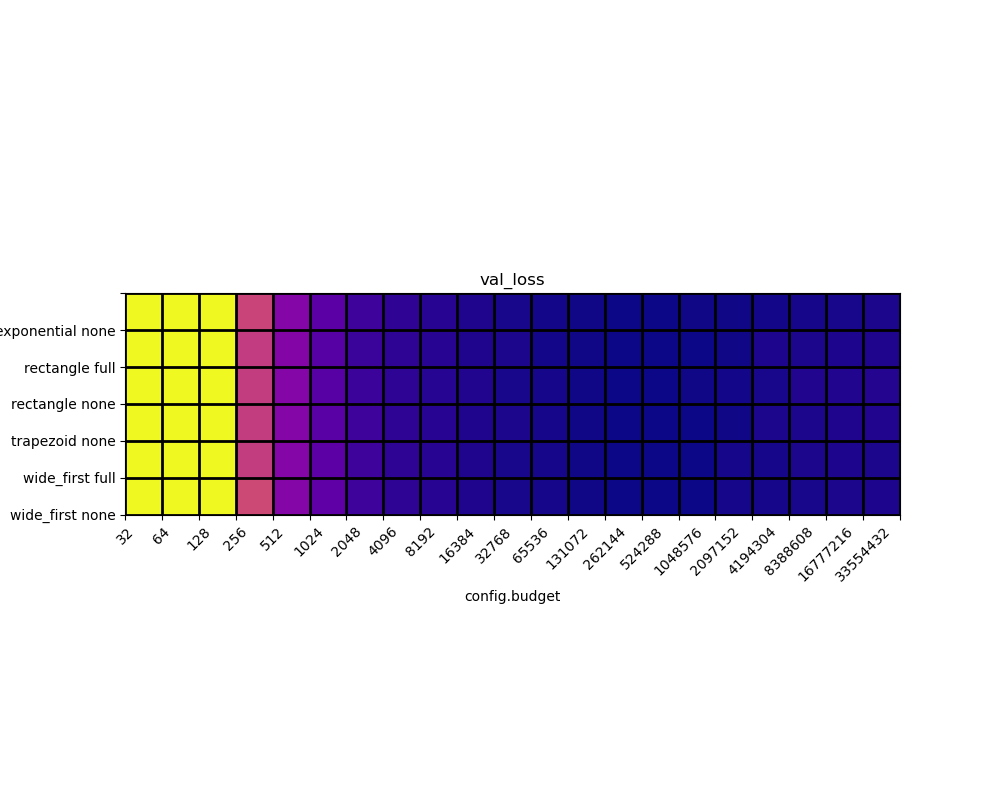

[[-0.10756256 -0.10749371 -0.10797632 -0.28509338 -0.36416496 -0.40250302
  -0.42716031 -0.43811793 -0.44409318 -0.44852273 -0.45285955 -0.45571574
  -0.45735791 -0.45863433 -0.45930886 -0.45722122 -0.45695188 -0.45586583
  -0.45468944 -0.45274663 -0.45212972]
 [-0.10763396 -0.10752711 -0.10777009 -0.29682893 -0.36602798 -0.40610833
  -0.42931808 -0.44009816 -0.4442856  -0.44889064 -0.45247619 -0.45541423
  -0.45763674 -0.45887071 -0.45874952 -0.45886775 -0.45748426 -0.45124052
  -0.45161092 -0.45050604 -0.44867754]
 [-0.10260252 -0.1076405  -0.09079184 -0.29535284 -0.36416948 -0.40588459
  -0.42916012 -0.43940328 -0.44457886 -0.44834095 -0.45265319 -0.45505036
  -0.45745355 -0.45831886 -0.45867401 -0.45681918 -0.45613354 -0.45284038
  -0.44834479 -0.44840189 -0.44645902]
 [-0.10784331 -0.10251963 -0.10784411 -0.29529918 -0.36398189 -0.40367507
  -0.42711888 -0.43929874 -0.444194   -0.44942297 -0.4524484  -0.45500864
  -0.45739268 -0.45864499 -0.4594274  -0.45844304 -0.45678729 -0.4524

<IPython.core.display.Javascript object>


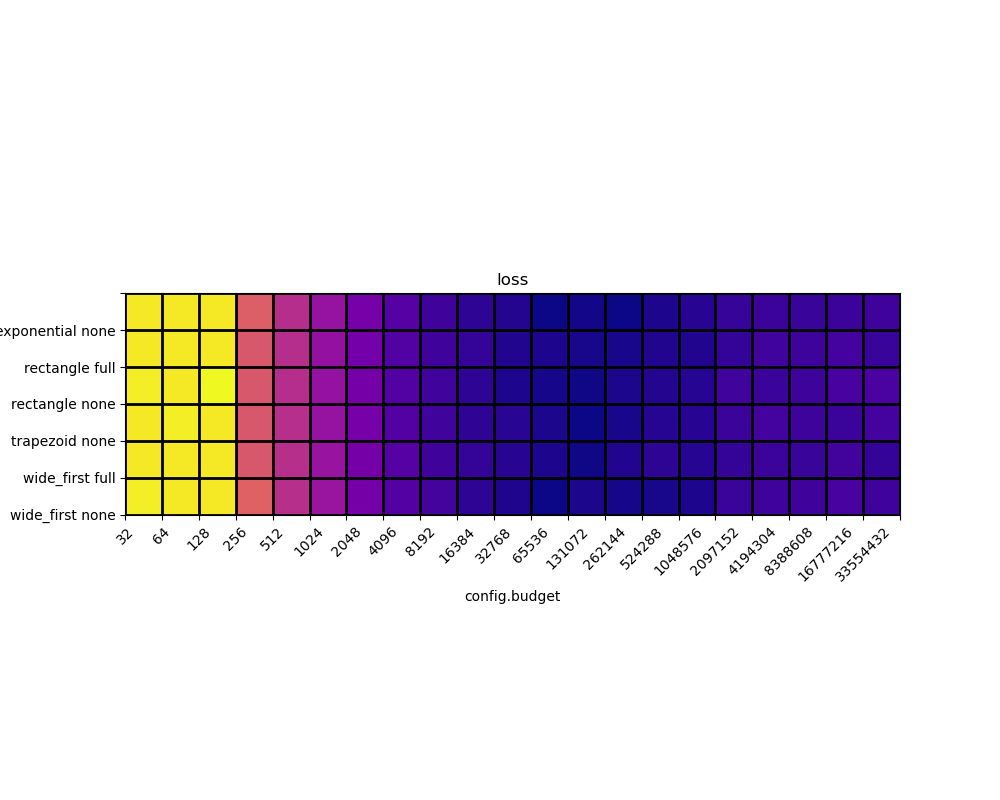

[[-0.10877118 -0.10871144 -0.10902876 -0.29012841 -0.36717809 -0.41367088
  -0.45540879 -0.49364868 -0.51936683 -0.53743598 -0.54718846 -0.56330284
  -0.56070365 -0.56399614 -0.55362874 -0.54339749 -0.52871408 -0.52313259
  -0.52767132 -0.52251934 -0.51990933]
 [-0.10875938 -0.10842056 -0.1088976  -0.30130708 -0.36786108 -0.41719541
  -0.45772343 -0.49815691 -0.52040909 -0.5329689  -0.54891682 -0.55322865
  -0.55670686 -0.55707461 -0.55011602 -0.54966484 -0.53028964 -0.51833292
  -0.52236659 -0.51353299 -0.52637741]
 [-0.10359    -0.10885299 -0.09165723 -0.30105352 -0.36723739 -0.41662973
  -0.45753687 -0.49659385 -0.51689036 -0.53867218 -0.55201046 -0.55789388
  -0.56299373 -0.55543766 -0.54652368 -0.5455966  -0.51825186 -0.52452472
  -0.52111891 -0.510076   -0.50605026]
 [-0.10900528 -0.10345489 -0.10900244 -0.30101337 -0.36710906 -0.41359696
  -0.45553469 -0.49481951 -0.5180047  -0.53560541 -0.54235722 -0.55393499
  -0.56493081 -0.55646258 -0.54636675 -0.54328471 -0.52297167 -0.5147

<IPython.core.display.Javascript object>


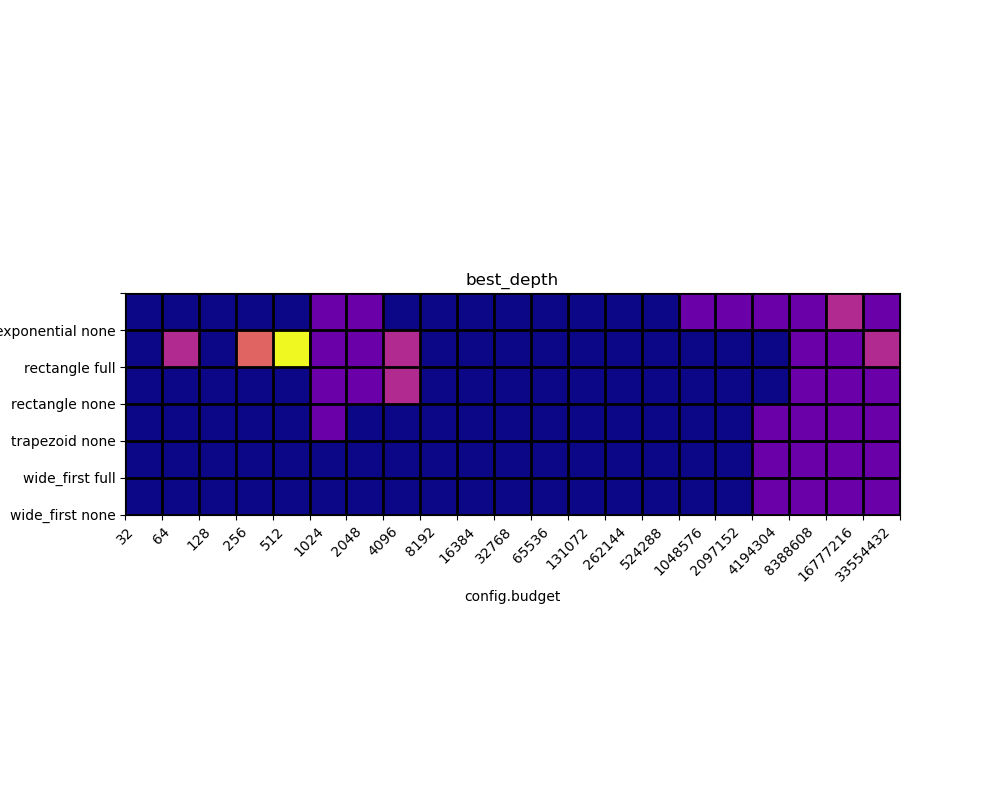

[[2. 2. 2. 2. 2. 3. 3. 2. 2. 2. 2. 2. 2. 2. 2. 3. 3. 3. 3. 4. 3.]
 [2. 4. 2. 5. 7. 3. 3. 4. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 3. 3. 4.]
 [2. 2. 2. 2. 2. 3. 3. 4. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 3. 3. 3.]
 [2. 2. 2. 2. 2. 3. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 3. 3. 3. 3.]
 [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 3. 3. 3. 3.]
 [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 3. 3. 3. 3.]]
['exponential none', 'rectangle full', 'rectangle none', 'trapezoid none', 'wide_first full', 'wide_first none']
[32, 64, 128, 256, 512, 1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
2.1666666666666665 209.0


<IPython.core.display.Javascript object>


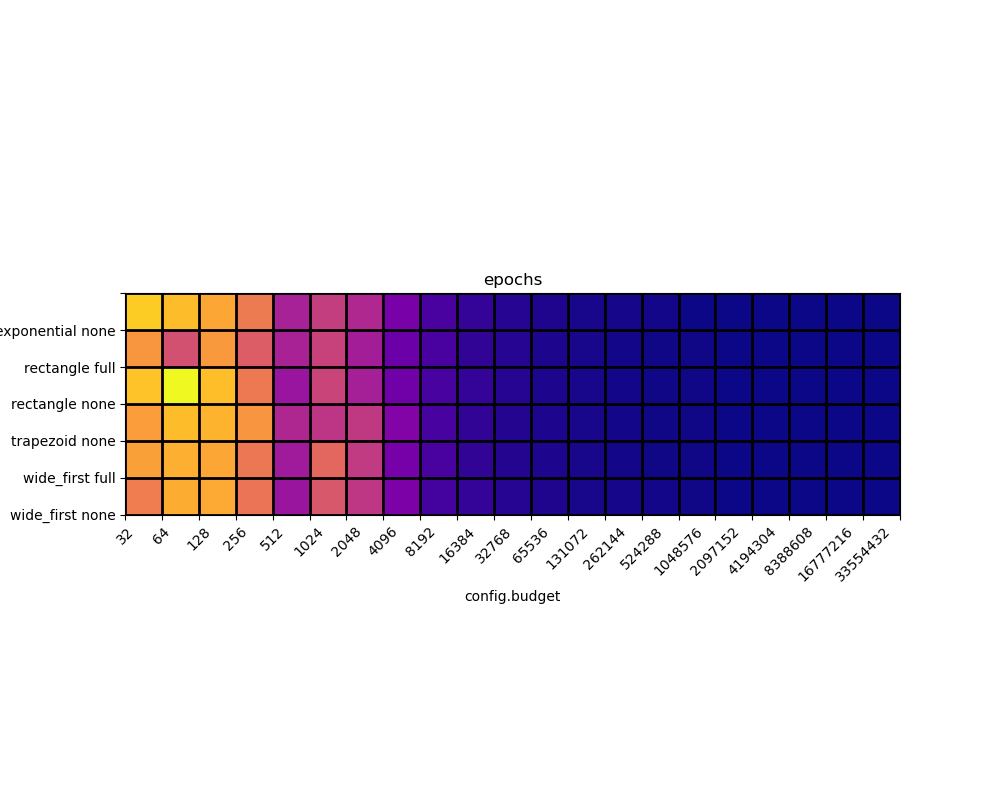

[[187.63333333 179.9        168.1        141.6         78.7
   99.16666667  83.9         51.66666667  26.93333333  16.
   10.4          7.9          5.8          4.73333333   3.83333333
    2.83333333   2.73333333   2.6          2.6          2.46666667
    2.46666667]
 [158.16666667 112.8        160.5        121.          79.1
  102.8         76.3         44.66666667  26.86666667  15.46666667
   10.53333333   7.43333333   5.7          4.56666667   3.76666667
    3.36666667   2.86666667   2.6          2.5          2.23333333
    2.4       ]
 [182.73333333 209.         180.6        140.7         69.93333333
  104.7         77.93333333  47.3         25.63333333  16.33333333
   10.8          7.63333333   5.9          4.53333333   3.7
    3.3          2.6          2.46666667   2.26666667   2.3
    2.16666667]
 [162.8        179.33333333 174.8        157.4         83.1
   94.06666667  95.9         56.76666667  26.4         15.8
   10.03333333   7.46666667   5.93333333   4.56666667   3.7
    

<IPython.core.display.Javascript object>


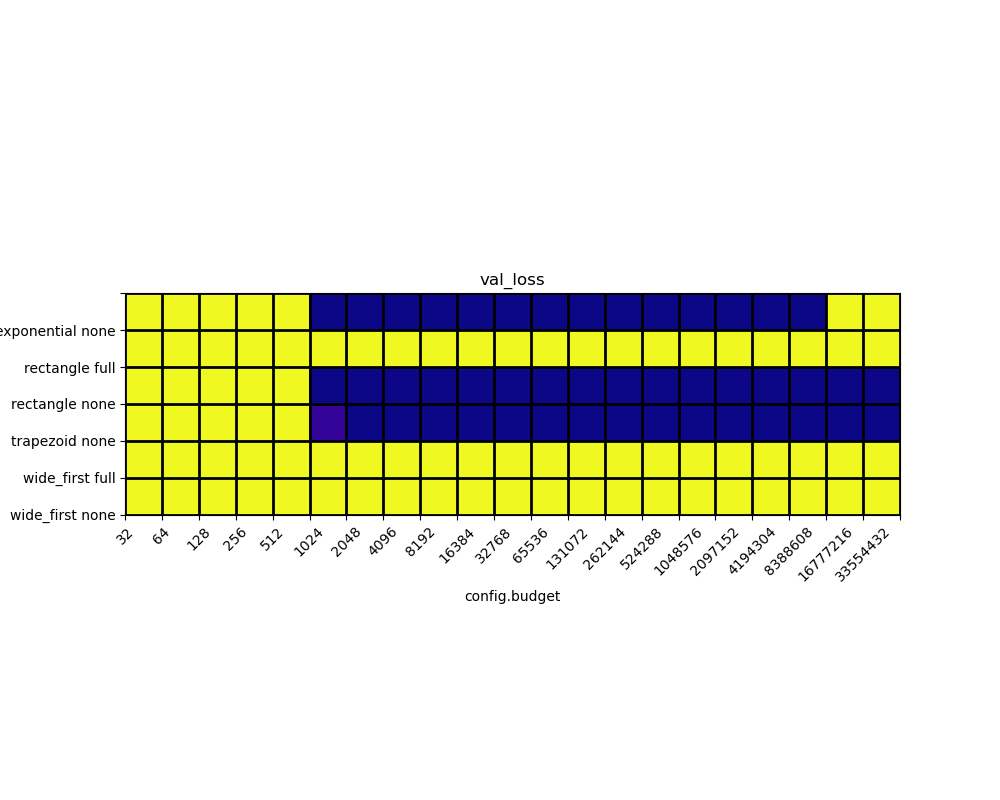

[[1.2821301  1.2821301  1.2821301  1.2821301  1.2821301  1.25126377
  1.25126039 1.25132503 1.25133636 1.25125252 1.25127213 1.25129269
  1.25127469 1.25130291 1.25127436 1.25128994 1.25128286 1.25127363
  1.25125064 1.2821301  1.2821301 ]
 [1.2821301  1.2821301  1.2821301  1.2821301  1.2821301  1.2821301
  1.2821301  1.2821301  1.2821301  1.2821301  1.2821301  1.2821301
  1.2821301  1.2821301  1.2821301  1.2821301  1.2821301  1.2821301
  1.2821301  1.2821301  1.2821301 ]
 [1.2821301  1.2821301  1.2821301  1.2821301  1.2821301  1.25122919
  1.25125389 1.25125307 1.25128775 1.25127047 1.25127611 1.25127372
  1.25128996 1.25127996 1.25128012 1.25127746 1.25126967 1.25127958
  1.25127411 1.2512677  1.25129476]
 [1.2821301  1.2821301  1.2821301  1.2821301  1.2821301  1.25344688
  1.25128022 1.25125262 1.25128629 1.25129771 1.25128547 1.25129041
  1.25129055 1.25129499 1.25126406 1.25128961 1.25127817 1.25127516
  1.25126153 1.25129251 1.25126864]
 [1.2821301  1.2821301  1.2821301  1.282130

<IPython.core.display.Javascript object>


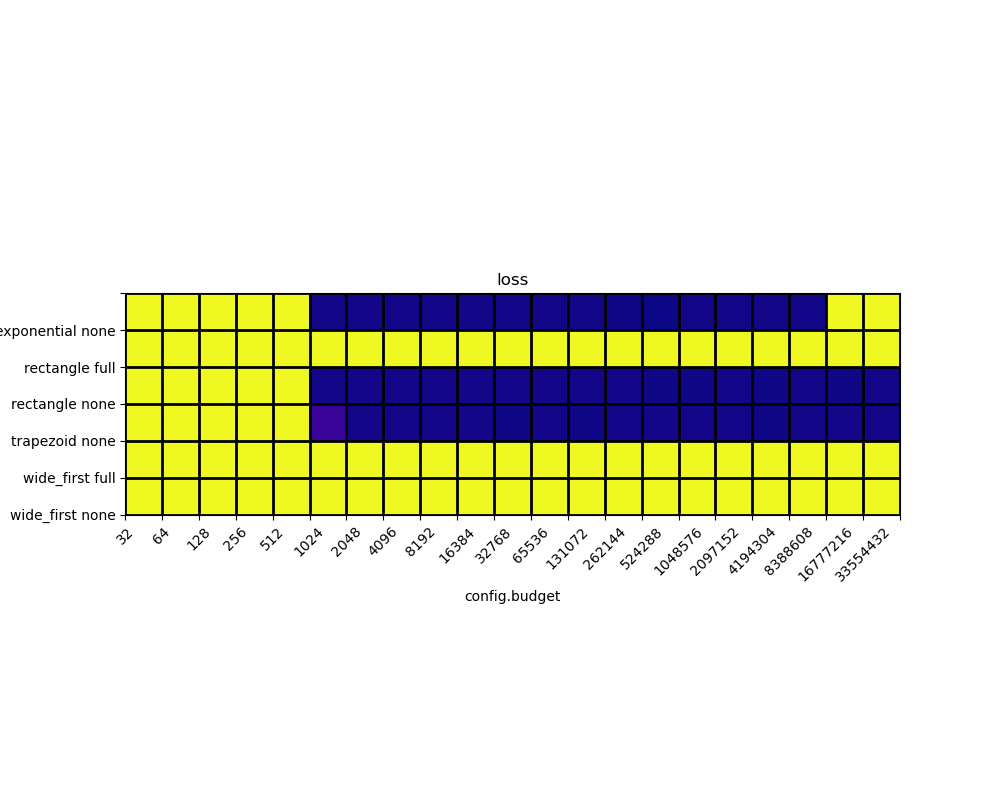

[[1.29746437 1.29746434 1.29746432 1.29746434 1.29746433 1.2664565
  1.26642204 1.26636264 1.26640497 1.26635192 1.26634488 1.26640417
  1.26642717 1.26626046 1.26609073 1.26633692 1.26634111 1.26643782
  1.26637974 1.29746431 1.29746434]
 [1.29746434 1.29746432 1.29746434 1.29746434 1.29746437 1.29746434
  1.29746435 1.29746434 1.29746435 1.29746437 1.29746428 1.29746437
  1.29746433 1.2974643  1.29746432 1.29746432 1.29746435 1.29746435
  1.29746435 1.29746427 1.29746435]
 [1.29746429 1.29746432 1.29746433 1.29746434 1.29746434 1.26640042
  1.26642796 1.26643315 1.26638685 1.26637584 1.26643684 1.26634677
  1.2664122  1.26635265 1.26633132 1.26628882 1.26635626 1.26628877
  1.26634187 1.26626914 1.26637469]
 [1.29746436 1.29746435 1.29746434 1.29746434 1.29746434 1.26874163
  1.26639388 1.26640712 1.26638212 1.26637228 1.26629256 1.26634069
  1.26633302 1.26635212 1.26635597 1.26636461 1.26640131 1.26630118
  1.26636508 1.26637553 1.2664432 ]
 [1.29746435 1.29746434 1.29746433 1.2974

<IPython.core.display.Javascript object>


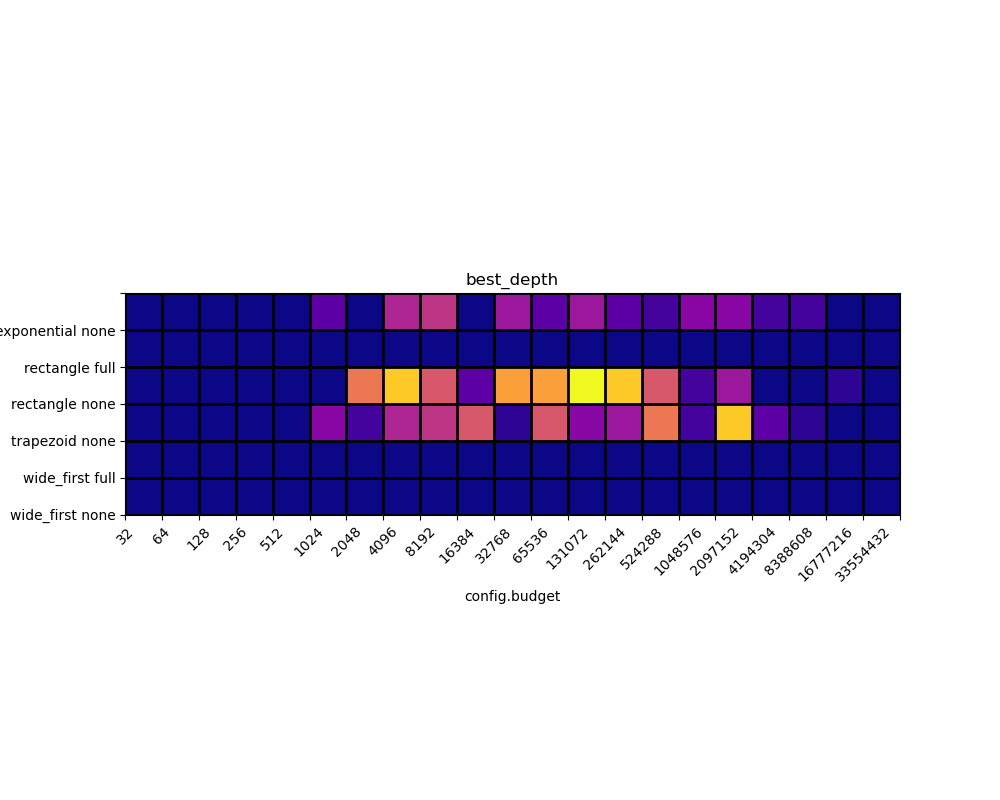

[[ 2.  2.  2.  2.  2.  5.  2.  9. 10.  2.  8.  5.  8.  5.  4.  7.  7.  4.
   4.  2.  2.]
 [ 2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.
   2.  2.  2.]
 [ 2.  2.  2.  2.  2.  2. 14. 18. 12.  5. 16. 16. 20. 18. 12.  4.  8.  2.
   2.  3.  2.]
 [ 2.  2.  2.  2.  2.  7.  4.  9. 10. 12.  3. 12.  7.  8. 14.  4. 18.  5.
   3.  2.  2.]
 [ 2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.
   2.  2.  2.]
 [ 2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.
   2.  2.  2.]]
['exponential none', 'rectangle full', 'rectangle none', 'trapezoid none', 'wide_first full', 'wide_first none']
[32, 64, 128, 256, 512, 1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
1.0 4.766666666666667


<IPython.core.display.Javascript object>


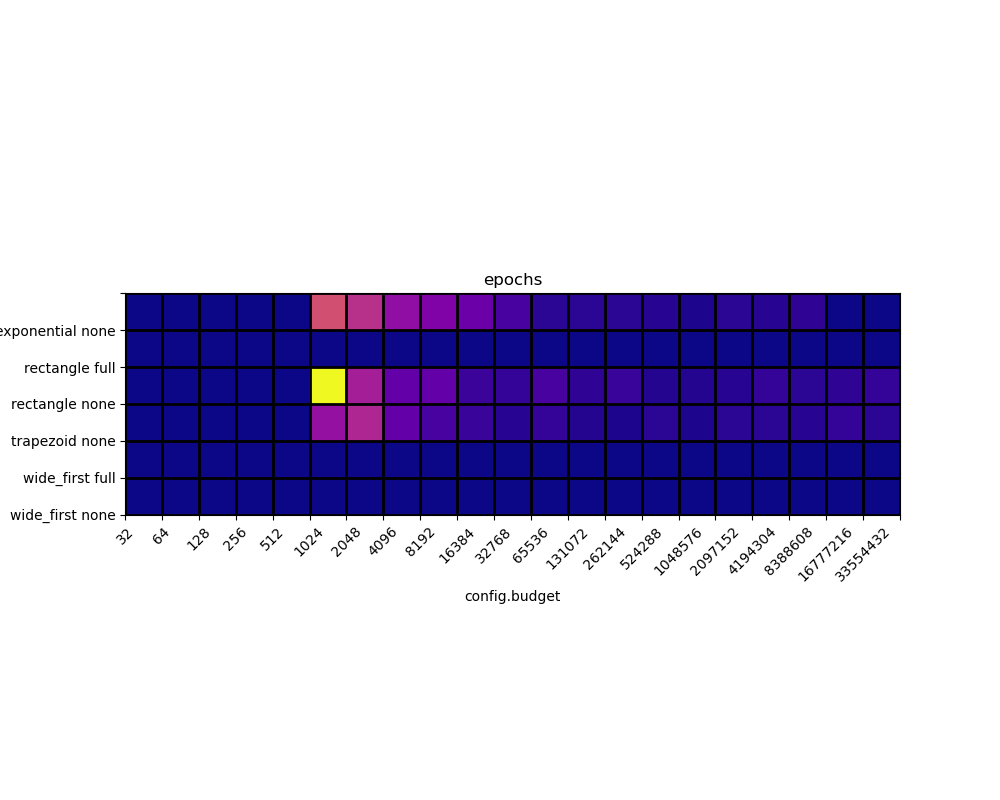

[[1.         1.         1.         1.         1.         3.
  2.6        2.13333333 1.96666667 1.76666667 1.43333333 1.2
  1.2        1.2        1.16666667 1.1        1.2        1.16666667
  1.23333333 1.         1.        ]
 [1.         1.         1.         1.         1.         1.
  1.         1.         1.         1.         1.         1.
  1.         1.         1.         1.         1.         1.
  1.         1.         1.        ]
 [1.         1.         1.         1.         1.         4.76666667
  2.36666667 1.7        1.7        1.33333333 1.26666667 1.43333333
  1.23333333 1.3        1.13333333 1.13333333 1.16666667 1.26666667
  1.2        1.23333333 1.26666667]
 [1.         1.         1.         1.         1.         2.16666667
  2.46666667 1.7        1.43333333 1.3        1.16666667 1.26666667
  1.13333333 1.1        1.2        1.1        1.2        1.2
  1.16666667 1.26666667 1.2       ]
 [1.         1.         1.         1.         1.         1.
  1.         1.         1.

<IPython.core.display.Javascript object>


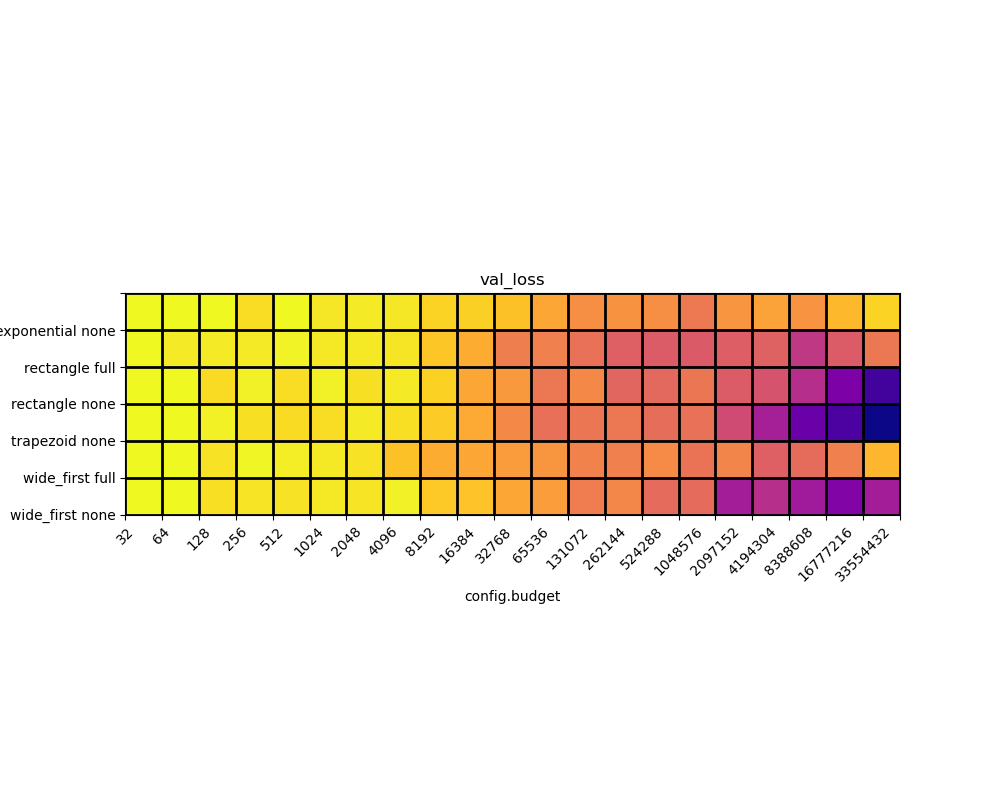

[[-3.97647882 -4.07656241 -4.07864323 -4.08562031 -4.07936535 -4.08355599
  -4.08300393 -4.08377344 -4.08779525 -4.08832412 -4.09121553 -4.09740817
  -4.10284139 -4.10205245 -4.10277607 -4.108057   -4.10134546 -4.09819228
  -4.10171392 -4.09298882 -4.08777259]
 [-3.97290685 -4.08298187 -4.08306085 -4.08306773 -4.08152424 -4.08349316
  -4.0834713  -4.08394925 -4.09013195 -4.09554273 -4.10677873 -4.10671981
  -4.11065898 -4.11519249 -4.11636311 -4.11677268 -4.11540754 -4.11435973
  -4.12663612 -4.11634823 -4.1085199 ]
 [-3.90870481 -4.07559371 -4.08619065 -4.08219409 -4.08584811 -4.08200387
  -4.08495425 -4.08316603 -4.08790827 -4.09694051 -4.10015207 -4.10840785
  -4.10420333 -4.1135979  -4.11292624 -4.10932974 -4.11636763 -4.11885299
  -4.12975703 -4.14382306 -4.15612633]
 [-3.97826737 -4.07450577 -4.08174398 -4.08495801 -4.08591616 -4.08561838
  -4.08293419 -4.08537572 -4.08926316 -4.09615169 -4.10417159 -4.11075959
  -4.10917024 -4.10854015 -4.11143983 -4.11050198 -4.12113743 -4.1340

<IPython.core.display.Javascript object>


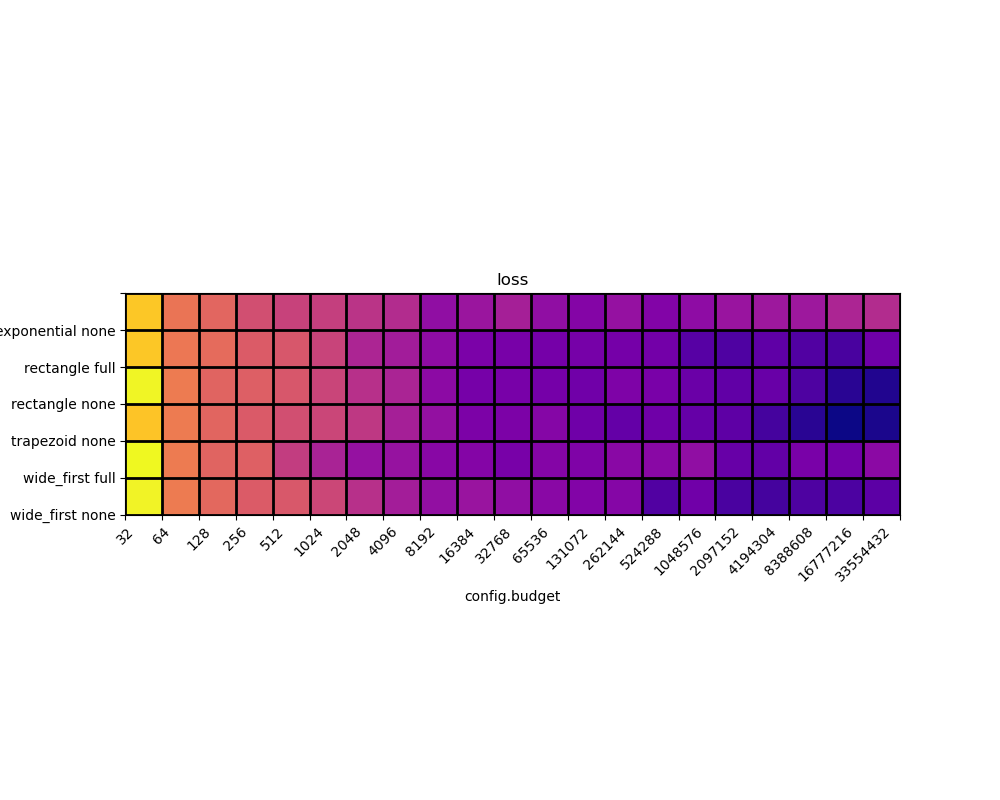

[[-3.92843159 -4.03588332 -4.05835599 -4.09598252 -4.11548881 -4.12075418
  -4.13915811 -4.1533876  -4.20286477 -4.19051071 -4.17361797 -4.20228121
  -4.21983615 -4.1973199  -4.22113714 -4.20638193 -4.19104452 -4.18649054
  -4.18669072 -4.16485945 -4.15301526]
 [-3.92748965 -4.03379895 -4.05093411 -4.07491814 -4.082502   -4.1147488
  -4.16452121 -4.17907014 -4.20650502 -4.23082632 -4.23490889 -4.23807231
  -4.23658789 -4.23792686 -4.24034511 -4.27319711 -4.28149747 -4.26382474
  -4.28075424 -4.28886929 -4.24503717]
 [-3.87779013 -4.02750862 -4.06325094 -4.07042023 -4.08199466 -4.11182965
  -4.14538225 -4.16573028 -4.20751274 -4.23665103 -4.23460987 -4.23746366
  -4.24380608 -4.22748641 -4.23210897 -4.25156654 -4.26186034 -4.25265068
  -4.28474762 -4.32246086 -4.32969178]
 [-3.93217007 -4.02783414 -4.06013019 -4.07748859 -4.09584746 -4.11100913
  -4.13219614 -4.17383292 -4.19924956 -4.22803887 -4.22877513 -4.21742689
  -4.24493985 -4.25756383 -4.24500827 -4.25667279 -4.26490382 -4.29276

<IPython.core.display.Javascript object>


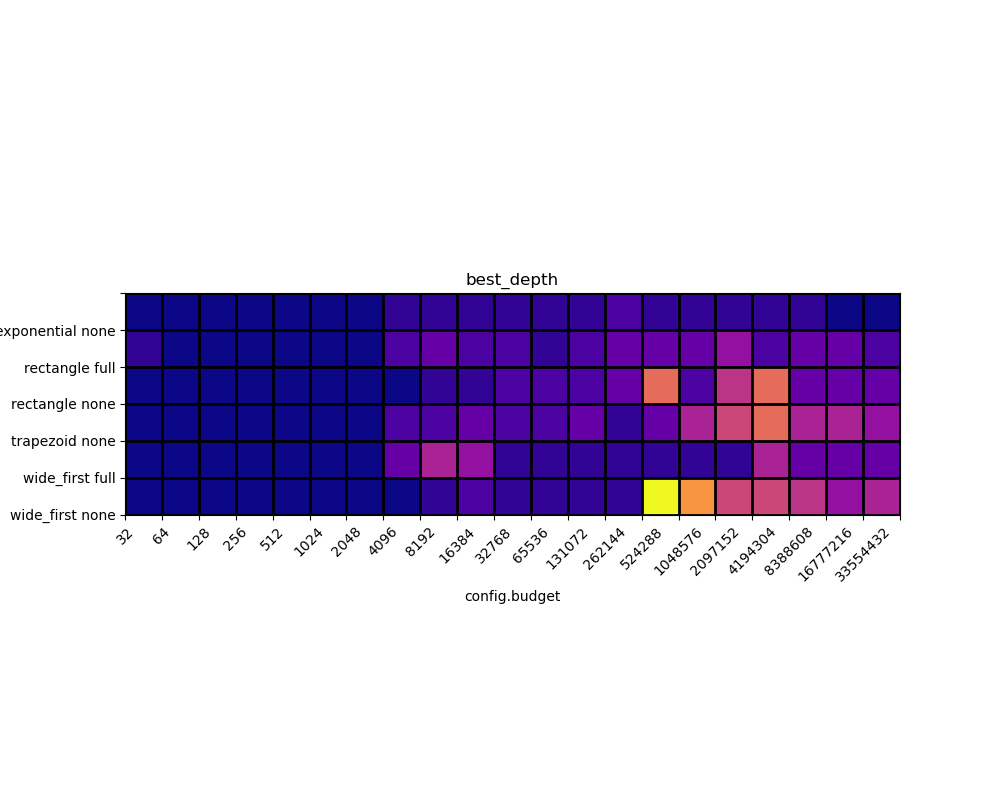

[[ 2.  2.  2.  2.  2.  2.  2.  3.  3.  3.  3.  3.  3.  4.  3.  3.  3.  3.
   3.  2.  2.]
 [ 3.  2.  2.  2.  2.  2.  2.  4.  5.  4.  4.  3.  4.  5.  5.  5.  7.  4.
   5.  5.  4.]
 [ 2.  2.  2.  2.  2.  2.  2.  2.  3.  3.  4.  4.  4.  5. 12.  4.  9. 12.
   5.  5.  5.]
 [ 2.  2.  2.  2.  2.  2.  2.  4.  4.  5.  4.  4.  5.  3.  5.  8. 10. 12.
   8.  8.  7.]
 [ 2.  2.  2.  2.  2.  2.  2.  5.  8.  7.  3.  3.  3.  3.  3.  3.  3.  8.
   5.  5.  5.]
 [ 2.  2.  2.  2.  2.  2.  2.  2.  3.  4.  3.  3.  3.  3. 18. 14. 10. 10.
   9.  7.  8.]]
['exponential none', 'rectangle full', 'rectangle none', 'trapezoid none', 'wide_first full', 'wide_first none']
[32, 64, 128, 256, 512, 1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
6.5 113.33333333333333


<IPython.core.display.Javascript object>


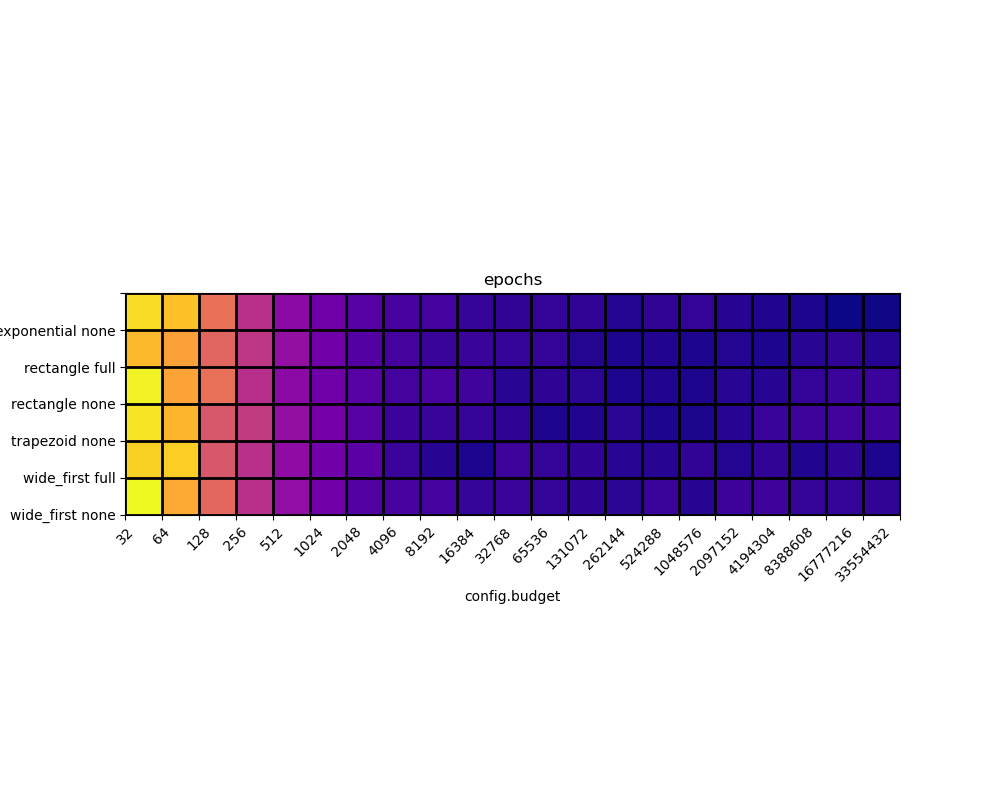

[[106.6         99.5         75.03333333  51.83333333  37.1
   29.43333333  22.66666667  18.86666667  17.93333333  14.43333333
   13.43333333  14.          13.26666667  10.4         13.3
   14.13333333  11.16666667  10.03333333   9.1          6.5
    7.        ]
 [ 97.16666667  90.26666667  70.96666667  54.16666667  39.4
   29.83333333  21.96666667  18.33333333  15.2         15.06666667
   13.83333333  14.13333333  10.3          9.03333333   9.9
    9.06666667  10.53333333   9.16666667  11.8         13.4
   10.9       ]
 [111.66666667  91.16666667  74.63333333  51.26666667  37.06666667
   29.23333333  22.76666667  18.43333333  19.6         17.3
   11.86666667  12.66666667  12.13333333   9.7         10.
    9.5         11.76666667  11.03333333  13.76666667  15.33333333
   15.56666667]
 [108.2         95.83333333  65.83333333  55.6         39.46666667
   30.8         22.36666667  15.7         15.16666667  14.46666667
   12.56666667   9.7         10.06666667  12.16666667   9.03333333
    

<IPython.core.display.Javascript object>


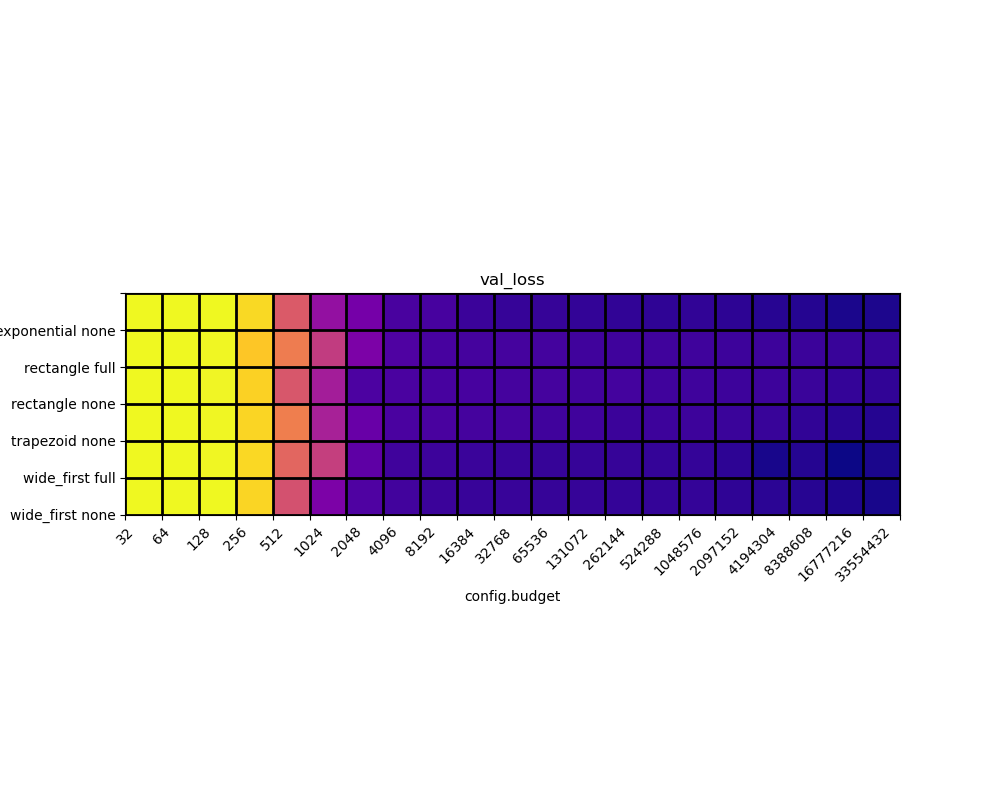

[[ -1.47836343  -1.89162136  -2.22726459  -3.44297125  -9.9218726
  -14.54750254 -16.02889161 -18.00005589 -18.0497864  -18.57199698
  -18.75914536 -18.77868996 -18.8825895  -18.96734726 -19.03982681
  -19.00046375 -19.0942421  -19.30313113 -19.41265827 -19.7432774
  -19.70179488]
 [ -1.62847051  -1.94940968  -2.29808229  -4.29523413  -7.98209474
  -11.80190723 -15.67839317 -17.71466883 -18.07583141 -18.12308071
  -18.12319452 -18.19775083 -18.33310517 -18.38454625 -18.36695826
  -18.44425629 -18.48969306 -18.50325379 -18.55379364 -18.67306642
  -18.79304693]
 [ -1.63586004  -1.89757398  -2.30877169  -3.81784402 -10.10252763
  -13.72543867 -17.8608229  -17.90148904 -18.04030986 -18.07496308
  -18.09823258 -18.1384532  -18.24780422 -18.17795222 -18.34525739
  -18.42590431 -18.49645041 -18.47793598 -18.6345517  -18.85286541
  -18.9974571 ]
 [ -1.48173861  -1.98541385  -2.26473198  -3.65269571  -7.83033713
  -13.49784581 -16.56041342 -17.93657607 -17.96844282 -18.12970743
  -18.14961694 -

<IPython.core.display.Javascript object>


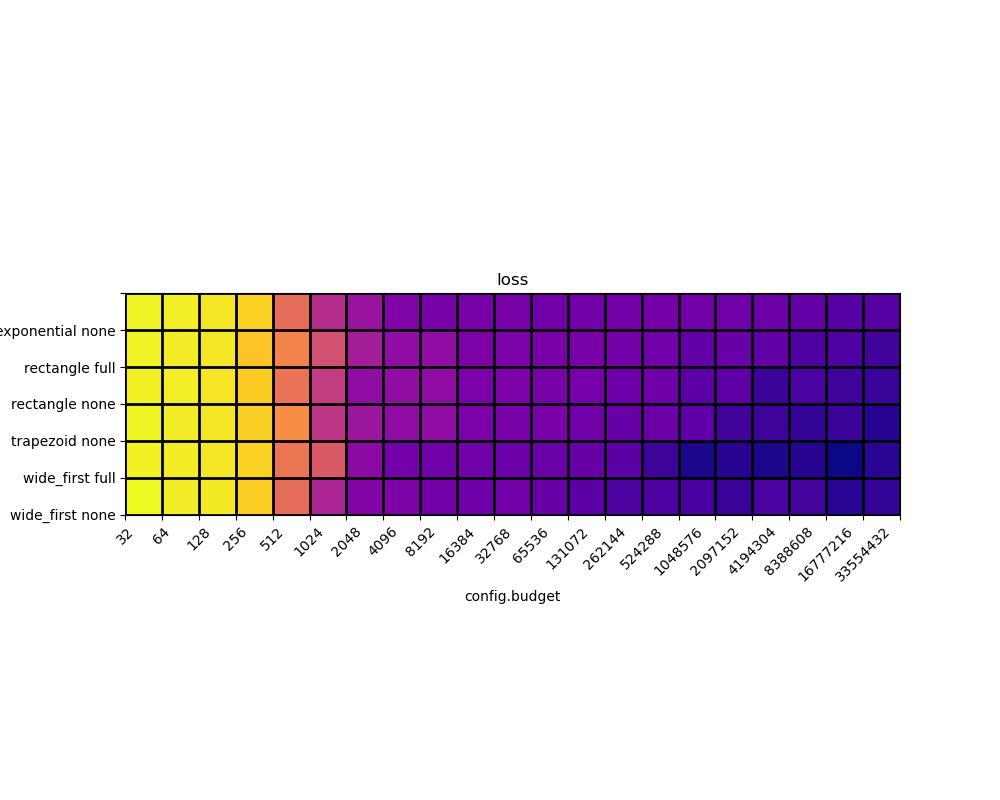

[[ -1.46120275  -1.91087148  -2.25187516  -3.50578442 -10.6259038
  -16.15455702 -18.426097   -20.13030503 -20.55167994 -20.67671392
  -20.61121538 -21.04342284 -21.08163034 -21.06153736 -20.83153564
  -20.98597115 -21.12650608 -21.38944423 -21.86964896 -22.72908288
  -22.69573291]
 [ -1.60947755  -1.96263911  -2.27965397  -4.36363164  -8.77787405
  -13.04335361 -17.57808631 -19.04155763 -19.09202168 -20.35875927
  -20.47614304 -20.53027679 -20.55394274 -20.90370682 -20.997503
  -22.08408506 -21.60330266 -22.09460356 -23.28160141 -23.28656422
  -24.03599221]
 [ -1.61837389  -1.91280808  -2.33222564  -3.88825423 -10.22563112
  -14.82910811 -19.04420002 -19.09104697 -19.1137089  -20.40870825
  -20.29307325 -20.65392401 -20.72698709 -21.29142402 -21.31124017
  -22.50082422 -22.30015356 -24.4467344  -23.49611891 -24.18314988
  -24.60088504]
 [ -1.46578936  -1.9897257   -2.28918234  -3.70025144  -7.88538823
  -15.41962529 -18.11258209 -19.1376812  -19.06734919 -20.4818479
  -20.65535566 -20

<IPython.core.display.Javascript object>


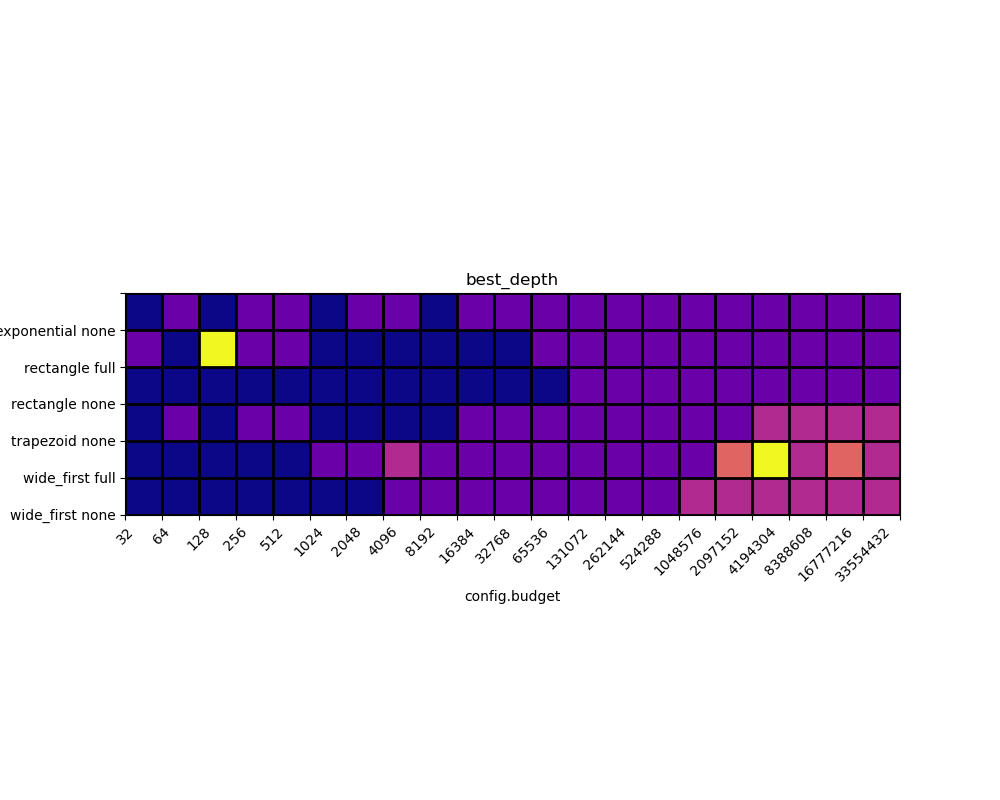

[[2. 3. 2. 3. 3. 2. 3. 3. 2. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.]
 [3. 2. 7. 3. 3. 2. 2. 2. 2. 2. 2. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.]
 [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 3. 3. 3. 3. 3. 3. 3. 3. 3.]
 [2. 3. 2. 3. 3. 2. 2. 2. 2. 3. 3. 3. 3. 3. 3. 3. 3. 4. 4. 4. 4.]
 [2. 2. 2. 2. 2. 3. 3. 4. 3. 3. 3. 3. 3. 3. 3. 3. 5. 7. 4. 5. 4.]
 [2. 2. 2. 2. 2. 2. 2. 3. 3. 3. 3. 3. 3. 3. 3. 4. 4. 4. 4. 4. 4.]]
['exponential none', 'rectangle full', 'rectangle none', 'trapezoid none', 'wide_first full', 'wide_first none']
[32, 64, 128, 256, 512, 1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
191.83333333333334 1093.0


<IPython.core.display.Javascript object>


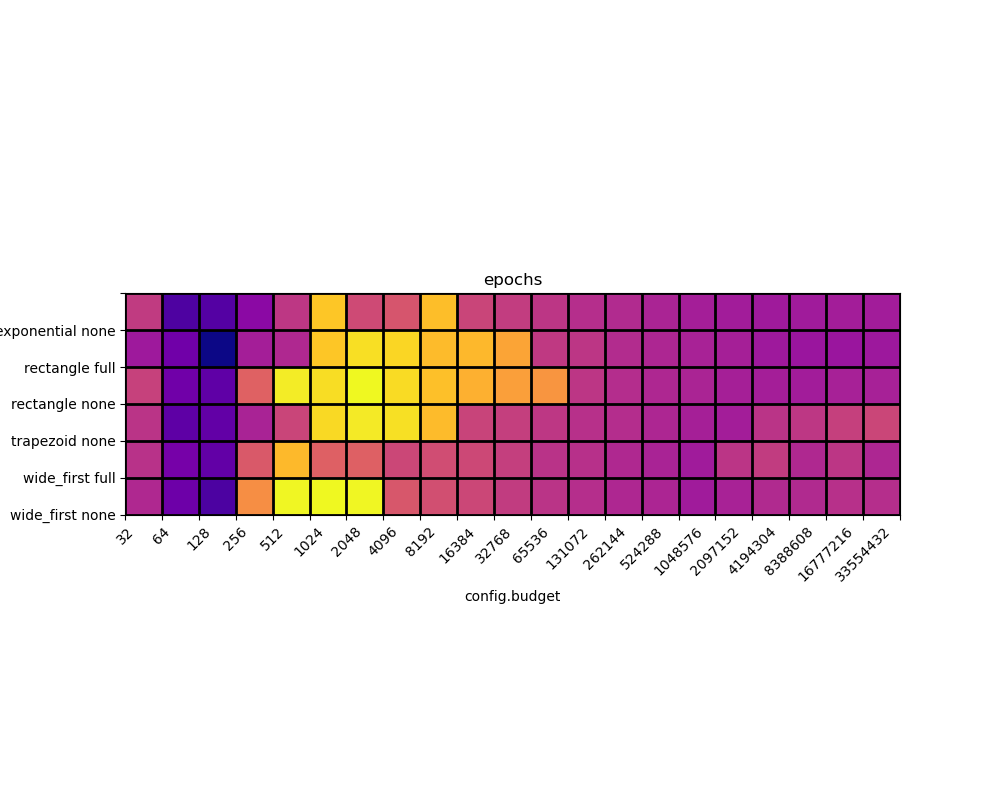

[[ 603.86666667  309.86666667  323.7         450.13333333  595.53333333
   986.53333333  654.7         685.53333333  968.13333333  637.3
   611.63333333  590.73333333  568.13333333  554.63333333  534.66666667
   516.9         510.83333333  502.7         508.33333333  513.43333333
   509.06451613]
 [ 499.8         386.          191.83333333  517.2         550.4
   984.1        1039.4        1020.96666667  959.8         952.46666667
   909.          602.8         590.73333333  559.43333333  543.6
   528.63333333  520.3         501.5         489.76666667  490.8
   497.73333333]
 [ 624.86666667  387.13333333  348.46666667  726.83333333 1067.
  1033.86666667 1093.         1032.43333333  971.56666667  935.4
   895.43333333  868.73333333  591.8         561.63333333  544.36666667
   533.73333333  519.63333333  516.26666667  510.3         525.06666667
   525.06666667]
 [ 584.7         344.13333333  356.96666667  531.83333333  638.6
  1028.8        1063.5        1042.03333333  962.66666667  633.

<IPython.core.display.Javascript object>


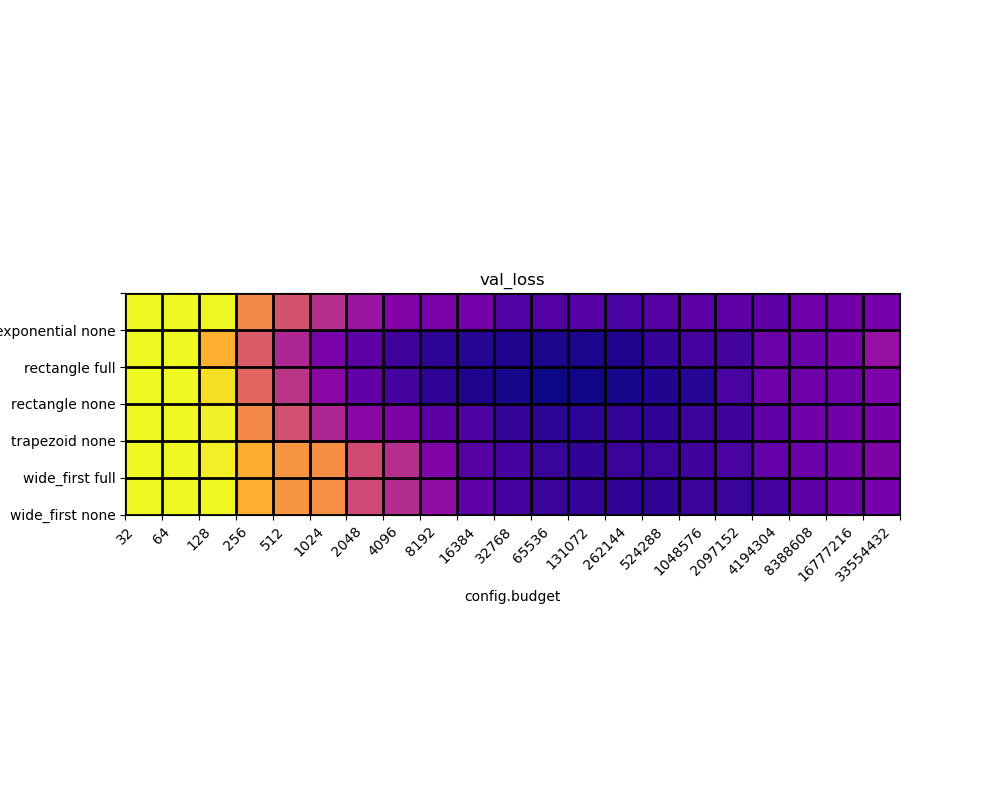

[[-3.48653608 -3.53925682 -3.85930455 -4.13430124 -4.31277488 -4.43737832
  -4.52590382 -4.59034094 -4.6182751  -4.63220301 -4.71178578 -4.70996626
  -4.70132865 -4.73366975 -4.70473516 -4.6896203  -4.67912321 -4.68697858
  -4.64754103 -4.64270957 -4.63134426]
 [-3.56676323 -3.57321725 -4.02702172 -4.28694041 -4.46437985 -4.61660912
  -4.6891986  -4.75748856 -4.79683817 -4.81379354 -4.82607153 -4.82854109
  -4.82819091 -4.82308017 -4.7782559  -4.74912991 -4.74212473 -4.65267261
  -4.64786101 -4.62134683 -4.54130673]
 [-3.53934023 -3.47605163 -3.90997616 -4.24557014 -4.41914641 -4.57503064
  -4.67787487 -4.74359006 -4.79525961 -4.82432936 -4.84152963 -4.85483659
  -4.84882193 -4.83690501 -4.82252088 -4.81568788 -4.7323859  -4.64664569
  -4.64455888 -4.64416694 -4.60565415]
 [-3.5287619  -3.58416619 -3.87585957 -4.14248699 -4.32284585 -4.46435826
  -4.57033465 -4.60098646 -4.68937589 -4.72277517 -4.7806339  -4.7981951
  -4.79709668 -4.78652391 -4.79196624 -4.76383208 -4.75032644 -4.68025

<IPython.core.display.Javascript object>


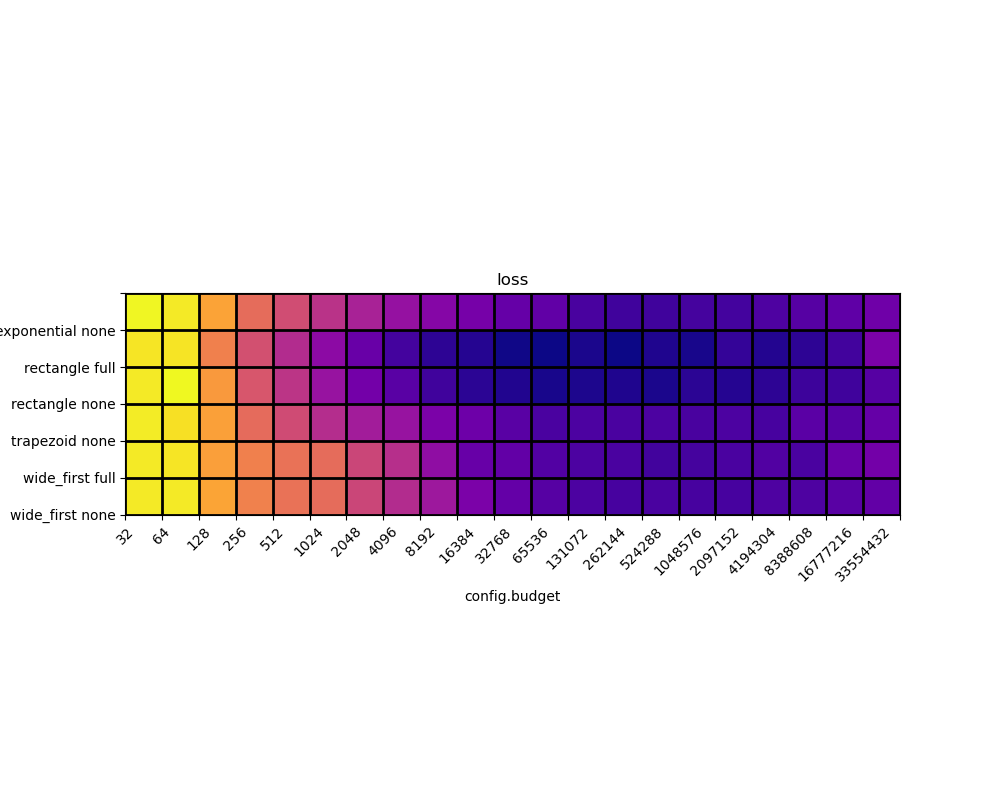

[[-3.46928067 -3.52173815 -3.85651677 -4.16697607 -4.36569352 -4.54276183
  -4.65391482 -4.76130634 -4.84542193 -4.91666297 -5.00159711 -5.02459941
  -5.13562886 -5.17298487 -5.16857337 -5.14615047 -5.15284513 -5.10978702
  -5.07135682 -5.03113509 -4.95578438]
 [-3.5491138  -3.5555087  -4.04936769 -4.34559519 -4.58396107 -4.80462018
  -4.98390434 -5.15178788 -5.24991428 -5.28323229 -5.3512344  -5.35321717
  -5.31893222 -5.35883228 -5.30066665 -5.32370187 -5.22128566 -5.29154486
  -5.25312014 -5.15867495 -4.89243025]
 [-3.52181962 -3.46012356 -3.91222649 -4.30765937 -4.52723824 -4.74733887
  -4.93540944 -5.06174233 -5.16760378 -5.2580231  -5.29841685 -5.32646125
  -5.30974983 -5.30283178 -5.31793088 -5.26203899 -5.28036321 -5.24912826
  -5.18151756 -5.1672991  -5.07486572]
 [-3.51304788 -3.56883157 -3.87418378 -4.17286146 -4.37697122 -4.57271639
  -4.68501689 -4.75023575 -4.89189424 -4.96554785 -5.06061739 -5.12232834
  -5.1161037  -5.12294949 -5.12053279 -5.13201652 -5.11581062 -5.1371

<IPython.core.display.Javascript object>


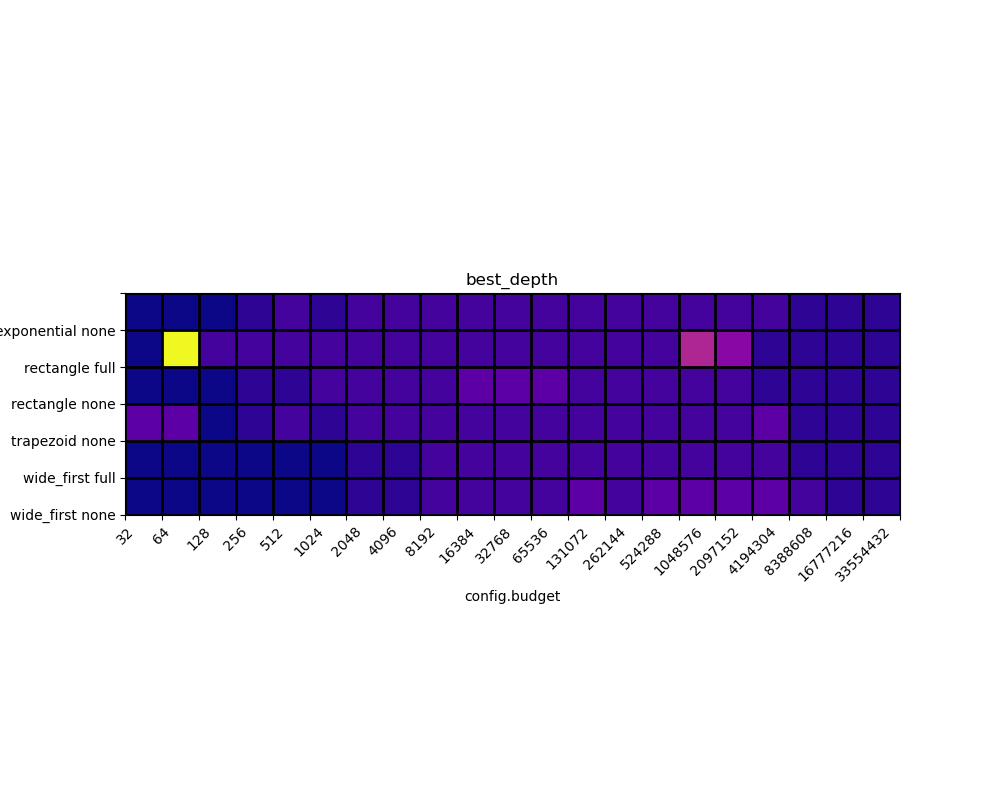

[[ 2.  2.  2.  3.  4.  3.  4.  4.  4.  4.  4.  4.  4.  4.  4.  4.  4.  4.
   3.  3.  3.]
 [ 2. 20.  4.  4.  4.  4.  4.  4.  4.  4.  4.  4.  4.  4.  4.  9.  7.  3.
   3.  3.  3.]
 [ 2.  2.  2.  3.  3.  4.  4.  4.  4.  5.  5.  5.  4.  4.  4.  4.  4.  3.
   3.  3.  3.]
 [ 5.  5.  2.  3.  4.  3.  4.  4.  4.  4.  4.  4.  4.  4.  4.  4.  4.  5.
   3.  3.  3.]
 [ 2.  2.  2.  2.  2.  2.  3.  3.  4.  4.  4.  4.  4.  4.  4.  4.  4.  4.
   3.  3.  3.]
 [ 2.  2.  2.  2.  2.  2.  3.  3.  4.  4.  4.  4.  5.  4.  5.  5.  5.  5.
   4.  3.  3.]]
['exponential none', 'rectangle full', 'rectangle none', 'trapezoid none', 'wide_first full', 'wide_first none']
[32, 64, 128, 256, 512, 1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
40.63333333333333 5055.05


<IPython.core.display.Javascript object>


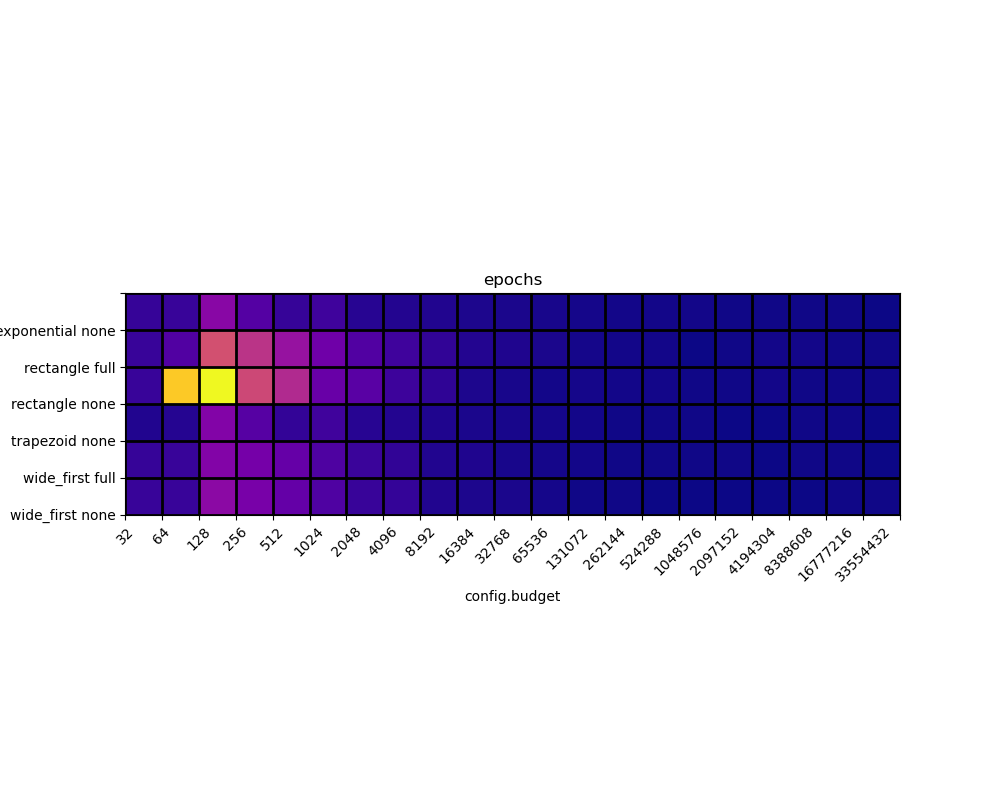

[[ 429.56666667  440.5        1446.5         777.93333333  416.13333333
   523.2         265.16666667  228.5         198.93333333  164.13333333
   154.46666667  124.3         110.3          97.2          87.73333333
    80.83333333   71.9          64.5          69.56666667   63.76666667
    57.7       ]
 [ 443.36666667  741.25       2705.58333333 2221.8        1633.9
  1111.45        741.46666667  526.06666667  357.05        235.33333333
   188.6         140.08333333  111.73333333   96.95         92.11666667
    56.26666667   65.           90.6          82.88333333   79.03389831
    66.53333333]
 [ 443.43333333 4503.73333333 5055.05       2574.16666667 2046.65
  1027.06666667  831.36666667  504.26666667  334.88333333  177.4
   125.65         93.05        110.18333333   93.08333333   82.9
    68.76666667   70.58333333   86.71666667   74.71666667   72.36666667
    67.66666667]
 [ 211.5         249.63333333 1364.2         797.          384.43333333
   537.3         264.23333333  221.3    

<IPython.core.display.Javascript object>


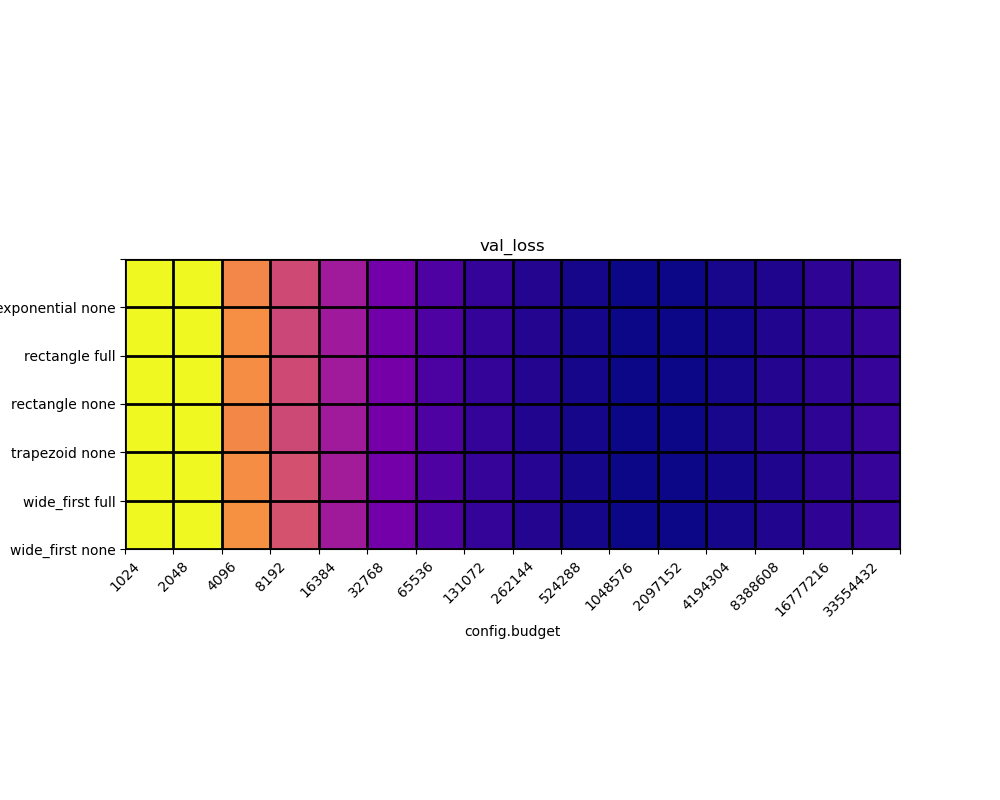

[[ 0.41953754 -0.45068368 -1.10180245 -1.53067898 -1.87892872 -2.15057156
  -2.35716109 -2.47839842 -2.55766608 -2.60399059 -2.62929322 -2.631762
  -2.60284545 -2.57658013 -2.5176318  -2.47380686]
 [ 0.4125138  -0.47958332 -1.05460819 -1.55148089 -1.89831111 -2.16304258
  -2.35445699 -2.47914393 -2.55982924 -2.60482603 -2.63170518 -2.63602721
  -2.6149574  -2.56622841 -2.51863917 -2.47446311]
 [ 0.41355344 -0.47789129 -1.06698529 -1.52902192 -1.87826685 -2.14690863
  -2.35883064 -2.4823684  -2.55909305 -2.60805052 -2.63071978 -2.63190632
  -2.61110311 -2.55390276 -2.51069796 -2.47300919]
 [ 0.32464181 -0.47465412 -1.1007756  -1.53646673 -1.87780884 -2.14362726
  -2.35590228 -2.48589344 -2.56129114 -2.60516198 -2.63664583 -2.6370917
  -2.59806183 -2.55754166 -2.51421677 -2.46240961]
 [ 0.41563655 -0.47039617 -1.05990324 -1.47549048 -1.87658726 -2.15101513
  -2.35310748 -2.47624243 -2.55067854 -2.60955586 -2.6334706  -2.63450451
  -2.61505089 -2.56988904 -2.51716382 -2.47451923]
 [ 0.413

<IPython.core.display.Javascript object>


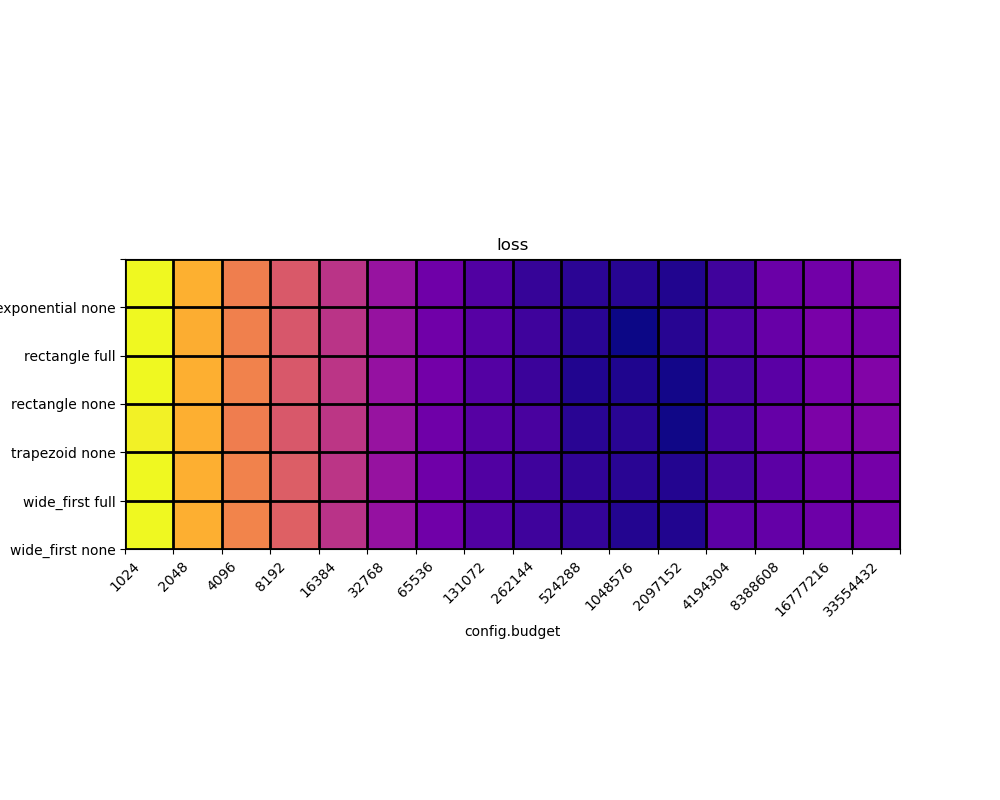

[[ 0.42618287 -0.45916549 -1.17112968 -1.79201586 -2.43889295 -3.01098361
  -3.57569023 -3.9566275  -4.26689116 -4.39073982 -4.42474233 -4.48252275
  -4.15582573 -3.6252441  -3.53473872 -3.397979  ]
 [ 0.41944216 -0.49421486 -1.15076417 -1.83450304 -2.43647627 -3.03429995
  -3.55788312 -3.87772398 -4.16960425 -4.40773918 -4.65352173 -4.42272555
  -3.96897202 -3.66809111 -3.439771   -3.44824549]
 [ 0.421076   -0.47938071 -1.11153943 -1.80753239 -2.4270144  -3.04902548
  -3.51980262 -3.90753423 -4.21262658 -4.47758097 -4.50449949 -4.60376773
  -4.09375172 -3.8284955  -3.4949864  -3.32031978]
 [ 0.3317992  -0.4751181  -1.18594543 -1.81066565 -2.40354572 -3.0166504
  -3.57280844 -3.88482782 -4.05090646 -4.40341838 -4.40140219 -4.615614
  -4.02222118 -3.69465914 -3.39352765 -3.33650464]
 [ 0.42326583 -0.47997166 -1.11924199 -1.6976227  -2.41895572 -3.0313494
  -3.57345646 -3.95383819 -4.16203974 -4.33112545 -4.40038275 -4.47313797
  -4.09553605 -3.80195721 -3.56842968 -3.50091042]
 [ 0.4207

<IPython.core.display.Javascript object>


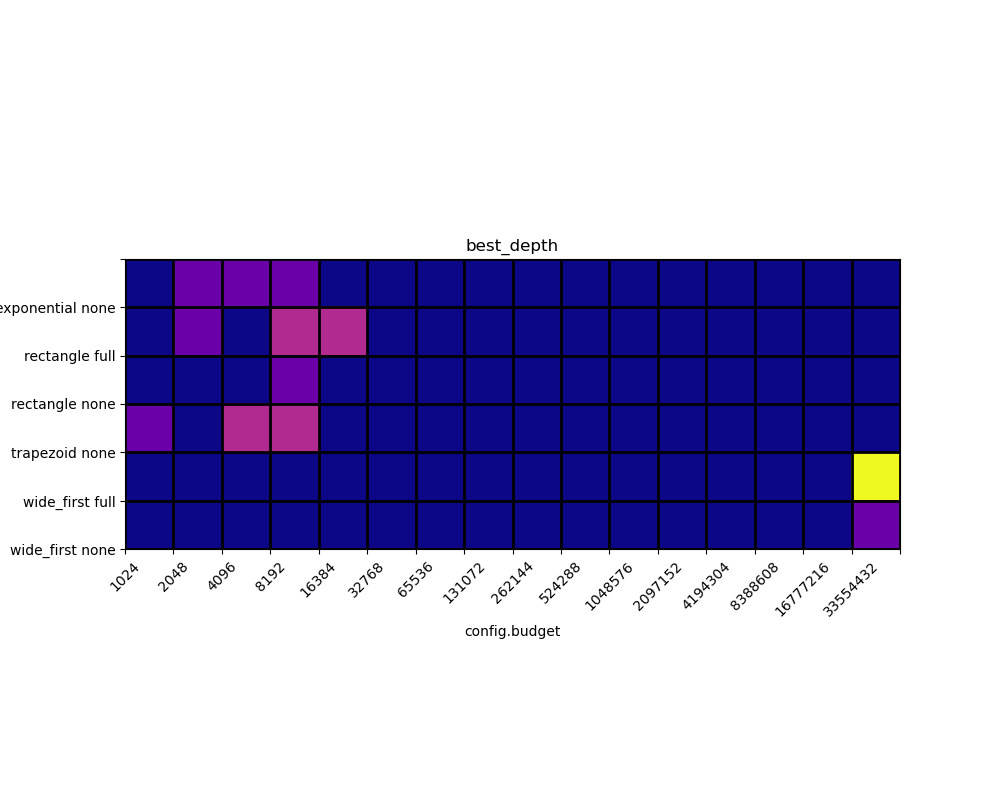

[[2. 3. 3. 3. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
 [2. 3. 2. 4. 4. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
 [2. 2. 2. 3. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
 [3. 2. 4. 4. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
 [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 7.]
 [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 3.]]
['exponential none', 'rectangle full', 'rectangle none', 'trapezoid none', 'wide_first full', 'wide_first none']
[1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
3.9523809523809526 838.0833333333334


<IPython.core.display.Javascript object>


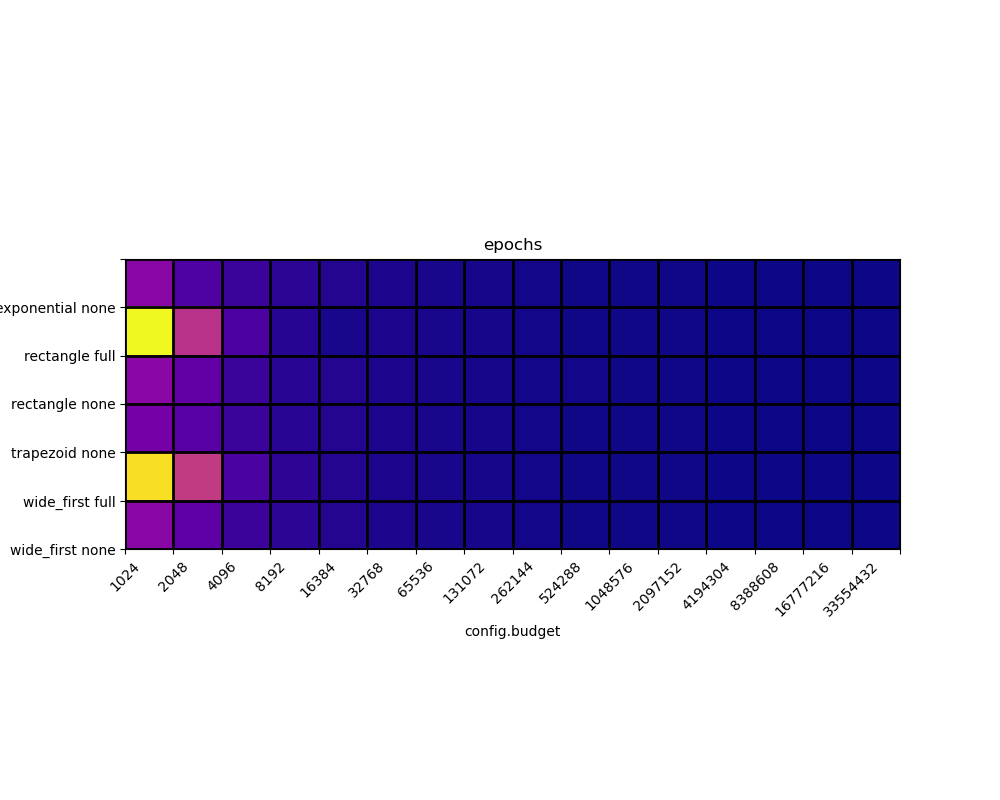

[[239.76666667 117.33333333  72.6         46.4         35.4
   25.13333333  19.6         15.66666667  12.83333333  10.4
    8.6          7.7          6.43333333   4.4          4.36666667
    4.36666667]
 [838.08333333 360.61666667 109.83333333  38.93333333  19.56666667
   25.13333333  19.51666667  15.01666667  12.26666667  10.3
    9.35         7.63333333   5.48333333   4.96666667   4.18333333
    3.95238095]
 [239.4        154.06666667  72.8         43.63333333  35.06666667
   25.8         19.06666667  15.33333333  12.63333333  10.63333333
    8.76666667   8.1          6.           5.06666667   4.56666667
    4.2       ]
 [194.03333333 132.16666667  72.53333333  44.53333333  33.93333333
   25.5         19.73333333  15.          11.73333333  10.2
    8.36666667   8.16666667   6.2          4.86666667   4.03333333
    4.16666667]
 [786.8        386.86666667 107.9         51.93333333  34.38333333
   25.06666667  19.75        15.55        12.43333333  10.1
    8.35         7.58333333   6.0

<IPython.core.display.Javascript object>


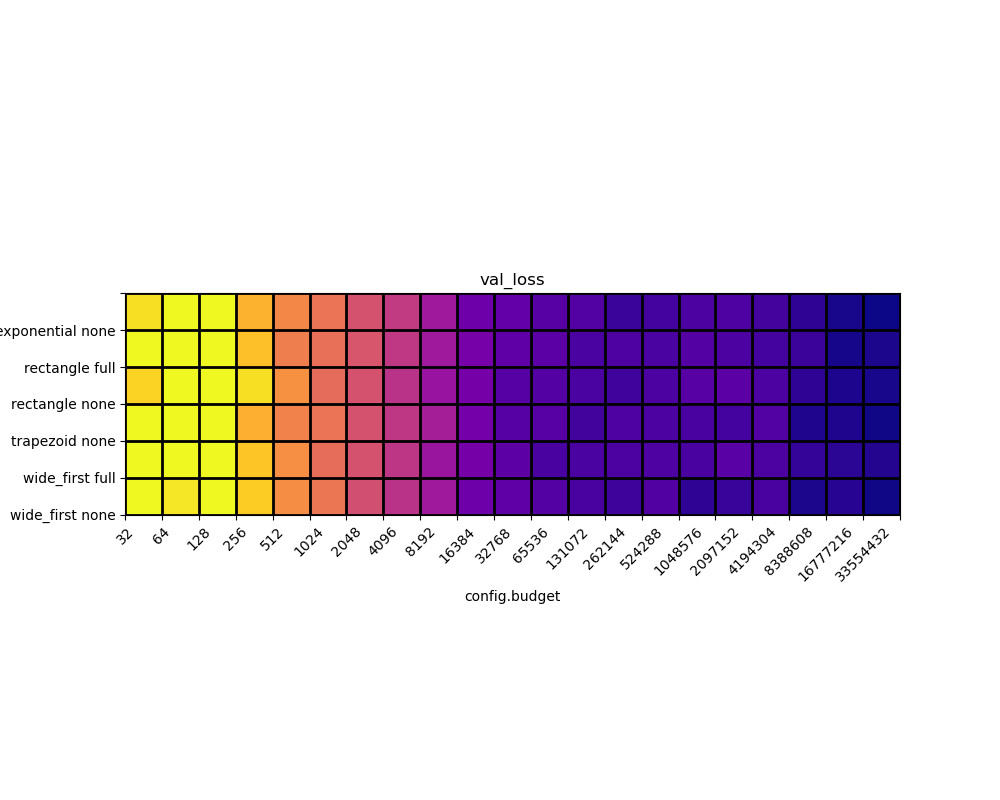

[[-0.21581653 -0.2045495  -0.16556011 -0.2399575  -0.26495616 -0.27669974
  -0.30097658 -0.31835745 -0.3431089  -0.37053972 -0.37553494 -0.38215196
  -0.38502079 -0.39760068 -0.39248501 -0.38838941 -0.38755412 -0.39149272
  -0.40223178 -0.41101272 -0.41489389]
 [-0.19109929 -0.1841606  -0.20427502 -0.2326479  -0.27051337 -0.28047994
  -0.29837422 -0.31999356 -0.34295132 -0.36588902 -0.37886334 -0.38067781
  -0.38924795 -0.38660077 -0.38860092 -0.38383796 -0.38819493 -0.39215651
  -0.39629863 -0.41233389 -0.41056424]
 [-0.22224879 -0.19608715 -0.20342124 -0.21596522 -0.25887287 -0.28264209
  -0.30068345 -0.32423066 -0.34735738 -0.36691955 -0.38358595 -0.38440448
  -0.38862195 -0.39362728 -0.38824055 -0.38253084 -0.38104881 -0.38825775
  -0.40209456 -0.40916262 -0.41152934]
 [-0.19056912 -0.20275913 -0.20392103 -0.24160329 -0.26788003 -0.27690165
  -0.30107707 -0.320437   -0.33905364 -0.36719359 -0.38308411 -0.38224829
  -0.39293452 -0.38722277 -0.38825773 -0.39016061 -0.39205298 -0.3848

<IPython.core.display.Javascript object>


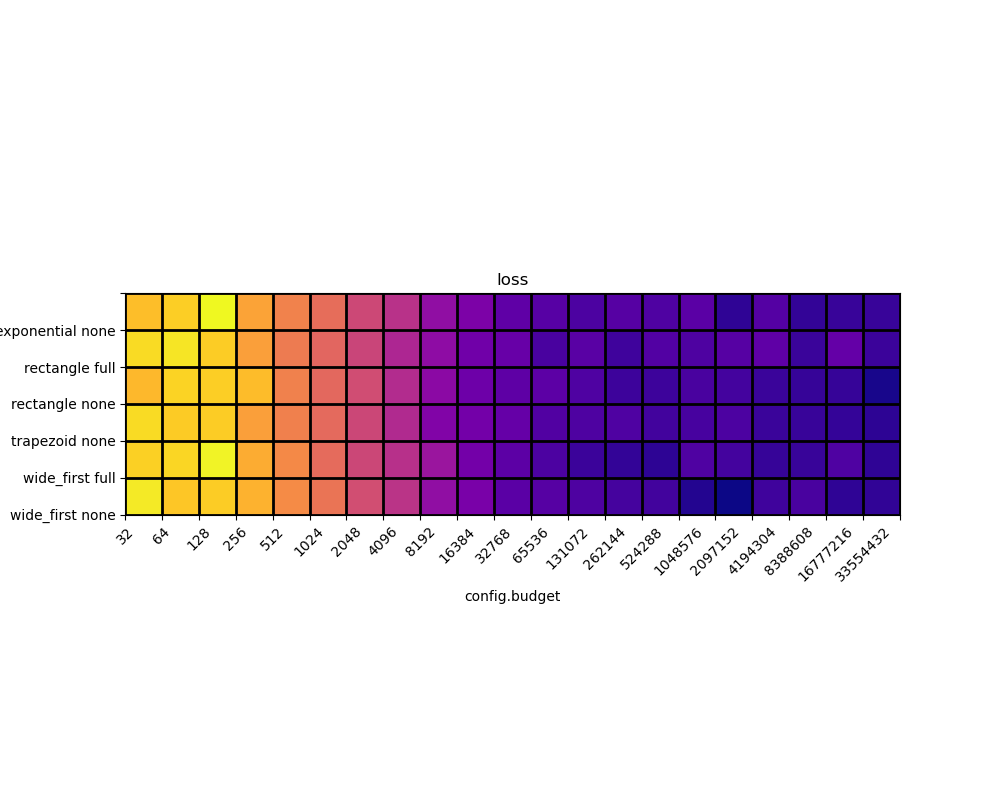

[[-0.50045187 -0.47167223 -0.39568385 -0.5548534  -0.62675829 -0.67738272
  -0.77367722 -0.83383603 -0.92748086 -0.97122169 -1.02512494 -1.04252659
  -1.06347375 -1.04325934 -1.05509698 -1.03457698 -1.11247206 -1.04799377
  -1.10581145 -1.09715109 -1.09850588]
 [-0.4477337  -0.43109506 -0.47411426 -0.56435947 -0.64533169 -0.69424158
  -0.7813508  -0.86280449 -0.93261748 -0.9950403  -1.0106637  -1.06746182
  -1.03898092 -1.08585575 -1.05114811 -1.05847154 -1.04470521 -1.02642305
  -1.09648579 -1.01839795 -1.09292211]
 [-0.51367711 -0.4616419  -0.47291132 -0.50504595 -0.62984409 -0.69024516
  -0.76158266 -0.84695171 -0.93855066 -0.99970995 -1.02810583 -1.03279725
  -1.05668821 -1.08969112 -1.08785966 -1.06726637 -1.075926   -1.09458615
  -1.10136252 -1.10247183 -1.14483609]
 [-0.44696879 -0.47664619 -0.47502746 -0.5636806  -0.63292814 -0.68757093
  -0.77570296 -0.85433227 -0.96211889 -0.98658861 -1.01539385 -1.05364211
  -1.06070406 -1.05658934 -1.07883594 -1.07140171 -1.06266561 -1.0963

<IPython.core.display.Javascript object>


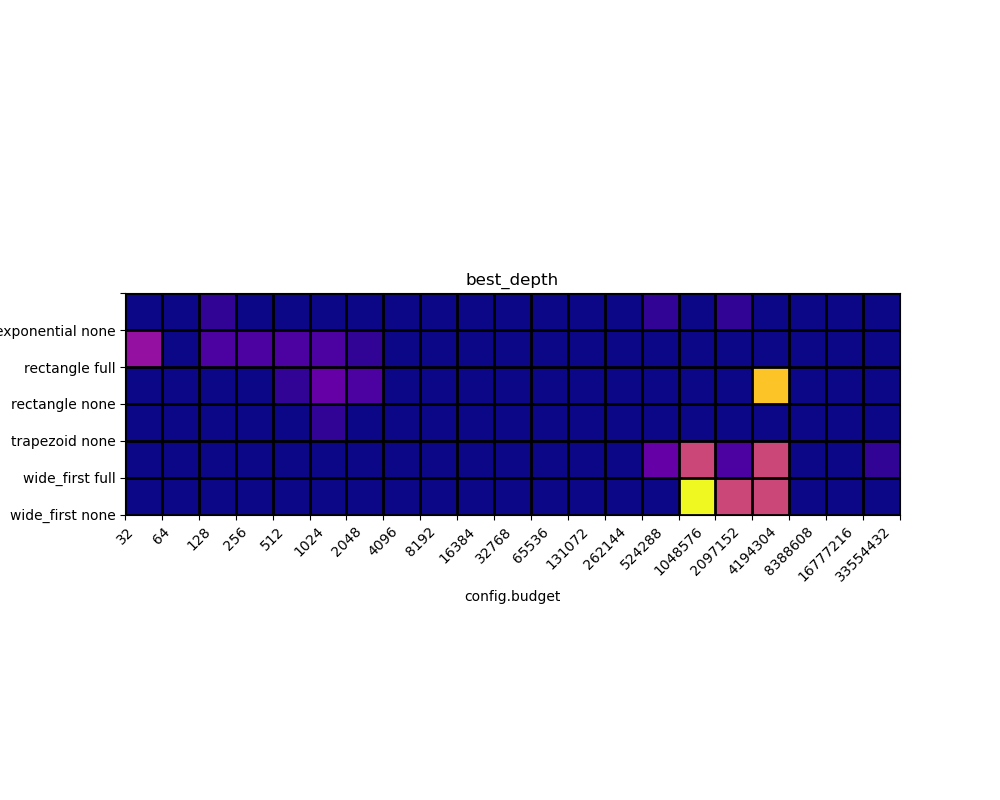

[[ 2.  2.  3.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  3.  2.  3.  2.
   2.  2.  2.]
 [ 7.  2.  4.  4.  4.  4.  3.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.
   2.  2.  2.]
 [ 2.  2.  2.  2.  3.  5.  4.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2. 16.
   2.  2.  2.]
 [ 2.  2.  2.  2.  2.  3.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.
   2.  2.  2.]
 [ 2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  5. 10.  4. 10.
   2.  2.  3.]
 [ 2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2. 18. 10. 10.
   2.  2.  2.]]
['exponential none', 'rectangle full', 'rectangle none', 'trapezoid none', 'wide_first full', 'wide_first none']
[32, 64, 128, 256, 512, 1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
3.966666666666667 25.033333333333335


<IPython.core.display.Javascript object>


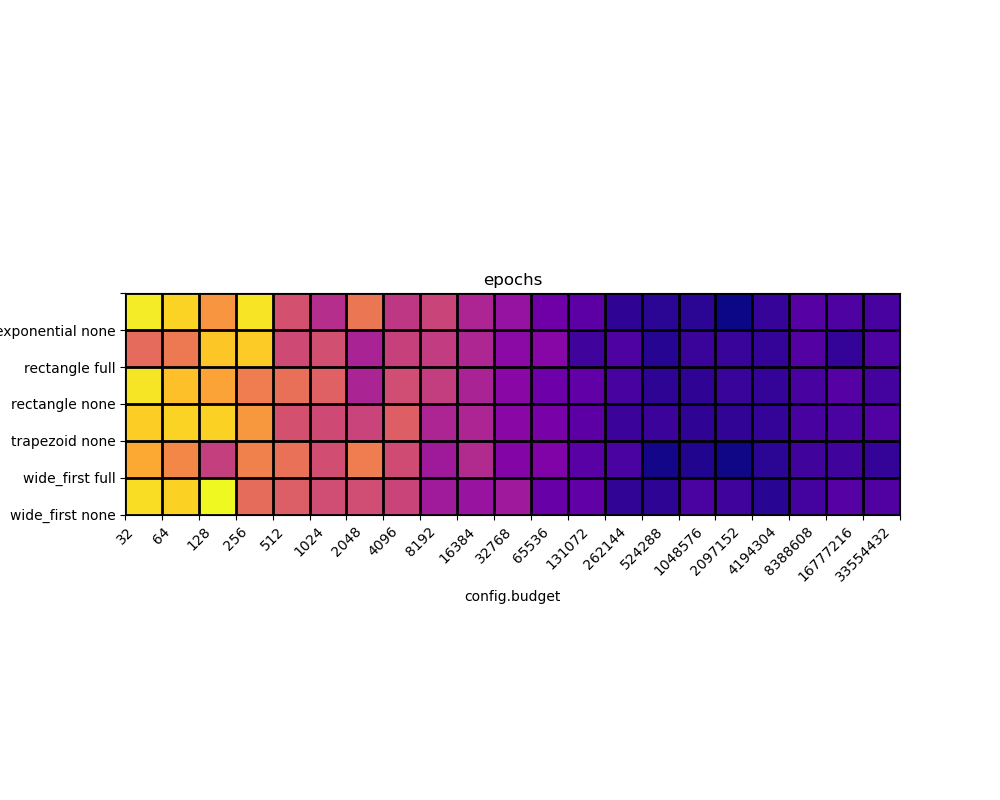

[[24.43333333 23.2        19.83333333 23.96666667 15.26666667 12.7
  17.86666667 13.4        14.4        12.1        10.63333333  8.43333333
   7.43333333  5.23333333  5.06666667  5.1         3.96666667  5.6
   7.13333333  6.83333333  6.36666667]
 [17.06666667 18.06666667 22.56666667 22.76666667 14.8        15.1
  11.93333333 14.1        13.73333333 12.16666667 10.03333333  9.76666667
   6.03333333  6.76666667  4.86666667  5.7         5.63333333  5.4
   7.03333333  5.36666667  6.73333333]
 [24.06666667 22.2        20.63333333 18.3        17.4        16.4
  11.96666667 14.96666667 13.9        11.86666667  9.96666667  8.33333333
   7.7         6.4         5.2         5.23333333  5.66666667  5.36666667
   6.43333333  7.13333333  6.23333333]
 [22.96666667 23.2        23.13333333 19.93333333 15.3        14.8
  14.3        16.26666667 12.1        12.1         9.93333333  9.06666667
   7.43333333  5.8         5.83333333  5.26666667  5.3         5.36666667
   6.4         6.56666667  7.        

<IPython.core.display.Javascript object>


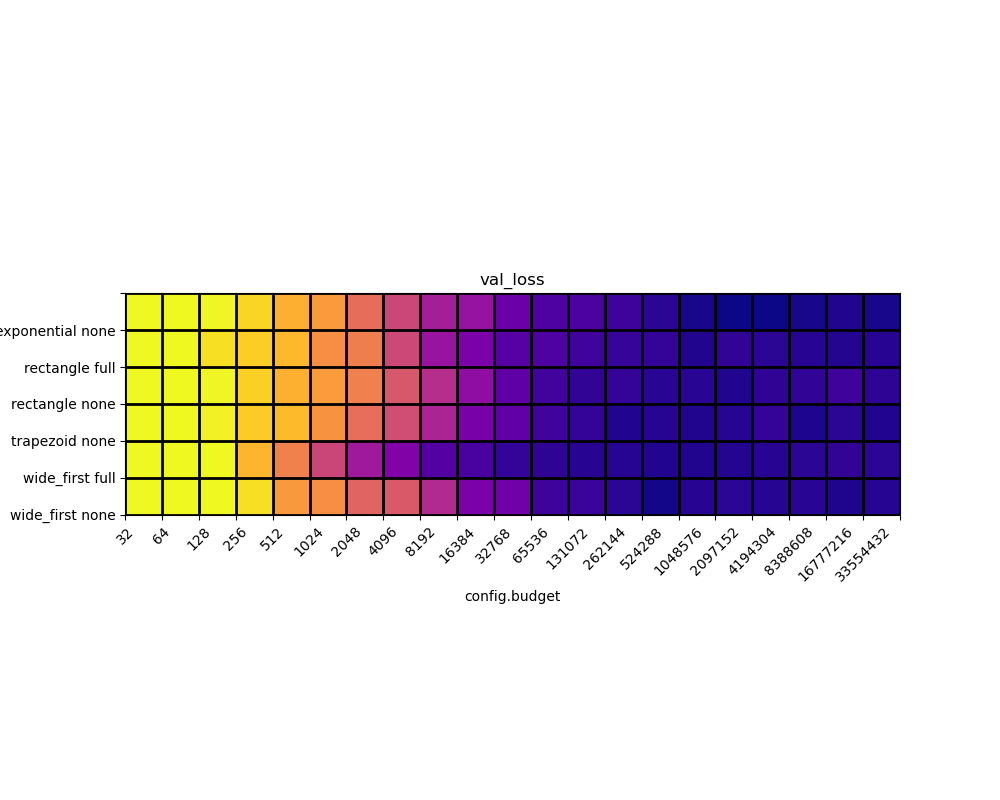

[[ 0.11797549  0.06817063  0.06183177  0.05057891  0.0344967   0.02533986
   0.00347664 -0.01802066 -0.04074229 -0.04802822 -0.06660621 -0.07879083
  -0.07928511 -0.08508294 -0.09194275 -0.09753569 -0.09974799 -0.10027735
  -0.09765934 -0.09495672 -0.09760525]
 [ 0.10035025  0.07075343  0.05420442  0.04744124  0.03835502  0.02062653
   0.01192995 -0.01749514 -0.04711815 -0.06053729 -0.07523331 -0.07906561
  -0.0841236  -0.0877417  -0.08876797 -0.09463366 -0.08985424 -0.09179405
  -0.09286297 -0.09438613 -0.09306265]
 [ 0.11243919  0.07359283  0.06190701  0.04821224  0.0353771   0.02639587
   0.01282116 -0.008842   -0.03196293 -0.05129385 -0.07194544 -0.08310438
  -0.08959916 -0.0885728  -0.09204703 -0.09219292 -0.09475806 -0.0902045
  -0.08986118 -0.0844217  -0.09068358]
 [ 0.11819452  0.07183634  0.06067872  0.04634145  0.03950834  0.0220379
   0.0039406  -0.01503024 -0.03781295 -0.06151352 -0.07129223 -0.08420385
  -0.08901876 -0.09492643 -0.09323885 -0.09472886 -0.0937189  -0.088838

<IPython.core.display.Javascript object>


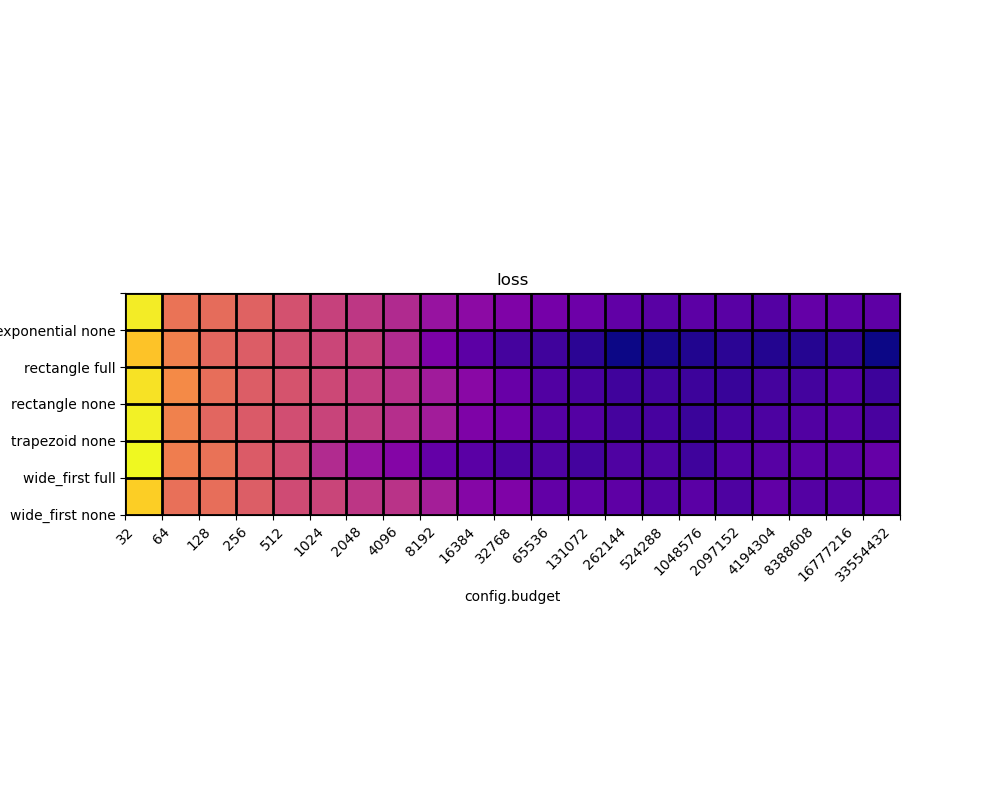

[[ 2.10825577e-01  1.41091793e-01  1.35491478e-01  1.29073137e-01
   1.16343425e-01  1.04579024e-01  9.70538069e-02  8.64383092e-02
   6.97304461e-02  6.28028503e-02  5.49536406e-02  4.92749371e-02
   4.50766236e-02  3.82531021e-02  3.39231434e-02  3.56221393e-02
   3.38541816e-02  3.15991094e-02  4.00478264e-02  3.68825147e-02
   3.67656716e-02]
 [ 1.88995171e-01  1.48975728e-01  1.32705480e-01  1.24542501e-01
   1.15459062e-01  1.07376534e-01  1.04083270e-01  8.77318061e-02
   5.33483292e-02  3.53515650e-02  2.38203976e-02  2.07891397e-02
   1.09195424e-02 -5.68191668e-04  2.86937165e-03  6.83180969e-03
   1.09208611e-02  7.54754157e-03  8.09040918e-03  1.49341925e-02
  -1.58254906e-04]
 [ 2.05080066e-01  1.55684411e-01  1.37760362e-01  1.24574721e-01
   1.17714146e-01  1.09238468e-01  1.00741807e-01  9.14727583e-02
   7.55650271e-02  6.08367488e-02  4.20489637e-02  2.96406648e-02
   2.51461253e-02  2.12301664e-02  2.17224475e-02  1.94271223e-02
   1.70724498e-02  2.32281722e-02  2.3

<IPython.core.display.Javascript object>


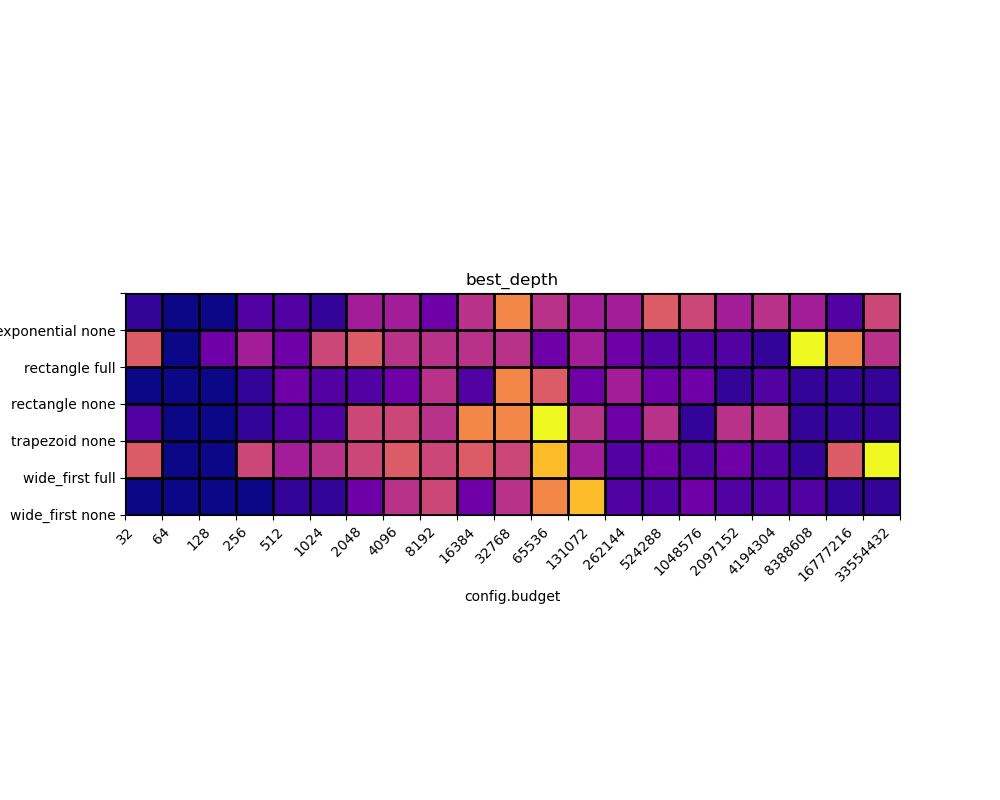

[[ 3.  2.  2.  4.  4.  3.  7.  7.  5.  8. 12.  8.  7.  7. 10.  9.  7.  8.
   7.  4.  9.]
 [10.  2.  5.  7.  5.  9. 10.  8.  8.  8.  8.  5.  7.  5.  4.  4.  4.  3.
  16. 12.  8.]
 [ 2.  2.  2.  3.  5.  4.  4.  5.  8.  4. 12. 10.  5.  7.  5.  5.  3.  4.
   3.  3.  3.]
 [ 4.  2.  2.  3.  4.  4.  9.  9.  8. 12. 12. 16.  8.  5.  8.  3.  8.  8.
   3.  3.  3.]
 [10.  2.  2.  9.  7.  8.  9. 10.  9. 10.  9. 14.  7.  4.  5.  4.  5.  4.
   3. 10. 16.]
 [ 2.  2.  2.  2.  3.  3.  5.  8.  9.  5.  8. 12. 14.  4.  4.  5.  4.  4.
   4.  3.  3.]]
['exponential none', 'rectangle full', 'rectangle none', 'trapezoid none', 'wide_first full', 'wide_first none']
[32, 64, 128, 256, 512, 1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
16.966666666666665 332.76666666666665


<IPython.core.display.Javascript object>


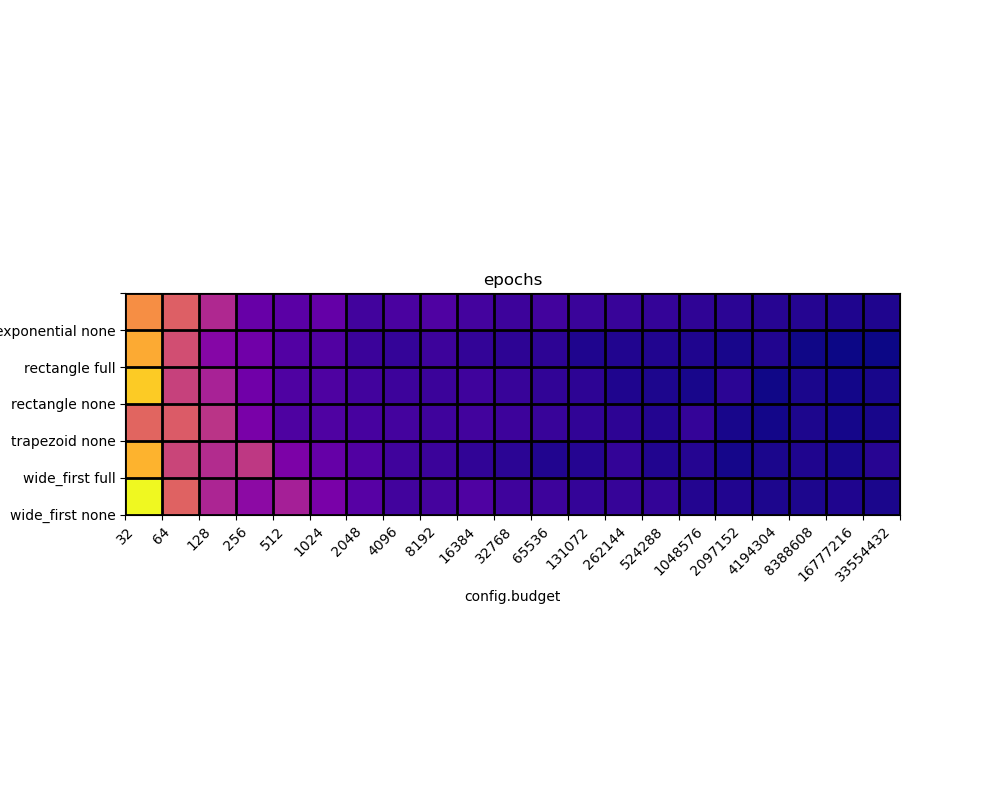

[[247.73333333 201.2        141.56666667  78.5         68.43333333
   75.4         50.2         55.5         59.96666667  50.8
   45.96666667  49.4         43.26666667  42.53333333  39.9
   35.56666667  34.13333333  31.16666667  29.8         26.83333333
   26.33333333]
 [273.33333333 182.73333333 102.7         85.53333333  61.8
   60.86666667  44.6         40.06666667  45.53333333  38.73333333
   34.73333333  34.6         26.2         27.83333333  27.96666667
   25.8         22.2         27.76666667  19.36666667  16.96666667
   18.06666667]
 [298.7        169.46666667 134.46666667  85.9         59.1
   58.          50.1         45.76666667  44.46666667  47.23333333
   42.43333333  36.86666667  34.8         26.7         24.83333333
   22.43333333  33.2         19.43333333  23.86666667  20.46666667
   22.46666667]
 [207.3        197.53333333 154.63333333  92.73333333  58.7
   59.06666667  53.56666667  50.33333333  47.63333333  49.5
   45.93333333  42.76666667  36.76666667  34.66666667  2

In [18]:
dataset_names = ['529_pollen',
    'sleep',
    'adult',
    '537_houses',
    'nursery',
    '201_pol',
    'mnist',
    'connect_4',
    'wine_quality_white',
    ]

for dataset in dataset_names:    
    print(f'dataset: {dataset}')
    
    #     def plot_dataset(dataset):
    datasets = query_materialized_dataframe('''WHERE "groupname" IN ('exp00', 'exp01', 'exp02' ) AND "config.dataset" = '%s' ''' % (dataset, ))
#     plot_for_each(datasets, ['config.topology', 'config.residual_mode'], ['config.budget'], {})

    def get_min_var(var):
        def get_min_value(dataset):
            groups = dataset.groupby('config.depth')
            means = groups[var].mean()
            mins = means.min()
            if not(isinstance(mins, float) or isinstance(mins, int)):
                mins = mins.min()
            return np.log(mins)
        return get_min_value
    
    plot_grid_from_dataset(
        datasets,
        get_min_var('val_loss'),
        'val_loss',
        'topology',
        'config.budget',
        color_bounds = lambda data : (np.min(data), np.percentile(data, 90))
#         color_bounds = lambda data : (np.min(data), np.max(data))
        )
    
    plot_grid_from_dataset(
        datasets,
        get_min_var('loss'),
        'loss',
        'topology',
        'config.budget',
#         color_bounds = lambda data : (np.min(data), np.percentile(data, 95))
        color_bounds = lambda data : (np.min(data), np.max(data))
        )
    
    def get_min_loss_depth(dataset):
        groups = dataset.groupby('config.depth')
        means = groups['val_loss'].mean()
        if len(means) == 0:
            return 0
        return means.idxmin()
    
    plot_grid_from_dataset(
        datasets,
        get_min_loss_depth,
        'best_depth',
        'topology',
        'config.budget',
        color_bounds = lambda data : (np.min(data), np.max(data))
        )
    
    
    def get_min_loss_iters(dataset):
        groups = dataset.groupby('config.depth')
        means = groups['val_loss'].mean()
        return groups.get_group(means.idxmin())['iterations'].mean()
    
    plot_grid_from_dataset(
        datasets,
        get_min_loss_iters,
        'epochs',
        'topology',
        'config.budget',
        color_bounds = lambda data : (np.min(data), np.max(data))
        )


In [19]:
dataset_names = ['529_pollen',
    'sleep',
    'adult',
    '537_houses',
    'nursery',
    '201_pol',
    'mnist',
    'connect_4',
    'wine_quality_white',
    ]
# dataset = query_materialized_dataframe('''WHERE "config.dataset" = '%s' AND "config.topology" = '%s' AND "config.residual_mode" = '%s'  ''' % ('201_pol', 'rectangle', 'none'), fetch_history = True)
dataset = query_materialized_dataframe('''WHERE "groupname" IN ('exp02' ) AND "config.dataset" = '%s'  ''' % ('201_pol', ), additional_columns = ['history_loss', 'history_val_loss'])
len(dataset)

14829

In [20]:

def plot_trajectories(
    datasets,
    xlabel,
    ylabel,
#     seriesColumns = ['config.budget'],
    xFunction=lambda dataset : dataset['config.depth'], 
    yFunction=lambda dataset : dataset['config.depth'],
    legendFunction= lambda row : '{}'.format(row.id),
#     plotFunction=lambda x, y, code, color : plt.semilogy(x,y,code, color=color),
    legend=None,
    show=True,
    yScale = 'linear',
    xScale = 'linear',
    alpha = .05,
    plot_median = True,
    ):
    
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    ax.set_yscale(yScale)
    ax.set_xscale(xScale)
    
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    legend = []
    colors = generate_colors(len(datasets))

    for i, (index, row) in enumerate(datasets.iterrows()):
        x = list(xFunction(row))
        y = list(yFunction(row))
        legend.append(legendFunction(row))
        plt.plot(x, y, 'x--', color=colors[i])
    
    if legend is not None:
        lines = [Line2D([0], [0], color=color, lw=2) for color in colors]
        plt.legend(lines, legend)
        
    if show:
        plt.show()
    
    return fig, ax

#  dataset['config.budget'].unique()
subset = dataset # dataset[dataset['config.budget'] == 33554432]

# subset = subset[subset['loss'] > .1]
subset
# depth_subset = dataset[dataset['config.depth'] <= 16]

# q = depth_subset
# q = depth_subset[depth_subset['val_loss'] > .1]
# print(q['config.depth'])
# print(len(q))
runs = q.groupby(['config.depth']).head(30)

runs = q.sort_values('config.depth')
# # print(runs['history_val_loss'])


times = runs['timestamp'].astype(int)
times = times - times.min()
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
ax.set_yscale('log')
# ax.set_xscale(xScale)
ax.plot(times.to_numpy(), runs['loss'].to_numpy(), 'x')
ax.set_xlabel('timestamp')
ax.set_ylabel('loss')
plt.show()


fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
ax.set_xscale('log')
ax.set_yscale('log')
ax.plot(runs['config.depth'].to_numpy(), runs['loss'].to_numpy(), 'x')
ax.set_xlabel('depth')
ax.set_ylabel('loss')
plt.show()


fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
ax.set_xscale('log')
ax.set_yscale('log')
plt.plot(runs['config.budget'].to_numpy(), runs['loss'].to_numpy(), 'x')
ax.set_xlabel('budget')
ax.set_ylabel('loss')
plt.show()



fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
ax.set_xscale('log')
ax.set_yscale('log')
plt.plot(runs['config.budget'] * runs['config.depth'], runs['loss'].to_numpy(), 'x')
ax.set_xlabel('depth * budget')
ax.set_ylabel('loss')
plt.show()


fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
ax.set_xscale('log')
ax.set_yscale('log')
plt.plot(runs['config.budget'] / runs['config.depth'], runs['loss'].to_numpy(), 'x')
ax.set_xlabel('budget / depth')
ax.set_ylabel('loss')
plt.show()

# runs = q.groupby(['config.depth']).head(1).sort_values('config.depth')
# plot_trajectories(runs, 'iteration', 'val_loss', 
#                   xFunction = lambda run : range(len(run['history_val_loss'])),
#                   yFunction = lambda run : run['history_val_loss'],
#                   legendFunction = lambda run : f'{run["config.depth"]}',
#                  )

# plot_trajectories(runs, 'iteration', 'loss', 
#                   xFunction = lambda run : range(len(run['history_loss'])),
#                   yFunction = lambda run : run['history_loss'],
#                   legendFunction = lambda run : f'{run["config.depth"]}',
#                  )




# plot_trajectories(runs, 'iteration', 'val_loss', 
#                   xFunction = lambda run : range(len(run['history_val_loss'])),
#                   yFunction = lambda run : np.array(run['history_val_loss']) - (run['val_loss']),
#                   legendFunction = lambda run : run['config.depth'],
#                  )

# subset['history_val_loss']
# plt.show()



NameError: name 'q' is not defined

In [ ]:

# def scatter_plot_groups(
#     groups,
#     xlabel,
#     ylabel,
# #     seriesColumns = ['config.budget'],
#     aggregationColumns = ['config.depth'],
#     xFunction=lambda dataset : dataset['config.depth'], 
#     yFunction=lambda dataset : dataset['config.depth'],
#     legendFunction= lambda groupName : '{}'.format(groupName),
# #     plotFunction=lambda x, y, code, color : plt.semilogy(x,y,code, color=color),
#     legend=None,
#     show=True,
#     yScale = 'linear',
#     xScale = 'linear',
#     alpha = .05,
#     plot_median = True,
#     ):
    
#     fig = plt.figure()
#     ax = fig.add_subplot(1, 1, 1)
#     ax.set_yscale(yScale)
#     ax.set_xscale(xScale)
    
#     plt.xlabel(xlabel)
#     plt.ylabel(ylabel)
    
    

#     series, groupNames = split_dataframe_into_groups(datasets, groups)
#     legend = list(map(legendFunction, groupNames))
#     colors = generateColors(len(series))
# #     colors = [plt.cm.tab20(i) for i in range(0,20,2)]
#     for i, series in enumerate(series):
#         aggregationGroups, _ = split_dataframe_into_groups(series, aggregationColumns)
        
#         x = getSeriesStack(aggregationGroups, xFunction)
#         y = getSeriesStack(aggregationGroups, yFunction)
        
#         color = colors[i]
# #         pyplot.plot(x[:,0], y[:,0], 'x--', color=colors[i])
#         if plot_median:
#             plt.plot(x[:,1], y[:,1], 'x--', color=color)
#             plt.plot(x[:,0], y[:,0], '+', color=color)
#         else:
#             plt.plot(x[:,1], y[:,1], '+', color=color)
#             plt.plot(x[:,0], y[:,0], 'x--', color=color)
            
# #         plt.fill_between(x[:,1], y[:,2], y[:,3], color=color, alpha=alpha)
# #         plotFunction(xValues, yValues, 'x--', color=colors[i])
    
#     if legend is not None:
#         lines = [Line2D([0], [0], color=color, lw=2) for color in colors]
#         plt.legend(lines, legend)
    
#     plt.tick_params(axis='y', which='minor')
    
#     if yScale == 'log':
#         minorLocator = mpl.ticker.LogLocator(subs=list(range(2,10)))
#         minorFormatter = mpl.ticker.FormatStrFormatter('%5.4f')
#         ax.xaxis.set_minor_locator(minorLocator)
#         ax.xaxis.set_minor_formatter(minorFormatter)
        
#     if show:
#         plt.show()
    
#     return fig, ax
subset = dataset
# subset = subset[subset['loss'] > .2]
# groups = subset.groupby(['config.budget', 'config.topology', 'config.residual_mode', 'config.depth'])
groups = subset.groupby(['config.topology', 'config.residual_mode'])
# val_loss = groups['val_loss'].aggregate('mean')

# groups = groups.reset_index().sort_values('mean_val_loss', ascending=False)
# groups
# groups.columns = groups.columns.get_level_values(0)
# qgrid.show_grid(groups)


fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
ax.set_yscale('log')
ax.set_xscale('linear')

plt.xlabel('depth')
plt.ylabel('val_loss')

colors = generate_colors(groups.ngroups)

legend = []
for i, (name, group) in enumerate(groups):
    color = colors[i % len(colors)]
    
    x = group['config.depth']
    y = group['loss']
    plt.plot(x, y, '+', color=color)
    legend.append(name)
lines = [Line2D([0], [0], color=color, lw=2) for color in colors]
plt.legend(lines, legend)
plt.show()

# print(groups.aggregate(['mean', 'median']))
# qgrid.show_grid(subset.groupby(['config.budget', 'config.topology', 'config.residual_mode', 'config.depth']).size())

In [ ]:
bad = subset[(subset['config.budget'] == 262144) & (subset['config.topology'] == 'rectangle') & (subset['config.residual_mode'] == 'full') & (subset['config.depth'] == 20)]
bad.iloc[0]

plot_trajectories(bad, 'iteration', 'loss', 
                  xFunction = lambda run : range(len(run['history_loss'])),
                  yFunction = lambda run : run['history_loss'],
                  legendFunction = lambda run : f'{run["config.depth"]}',
                 )

In [ ]:
plot()